# RESULTS - ABACO

This is it, a notebook that compiles all the results so far. This includes the following:
1. Batch correction performance metrics on all methods used, including a comparison between prior distributions of ABaCo
2. Alpha diversity (Kruskal-Wallis test + pos hoc Dunn's test)
3. Beta diversity (PCoA + NMDS and reported PERMANOVA R^2)
4. Robustness analysis over multiple runs

## Libraries

In [2]:
# Essentials
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from matplotlib.patches import Ellipse
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from skbio.stats.ordination import pcoa
from skbio.stats.distance import DistanceMatrix, permanova
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score
import scipy.stats as stats
from scipy.stats import spearmanr
from scipy.spatial.distance import pdist, squareform
from scipy.stats import mannwhitneyu, kruskal
from statsmodels.stats.multitest import multipletests
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np
import pandas as pd
import os
import re
import random
import seaborn as sns
import networkx as nx
# User libraries
from BatchEffectDataLoader import DataPreprocess, DataTransform, one_hot_encoding
from BatchEffectCorrection import correctCombat, correctLimma_rBE, correctBMC, correctPLSDAbatch_R, correctCombatSeq, correctConQuR
from BatchEffectPlots import plotPCA, plotPCoA, plot_LISI_perplexity
from BatchEffectMetrics import all_metrics, pairwise_distance, pairwise_distance_std, PERMANOVA, pairwise_distance_multi_run, kBET, ARI, ASW, iLISI_norm
from ABaCo import abaco_run, abaco_recon, contour_plot, abaco_run_ensemble, abaco_recon_ensemble

## Loading and computation of correction data

### Data loading

In [3]:
# Load AD count
path = "data/dataset_ad.csv"
ad_count_batch_label = "batch"
ad_count_sample_label = "sample"
ad_count_bio_label = "trt"

ad_count_data = DataPreprocess(
    path,
    factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label]
)

# train DataLoader: [samples, ohe_batch]
ad_count_input_size = 567
ad_count_train_dataloader = DataLoader(
    TensorDataset(
        torch.tensor(ad_count_data.select_dtypes(include="number").values, dtype=torch.float32), # samples
        one_hot_encoding(ad_count_data[ad_count_batch_label])[0], # one hot encoded batch information
        one_hot_encoding(ad_count_data[ad_count_bio_label])[0], #one hot encoded biological information
    ),
    batch_size=1000,
)
ad_count_batch_size = 5
ad_count_bio_size = 2

# Load IBD data
path = "data/MGnify/IBD/IBD_dataset_genus.csv"
ibd_batch_label = "project ID"
ibd_sample_label = "run ID"
ibd_bio_label = "associated phenotype"

ibd_data = DataPreprocess(
    path,
    factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label]
)

# train DataLoader: [samples, ohe_batch]
ibd_input_size = 193
ibd_train_dataloader = DataLoader(
    TensorDataset(
        torch.tensor(ibd_data.select_dtypes(include="number").values, dtype=torch.float32), # samples
        one_hot_encoding(ibd_data[ibd_batch_label])[0], # one hot encoded batch information
        one_hot_encoding(ibd_data[ibd_bio_label])[0], #one hot encoded biological information
    ),
    batch_size=1000,
)
ibd_batch_size = 2
ibd_bio_size = 3

# Load DTU-GE data
path = "data/MGnify/DTU-GE/count/DTU-GE_phylum_count_data_filtered.csv"
dtu_batch_label = "pipeline"
dtu_sample_label = "accession"
dtu_bio_label = "location"

dtu_data = DataPreprocess(
    path,
    factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label]
)

# train DataLoader: [samples, ohe_batch]
dtu_input_size = 162
dtu_train_dataloader = DataLoader(
    TensorDataset(
        torch.tensor(dtu_data.select_dtypes(include="number").values, dtype=torch.float32), # samples
        one_hot_encoding(dtu_data[dtu_batch_label])[0], # one hot encoded batch information
        one_hot_encoding(dtu_data[dtu_bio_label])[0], #one hot encoded biological information
    ),
    batch_size=1000,
)
dtu_batch_size = 2
dtu_bio_size = 4

### Data statistics

In [4]:
print(ad_count_data.groupby([ad_count_batch_label, ad_count_bio_label]).size())
print(ibd_data.groupby([ibd_batch_label, ibd_bio_label]).size())
print(dtu_data.groupby([dtu_batch_label, dtu_bio_label]).size())

batch       trt  
01/07/2016  0-0.5     8
            1-2      13
09/04/2015  0-0.5     4
            1-2       5
14/04/2016  0-0.5     4
            1-2      12
14/11/2016  0-0.5     8
            1-2       9
21/09/2017  0-0.5     2
            1-2      10
dtype: int64
project ID   associated phenotype
PRJNA389280  CD                      175
             UC                       97
             nonIBD                   69
PRJNA398089  CD                       85
             UC                       46
             nonIBD                   45
dtype: int64
pipeline  location 
3.0       Australia     8
          Canada       11
          USA          30
          Zambia        7
4.1       Australia    10
          Canada       13
          USA          40
          Zambia       10
dtype: int64


### Data visualization

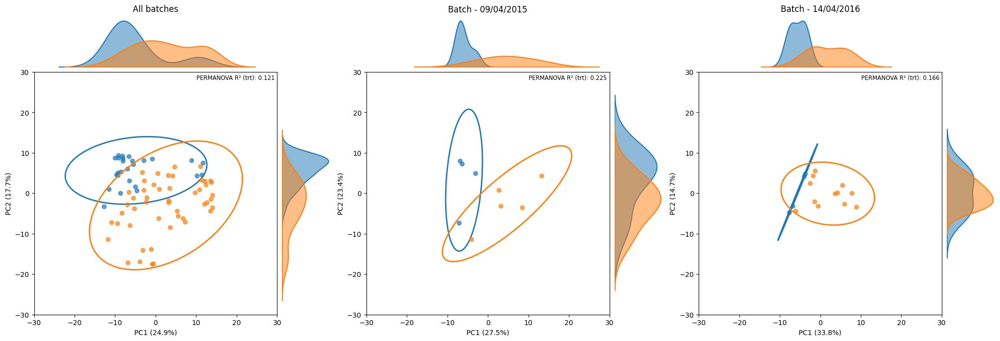

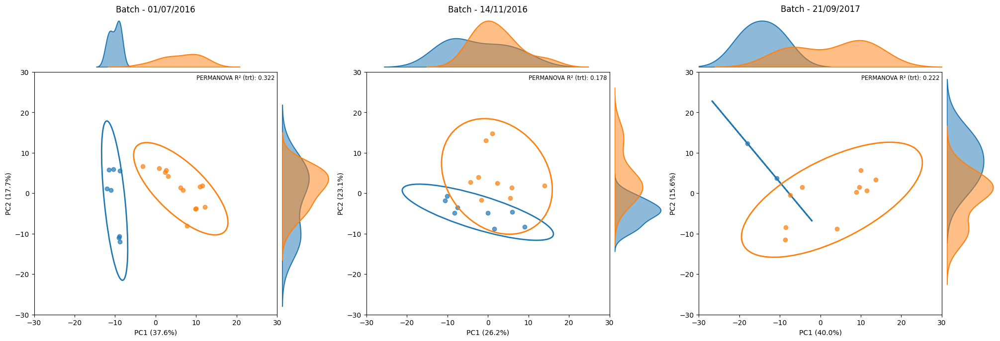

In [5]:
# Auxiliary
def permanova_ait(df, sample_label, group_label):
    samples = df[sample_label].values
    groups = df[group_label].values
    clr_data = df.select_dtypes(include = "number").values

    aitch = pdist(clr_data, metric = "euclidean")
    dist_mat = squareform(aitch)
    dm = DistanceMatrix(dist_mat, ids=samples)

    res_ait = permanova(distance_matrix=dm, grouping=groups)

    res_ait["R2"] = (
        res_ait["test statistic"]
        * (len(groups.unique()) - 1)
        / (
            res_ait["test statistic"] * (len(groups.unique()) - 1)
            + (len(samples) - len(groups.unique()))
        )
    )
    return res_ait

def pcoa_aitchison(df, sample_label, batch_label, bio_label):
    df_otu = df.select_dtypes(include="number")
    dist = pdist(df_otu, "euclidean")
    dist = squareform(dist)

    pcoa_res = pcoa(dist)
    explained = (pcoa_res.proportion_explained * 100).round(1)
    explained_dict = {"PC1": explained[0], "PC2": explained[1]}
    df_pcoa = pd.DataFrame(pcoa_res.samples[["PC1","PC2"]], columns=["PC1","PC2"])
    df_pcoa.index = (
        df.index
    )
    df_pcoa[[sample_label, batch_label, bio_label]] = df[[sample_label, batch_label, bio_label]]
    return df_pcoa, explained_dict

def plot_pcoa(df_pcoa, group_col, df, sample_label, ax, explained, palette=None, xlim=None, ylim=None):

    perma_r2 = permanova_ait(df, sample_label, group_col)["R2"]

    groups = df_pcoa[group_col].unique()
    colors = palette or plt.cm.tab10.colors
    for i, grp in enumerate(groups):
        sub = df_pcoa[df_pcoa[group_col] == grp]
        x = sub['PC1']
        y = sub['PC2']
        c = colors[i % len(colors)]
        # scatter
        ax.scatter(x, y, label=str(grp), alpha=0.7, color=c)
        # compute ellipse parameters
        cov = np.cov(x, y)
        vals, vecs = np.linalg.eigh(cov)
        # 95% confidence -> scale factor = sqrt(5.991) for 2-d chi2
        width, height = 2 * np.sqrt(vals * 5.991)
        angle = np.degrees(np.arctan2(*vecs[:,0][::-1]))
        ell = Ellipse(xy=(x.mean(), y.mean()),
                      width=width, height=height,
                      angle=angle, edgecolor=c,
                      facecolor='none', lw=2)
        ax.add_patch(ell)
    # axis labels with % var
    ax.set_xlabel(f"PC1 ({explained['PC1']:.1f}%)")
    ax.set_ylabel(f"PC2 ({explained['PC2']:.1f}%)")
    ax.legend(title=group_col, bbox_to_anchor=(1.05,1), loc='upper left')
    ax.text(0.99, 0.99, f"PERMANOVA R^2 ({group_col}): {perma_r2:.3f}", transform=ax.transAxes, ha="right", va="top", fontsize="small")
    ax.set_aspect('equal')

    if xlim is not None:
        ax.set_xlim(xlim)
    if ylim is not None:
        ax.set_ylim(ylim)

def plot_pcoa_2(
    df_pcoa,
    group_col,
    df,
    sample_label,
    ax,
    explained,
    palette=None,
    xlim=None,
    ylim=None,
    marginal_size="20%",     # size of marginals relative to main
    marginal_pad=0.1,         # padding between main and marginals
    kde_bw_adjust=1.0,        # bandwidth scaling for KDE
    alpha_kde=0.5,            # fill transparency for KDE areas
    title=None,               # optional title above the top density plot
    show_legend=True          # whether to draw the legend
):
    # compute PERMANOVA R2
    perma_r2 = permanova_ait(df, sample_label, group_col)["R2"]

    # set up axes divider for marginals
    divider = make_axes_locatable(ax)
    ax_top   = divider.append_axes("top",    size=marginal_size, pad=marginal_pad, sharex=ax)
    ax_right = divider.append_axes("right",  size=marginal_size, pad=marginal_pad, sharey=ax)

    # hide the marginal axes completely (no ticks, no spines)
    ax_top.axis('off')
    ax_right.axis('off')

    groups = df_pcoa[group_col].unique()
    colors = palette or plt.cm.tab10.colors

    handles = []
    labels  = []

    for i, grp in enumerate(groups):
        sub = df_pcoa[df_pcoa[group_col] == grp]
        x = sub['PC1'].values
        y = sub['PC2'].values
        c = colors[i % len(colors)]

        # main scatter
        pts = ax.scatter(x, y, label=str(grp), alpha=0.7, color=c)
        handles.append(pts)
        labels.append(str(grp))

        # marginal KDEs (axes are off so only the filled area shows)
        sns.kdeplot(
            x=x, ax=ax_top, bw_adjust=kde_bw_adjust,
            fill=True, alpha=alpha_kde, color=c, linewidth=1.5
        )
        sns.kdeplot(
            y=y, ax=ax_right, bw_adjust=kde_bw_adjust,
            fill=True, alpha=alpha_kde, color=c, linewidth=1.5
        )

        # 95% confidence ellipse
        cov = np.cov(x, y)
        vals, vecs = np.linalg.eigh(cov)
        width, height = 2 * np.sqrt(vals * 5.991)
        angle = np.degrees(np.arctan2(*vecs[:,0][::-1]))
        ell = Ellipse(
            xy=(x.mean(), y.mean()),
            width=width, height=height,
            angle=angle, edgecolor=c, facecolor='none', lw=2
        )
        ax.add_patch(ell)

    # add title above the top density plot
    if title:
        ax_top.set_title(title, pad=10)

    # optionally draw legend on top density axis
    if show_legend:
        ax_top.legend(
            handles, labels,
            title=group_col,
            bbox_to_anchor=(1.02, 1), loc='upper left',
            frameon=False
        )

    # main axis formatting
    ax.set_xlabel(f"PC1 ({explained['PC1']:.1f}%)")
    ax.set_ylabel(f"PC2 ({explained['PC2']:.1f}%)")
    ax.text(
        0.99, 0.99,
        f"PERMANOVA R² ({group_col}): {perma_r2:.3f}",
        transform=ax.transAxes, ha="right", va="top", fontsize="small"
    )
    ax.set_aspect('equal')

    if xlim is not None:
        ax.set_xlim(xlim)
    if ylim is not None:
        ax.set_ylim(ylim)

# AD_count
ad_count_data_clr = DataTransform(ad_count_data, factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label], count=True)
ad_data_study_1 = ad_count_data_clr[ad_count_data_clr[ad_count_batch_label] == "09/04/2015"]
ad_data_study_2 = ad_count_data_clr[ad_count_data_clr[ad_count_batch_label] == "14/04/2016"]
ad_data_study_3 = ad_count_data_clr[ad_count_data_clr[ad_count_batch_label] == "01/07/2016"]
ad_data_study_4 = ad_count_data_clr[ad_count_data_clr[ad_count_batch_label] == "14/11/2016"]
ad_data_study_5 = ad_count_data_clr[ad_count_data_clr[ad_count_batch_label] == "21/09/2017"]
ad_pcoa, ad_explained = pcoa_aitchison(ad_count_data_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_1, ad_explained_1 = pcoa_aitchison(ad_data_study_1, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_2, ad_explained_2 = pcoa_aitchison(ad_data_study_2, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_3, ad_explained_3 = pcoa_aitchison(ad_data_study_3, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_4, ad_explained_4 = pcoa_aitchison(ad_data_study_4, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_5, ad_explained_5 = pcoa_aitchison(ad_data_study_5, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)

fig, axes = plt.subplots(1, 3, figsize=(20,20), constrained_layout = True)

# plot_pcoa(ibd_pcoa, ibd_batch_label, ax1, explained=ibd_explained, xlim=[-30, 30], ylim=[-30, 30])
plot_pcoa_2(ad_pcoa, ad_count_bio_label, ad_count_data_clr, ad_count_sample_label, axes[0], explained=ad_explained, xlim=[-30, 30], ylim=[-30, 30], show_legend=False, title="All batches")
plot_pcoa_2(ad_pcoa_1, ad_count_bio_label, ad_data_study_1, ad_count_sample_label, axes[1], explained=ad_explained_1, xlim=[-30, 30], ylim=[-30, 30], show_legend=False, title="Batch - 09/04/2015")
plot_pcoa_2(ad_pcoa_2, ad_count_bio_label, ad_data_study_2, ad_count_sample_label, axes[2], explained=ad_explained_2, xlim=[-30, 30], ylim=[-30, 30], show_legend=False, title = "Batch - 14/04/2016")

fig, axes = plt.subplots(1, 3, figsize=(20,20), constrained_layout = True)
plot_pcoa_2(ad_pcoa_3, ad_count_bio_label, ad_data_study_3, ad_count_sample_label, axes[0], explained=ad_explained_3, xlim=[-30, 30], ylim=[-30, 30], show_legend=False, title="Batch - 01/07/2016")
plot_pcoa_2(ad_pcoa_4, ad_count_bio_label, ad_data_study_4, ad_count_sample_label, axes[1], explained=ad_explained_4, xlim=[-30, 30], ylim=[-30, 30], show_legend=False, title="Batch - 14/11/2016")
plot_pcoa_2(ad_pcoa_5, ad_count_bio_label, ad_data_study_5, ad_count_sample_label, axes[2], explained=ad_explained_5, xlim=[-30, 30], ylim=[-30, 30], show_legend=False, title="Batch - 21/09/2017")

plt.show()

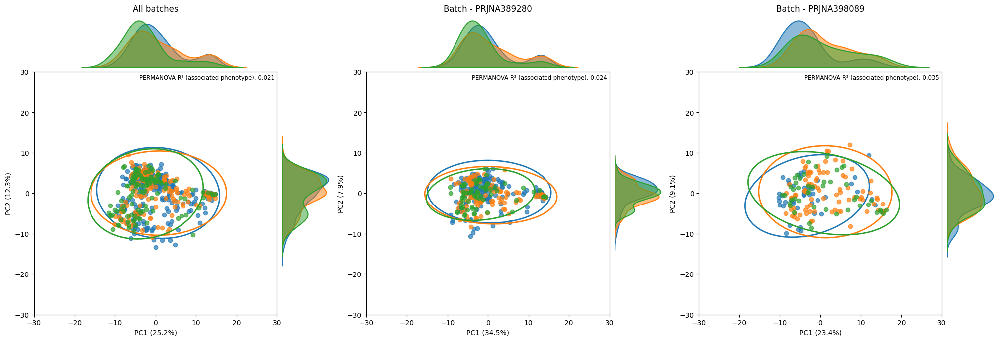

In [6]:
# IBD
ibd_data_clr = DataTransform(ibd_data, factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label], count=True)
ibd_data_study_1 = ibd_data_clr[ibd_data_clr[ibd_batch_label] == "PRJNA389280"]
ibd_data_study_2 = ibd_data_clr[ibd_data_clr[ibd_batch_label] == "PRJNA398089"]
ibd_pcoa, ibd_explained = pcoa_aitchison(ibd_data_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_1, ibd_explained_1 = pcoa_aitchison(ibd_data_study_1, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_2, ibd_explained_2 = pcoa_aitchison(ibd_data_study_2, ibd_sample_label, ibd_batch_label, ibd_bio_label)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,20), constrained_layout = True)

# plot_pcoa(ibd_pcoa, ibd_batch_label, ax1, explained=ibd_explained, xlim=[-30, 30], ylim=[-30, 30])
plot_pcoa_2(ibd_pcoa, ibd_bio_label, ibd_data_clr, ibd_sample_label, ax1, explained=ibd_explained, xlim=[-30, 30], ylim=[-30, 30], show_legend=False, title="All batches")
plot_pcoa_2(ibd_pcoa_1, ibd_bio_label, ibd_data_study_1, ibd_sample_label, ax2, explained=ibd_explained_1, xlim=[-30, 30], ylim=[-30, 30], show_legend=False, title="Batch - PRJNA389280")
plot_pcoa_2(ibd_pcoa_2, ibd_bio_label, ibd_data_study_2, ibd_sample_label, ax3, explained=ibd_explained_2, xlim=[-30, 30], ylim=[-30, 30], show_legend=False, title = "Batch - PRJNA398089")

plt.show()

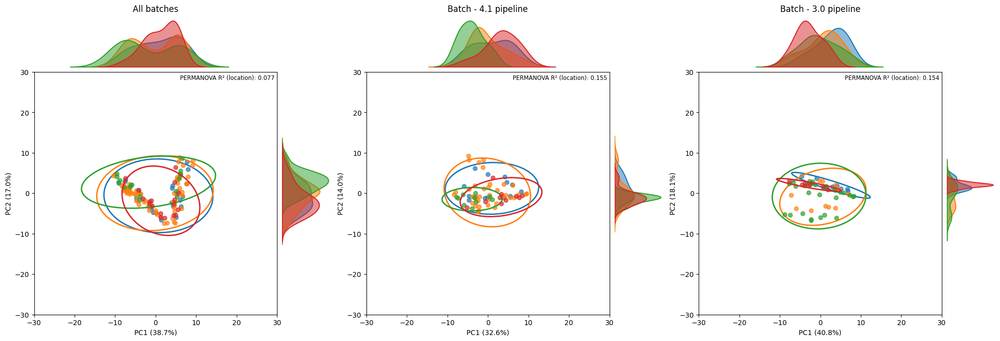

In [7]:
# DTU-GE
dtu_data_clr = DataTransform(dtu_data, factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label], count=True)
dtu_data_study_1 = dtu_data_clr[dtu_data_clr[dtu_batch_label] == 4.1]
dtu_data_study_2 = dtu_data_clr[dtu_data_clr[dtu_batch_label] == 3.0]
dtu_pcoa, dtu_explained = pcoa_aitchison(dtu_data_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_1, dtu_explained_1 = pcoa_aitchison(dtu_data_study_1, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_2, dtu_explained_2 = pcoa_aitchison(dtu_data_study_2, dtu_sample_label, dtu_batch_label, dtu_bio_label)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,20), constrained_layout = True)

# plot_pcoa(ibd_pcoa, ibd_batch_label, ax1, explained=ibd_explained, xlim=[-30, 30], ylim=[-30, 30])
plot_pcoa_2(dtu_pcoa, dtu_bio_label, dtu_data_clr, dtu_sample_label, ax1, explained=dtu_explained, xlim=[-30, 30], ylim=[-30, 30], show_legend=False, title="All batches")
plot_pcoa_2(dtu_pcoa_1, dtu_bio_label, dtu_data_study_1, dtu_sample_label, ax2, explained=dtu_explained_1, xlim=[-30, 30], ylim=[-30, 30], show_legend=False, title="Batch - 4.1 pipeline")
plot_pcoa_2(dtu_pcoa_2, dtu_bio_label, dtu_data_study_2, dtu_sample_label, ax3, explained=dtu_explained_2, xlim=[-30, 30], ylim=[-30, 30], show_legend=False, title ="Batch - 3.0 pipeline")

plt.show()

### All datasets display

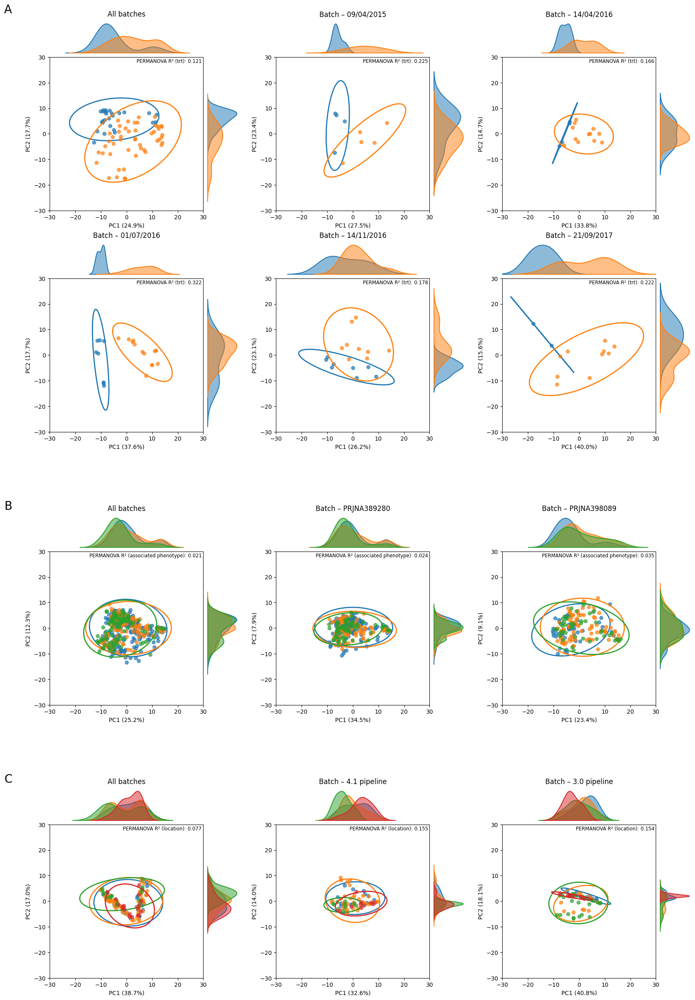

In [8]:
fig = plt.figure(figsize=(20, 30))

gs = GridSpec(
    nrows=6, ncols=3,
    height_ratios=[1, 1, 0.1, 1, 0.1, 1],
    hspace=0.25,   # modest extra space (you can drop this if you want)
    wspace=0.2
)

# 3) Build axes from GridSpec
axes = [[fig.add_subplot(gs[r, c]) for c in range(3)] for r in range(6)]

# 4) Turn off spacer rows (2,4)
for row in (2, 4):
    for ax in axes[row]:
        ax.axis('off')

# 5) Plot exactly as before, but using our new axes
# Row 0 (AD first half)
plot_pcoa_2(ad_pcoa,   ad_count_bio_label, ad_count_data_clr,   ad_count_sample_label,
            axes[0][0], explained=ad_explained,   xlim=[-30,30], ylim=[-30,30],
            show_legend=False, title="All batches")
plot_pcoa_2(ad_pcoa_1, ad_count_bio_label, ad_data_study_1,     ad_count_sample_label,
            axes[0][1], explained=ad_explained_1, xlim=[-30,30], ylim=[-30,30],
            show_legend=False, title="Batch – 09/04/2015")
plot_pcoa_2(ad_pcoa_2, ad_count_bio_label, ad_data_study_2,     ad_count_sample_label,
            axes[0][2], explained=ad_explained_2, xlim=[-30,30], ylim=[-30,30],
            show_legend=False, title="Batch – 14/04/2016")

# Row 1 (AD second half)
plot_pcoa_2(ad_pcoa_3, ad_count_bio_label, ad_data_study_3,     ad_count_sample_label,
            axes[1][0], explained=ad_explained_3, xlim=[-30,30], ylim=[-30,30],
            show_legend=False, title="Batch – 01/07/2016")
plot_pcoa_2(ad_pcoa_4, ad_count_bio_label, ad_data_study_4,     ad_count_sample_label,
            axes[1][1], explained=ad_explained_4, xlim=[-30,30], ylim=[-30,30],
            show_legend=False, title="Batch – 14/11/2016")
plot_pcoa_2(ad_pcoa_5, ad_count_bio_label, ad_data_study_5,     ad_count_sample_label,
            axes[1][2], explained=ad_explained_5, xlim=[-30,30], ylim=[-30,30],
            show_legend=False, title="Batch – 21/09/2017")

# Row 3 (IBD)
plot_pcoa_2(ibd_pcoa,   ibd_bio_label, ibd_data_clr,     ibd_sample_label,
            axes[3][0], explained=ibd_explained,   xlim=[-30,30], ylim=[-30,30],
            show_legend=False, title="All batches")
plot_pcoa_2(ibd_pcoa_1, ibd_bio_label, ibd_data_study_1, ibd_sample_label,
            axes[3][1], explained=ibd_explained_1, xlim=[-30,30], ylim=[-30,30],
            show_legend=False, title="Batch – PRJNA389280")
plot_pcoa_2(ibd_pcoa_2, ibd_bio_label, ibd_data_study_2, ibd_sample_label,
            axes[3][2], explained=ibd_explained_2, xlim=[-30,30], ylim=[-30,30],
            show_legend=False, title="Batch – PRJNA398089")

# Row 5 (DTU‑GE)
plot_pcoa_2(dtu_pcoa,   dtu_bio_label, dtu_data_clr,     dtu_sample_label,
            axes[5][0], explained=dtu_explained,   xlim=[-30,30], ylim=[-30,30],
            show_legend=False, title="All batches")
plot_pcoa_2(dtu_pcoa_1, dtu_bio_label, dtu_data_study_1, dtu_sample_label,
            axes[5][1], explained=dtu_explained_1, xlim=[-30,30], ylim=[-30,30],
            show_legend=False, title="Batch – 4.1 pipeline")
plot_pcoa_2(dtu_pcoa_2, dtu_bio_label, dtu_data_study_2, dtu_sample_label,
            axes[5][2], explained=dtu_explained_2, xlim=[-30,30], ylim=[-30,30],
            show_legend=False, title="Batch – 3.0 pipeline")

fig.text(0.07, 0.89, 'A', fontsize=20, va='center')
fig.text(0.07, 0.49, 'B', fontsize=20, va='center')
fig.text(0.07, 0.27, 'C', fontsize=20, va='center')

plt.show()

### Corrected dataset loading (ABaCo)

In [9]:
iter = 0
# VMM prior - KL cycle
prior = "vmm"
cycle = "kl"

path = f"performance_metrics/multi_runs/AD_count/{prior}_{cycle}_recon_{iter}"
ad_recon_vmm_kl = DataPreprocess(
    path,
    factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label]
)
ad_recon_vmm_kl_clr = DataTransform(data = ad_recon_vmm_kl, factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label], count = True)

path = f"performance_metrics/multi_runs/IBD/{prior}_{cycle}_recon_new_{iter}"
ibd_recon_vmm_kl = DataPreprocess(
    path,
    factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label]
)
ibd_recon_vmm_kl_clr = DataTransform(data = ibd_recon_vmm_kl, factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label], count = True)

path = f"performance_metrics/multi_runs/DTU-GE/{prior}_{cycle}_recon_kl_annealing_{iter}"
dtu_recon_vmm_kl = DataPreprocess(
    path,
    factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label]
)
dtu_recon_vmm_kl_clr = DataTransform(data = dtu_recon_vmm_kl, factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label], count = True)

# MoG prior - KL cycle
prior = "mog"
cycle = "kl"

path = f"performance_metrics/multi_runs/AD_count/{prior}_{cycle}_recon_{iter}"
ad_recon_mog_kl = DataPreprocess(
    path,
    factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label]
)
ad_recon_mog_kl_clr = DataTransform(data = ad_recon_mog_kl, factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label], count = True)

path = f"performance_metrics/multi_runs/IBD/{prior}_{cycle}_recon_contra_1000_2_{iter}"
ibd_recon_mog_kl = DataPreprocess(
    path,
    factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label]
)
ibd_recon_mog_kl_clr = DataTransform(data = ibd_recon_mog_kl, factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label], count = True)

path = f"performance_metrics/multi_runs/DTU-GE/{prior}_{cycle}_recon_contra_1000_{iter}"
dtu_recon_mog_kl = DataPreprocess(
    path,
    factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label]
)
dtu_recon_mog_kl_clr = DataTransform(data = dtu_recon_mog_kl, factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label], count = True)

# Std prior - KL cycle
prior = "std"
cycle = "kl"

path = f"performance_metrics/multi_runs/AD_count/{prior}_{cycle}_recon_{iter}"
ad_recon_std_kl = DataPreprocess(
    path,
    factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label]
)
ad_recon_std_kl_clr = DataTransform(data = ad_recon_std_kl, factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label], count = True)

path = f"performance_metrics/multi_runs/IBD/{prior}_{cycle}_recon_contra_1000_2_{iter}"
ibd_recon_std_kl = DataPreprocess(
    path,
    factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label]
)
ibd_recon_std_kl_clr = DataTransform(data = ibd_recon_std_kl, factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label], count = True)

path = f"performance_metrics/multi_runs/DTU-GE/{prior}_{cycle}_recon_contra_1000_{iter}"
dtu_recon_std_kl = DataPreprocess(
    path,
    factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label]
)
dtu_recon_std_kl_clr = DataTransform(data = dtu_recon_std_kl, factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label], count = True)


# VMM prior - No cycle
prior = "vmm"
cycle = "no"

path = f"performance_metrics/multi_runs/AD_count/{prior}_{cycle}_recon_{iter}"
ad_recon_vmm_no = DataPreprocess(
    path,
    factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label]
)
ad_recon_vmm_no_clr = DataTransform(data = ad_recon_vmm_no, factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label], count = True)

path = f"performance_metrics/multi_runs/IBD/{prior}_{cycle}_recon_new_{iter}"
ibd_recon_vmm_no = DataPreprocess(
    path,
    factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label]
)
ibd_recon_vmm_no_clr = DataTransform(data = ibd_recon_vmm_no, factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label], count = True)

path = f"performance_metrics/multi_runs/DTU-GE/{prior}_{cycle}_recon_kl_annealing_{iter}"
dtu_recon_vmm_no = DataPreprocess(
    path,
    factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label]
)
dtu_recon_vmm_no_clr = DataTransform(data = dtu_recon_vmm_no, factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label], count = True)

# MoG prior - No cycle
prior = "mog"
cycle = "no"

path = f"performance_metrics/multi_runs/AD_count/{prior}_{cycle}_recon_{iter}"
ad_recon_mog_no = DataPreprocess(
    path,
    factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label]
)
ad_recon_mog_no_clr = DataTransform(data = ad_recon_mog_no, factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label], count = True)

path = f"performance_metrics/multi_runs/IBD/{prior}_{cycle}_recon_contra_1000_2_{iter}"
ibd_recon_mog_no = DataPreprocess(
    path,
    factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label]
)
ibd_recon_mog_no_clr = DataTransform(data = ibd_recon_mog_no, factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label], count = True)

path = f"performance_metrics/multi_runs/DTU-GE/{prior}_{cycle}_recon_contra_1000_{iter}"
dtu_recon_mog_no = DataPreprocess(
    path,
    factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label]
)
dtu_recon_mog_no_clr = DataTransform(data = dtu_recon_mog_no, factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label], count = True)

# Std prior - No cycle
prior = "std"
cycle = "no"

path = f"performance_metrics/multi_runs/AD_count/{prior}_{cycle}_recon_{iter}"
ad_recon_std_no = DataPreprocess(
    path,
    factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label]
)
ad_recon_std_no_clr = DataTransform(data = ad_recon_std_no, factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label], count = True)

path = f"performance_metrics/multi_runs/IBD/{prior}_{cycle}_recon_contra_1000_2_{iter}"
ibd_recon_std_no = DataPreprocess(
    path,
    factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label]
)
ibd_recon_std_no_clr = DataTransform(data = ibd_recon_std_no, factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label], count = True)

path = f"performance_metrics/multi_runs/DTU-GE/{prior}_{cycle}_recon_contra_1000_{iter}"
dtu_recon_std_no = DataPreprocess(
    path,
    factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label]
)
dtu_recon_std_no_clr = DataTransform(data = dtu_recon_std_no, factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label], count = True)

### Correction using other methods

In [10]:
ad_count_data_clr = DataTransform(data = ad_count_data, factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label], transformation="CLR", count=True)
ibd_data_clr = DataTransform(data = ibd_data, factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label], transformation="CLR", count=True)
dtu_data_clr = DataTransform(data = dtu_data, factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label], transformation="CLR", count=True)

In [11]:
# Data CLR transformation to handle reconstruction methods
ad_count_data_clr = DataTransform(data = ad_count_data, factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label], transformation="CLR", count=True)
ibd_data_clr = DataTransform(data = ibd_data, factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label], transformation="CLR", count=True)
dtu_data_clr = DataTransform(data = dtu_data, factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label], transformation="CLR", count=True)

# BMC correction
ad_recon_bmc = correctBMC(data = ad_count_data_clr, sample_label=ad_count_sample_label, batch_label=ad_count_batch_label, exp_label=ad_count_bio_label)
ibd_recon_bmc = correctBMC(data = ibd_data_clr, sample_label=ibd_sample_label, batch_label=ibd_batch_label, exp_label=ibd_bio_label)
dtu_recon_bmc = correctBMC(data = dtu_data_clr, sample_label=dtu_sample_label, batch_label=dtu_batch_label, exp_label=dtu_bio_label)
print("BMC ready")

# ComBat correction
ad_recon_combat = correctCombat(data = ad_count_data_clr, sample_label=ad_count_sample_label, batch_label=ad_count_batch_label, experiment_label=ad_count_bio_label)
ibd_recon_combat = correctCombat(data = ibd_data_clr, sample_label=ibd_sample_label, batch_label=ibd_batch_label, experiment_label=ibd_bio_label)
dtu_recon_combat = correctCombat(data = dtu_data_clr, sample_label=dtu_sample_label, batch_label=dtu_batch_label, experiment_label=dtu_bio_label)
print("ComBat ready")

# limma correction
ad_recon_limma = correctLimma_rBE(data = ad_count_data_clr, sample_label=ad_count_sample_label, batch_label=ad_count_batch_label, covariates_labels=ad_count_bio_label)
ibd_recon_limma = correctLimma_rBE(data = ibd_data_clr, sample_label=ibd_sample_label, batch_label=ibd_batch_label, covariates_labels=ibd_bio_label)
dtu_recon_limma = correctLimma_rBE(data = dtu_data_clr, sample_label=dtu_sample_label, batch_label=dtu_batch_label, covariates_labels=dtu_bio_label)
print("limma ready")

# PLSDA-batch correction
ad_recon_plsda = correctPLSDAbatch_R(df = ad_count_data_clr, sample_label=ad_count_sample_label, batch_label=ad_count_batch_label, exp_label=ad_count_bio_label, ncomp_bat=5, ncomp_trt=2)
ibd_recon_plsda = correctPLSDAbatch_R(df = ibd_data_clr, sample_label=ibd_sample_label, batch_label=ibd_batch_label, exp_label=ibd_bio_label, ncomp_bat=2, ncomp_trt=3)
dtu_recon_plsda = correctPLSDAbatch_R(df = dtu_data_clr, sample_label=dtu_sample_label, batch_label=dtu_batch_label, exp_label=dtu_bio_label, ncomp_bat=2, ncomp_trt=3)
print("PLSDA-batch ready")

# ComBat-seq correction
ad_recon_combatseq = correctCombatSeq(data = ad_count_data, sample_label=ad_count_sample_label, batch_label=ad_count_batch_label, condition_label=ad_count_bio_label)
ad_recon_combatseq_clr = DataTransform(data = ad_recon_combatseq, factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label], transformation="CLR", count=True)
ibd_recon_combatseq = correctCombatSeq(data = ibd_data, sample_label=ibd_sample_label, batch_label=ibd_batch_label, condition_label=ibd_bio_label)
ibd_recon_combatseq_clr = DataTransform(data = ibd_recon_combatseq, factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label], transformation="CLR", count=True)
dtu_recon_combatseq = correctCombatSeq(data = dtu_data, sample_label=dtu_sample_label, batch_label=dtu_batch_label, condition_label=dtu_bio_label)
dtu_recon_combatseq_clr = DataTransform(data = dtu_recon_combatseq, factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label], transformation="CLR", count=True)
print("ComBat-seq ready")

# ConQuR correction
ad_recon_conqur = correctConQuR(df = ad_count_data, batch_cols=[ad_count_batch_label], covariate_cols=[ad_count_bio_label])
ad_recon_conqur_clr = DataTransform(data = ad_recon_conqur, factors=[ad_count_sample_label, ad_count_batch_label, ad_count_bio_label], transformation="CLR", count=True)
ibd_recon_conqur = correctConQuR(df = ibd_data, batch_cols=[ibd_batch_label], covariate_cols=[ibd_bio_label])
ibd_recon_conqur_clr = DataTransform(data = ibd_recon_conqur, factors=[ibd_sample_label, ibd_batch_label, ibd_bio_label], transformation="CLR", count=True)
dtu_recon_conqur = correctConQuR(df = dtu_data.drop(columns="sample_id"), batch_cols=[dtu_batch_label], covariate_cols=[dtu_bio_label])
dtu_recon_conqur_clr = DataTransform(data = dtu_recon_conqur, factors=[dtu_sample_label, dtu_batch_label, dtu_bio_label], transformation="CLR", count=True)
print("ConQuR ready")

BMC ready
Found 5 batches.
Adjusting for 1 covariate(s) or covariate level(s).
Standardizing Data across genes.
Fitting L/S model and finding priors.
Finding parametric adjustments.
Adjusting the Data
Found 2 batches.
Adjusting for 2 covariate(s) or covariate level(s).
Standardizing Data across genes.
Fitting L/S model and finding priors.
Finding parametric adjustments.
Adjusting the Data
Found 2 batches.
Adjusting for 3 covariate(s) or covariate level(s).
Standardizing Data across genes.
Fitting L/S model and finding priors.
Finding parametric adjustments.
Adjusting the Data
ComBat ready
limma ready
PLSDA-batch ready
ComBat-seq ready
ConQuR ready


### Plotting PCoA after correction

#### AD Count data

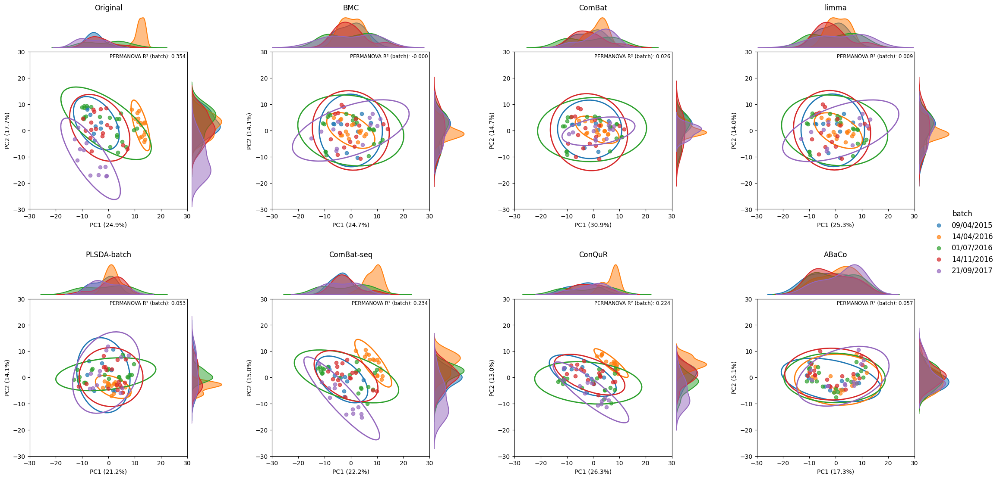

In [12]:
# Original data state
ad_pcoa, ad_explained = pcoa_aitchison(ad_count_data_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
# Other methods
ad_pcoa_bmc, ad_exp_bmc = pcoa_aitchison(ad_recon_bmc, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_combat, ad_exp_combat = pcoa_aitchison(ad_recon_combat, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_limma, ad_exp_limma = pcoa_aitchison(ad_recon_limma, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_plsda, ad_exp_plsda = pcoa_aitchison(ad_recon_plsda, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_combatseq, ad_exp_combatseq = pcoa_aitchison(ad_recon_combatseq_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_conqur, ad_exp_conqur = pcoa_aitchison(ad_recon_conqur_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
# ABaCo
ad_pcoa_abaco, ad_exp_abaco = pcoa_aitchison(ad_recon_vmm_kl_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)

fig, axes = plt.subplots(2, 4, figsize=(22,11), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(ad_pcoa, ad_count_batch_label, ad_count_data_clr, ad_count_sample_label, axes[0][0], explained=ad_explained, xlim=[-30, 30], ylim=[-30, 30], title="Original", show_legend=False)
plot_pcoa_2(ad_pcoa_bmc, ad_count_batch_label, ad_recon_bmc, ad_count_sample_label, axes[0][1], explained=ad_exp_bmc, xlim=[-30, 30], ylim=[-30, 30], title= "BMC", show_legend=False)
plot_pcoa_2(ad_pcoa_combat, ad_count_batch_label, ad_recon_combat, ad_count_sample_label, axes[0][2], explained=ad_exp_combat, xlim=[-30, 30], ylim=[-30, 30], title="ComBat", show_legend=False)
plot_pcoa_2(ad_pcoa_limma, ad_count_batch_label, ad_recon_limma, ad_count_sample_label, axes[0][3], explained=ad_exp_limma, xlim=[-30, 30], ylim=[-30, 30], title="limma", show_legend=False)
plot_pcoa_2(ad_pcoa_plsda, ad_count_batch_label, ad_recon_plsda, ad_count_sample_label, axes[1][0], explained=ad_exp_plsda, xlim=[-30, 30], ylim=[-30, 30], title="PLSDA-batch", show_legend=False)
plot_pcoa_2(ad_pcoa_combatseq, ad_count_batch_label, ad_recon_combatseq_clr, ad_count_sample_label, axes[1][1], explained=ad_exp_combatseq, xlim=[-30, 30], ylim=[-30, 30], title="ComBat-seq", show_legend=False)
plot_pcoa_2(ad_pcoa_conqur, ad_count_batch_label, ad_recon_conqur_clr, ad_count_sample_label, axes[1][2], explained=ad_exp_conqur, xlim=[-30, 30], ylim=[-30, 30], title="ConQuR", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco, ad_count_batch_label, ad_recon_vmm_kl_clr, ad_count_sample_label, axes[1][3], explained=ad_exp_abaco, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo", show_legend=False)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=ad_count_batch_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.05, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

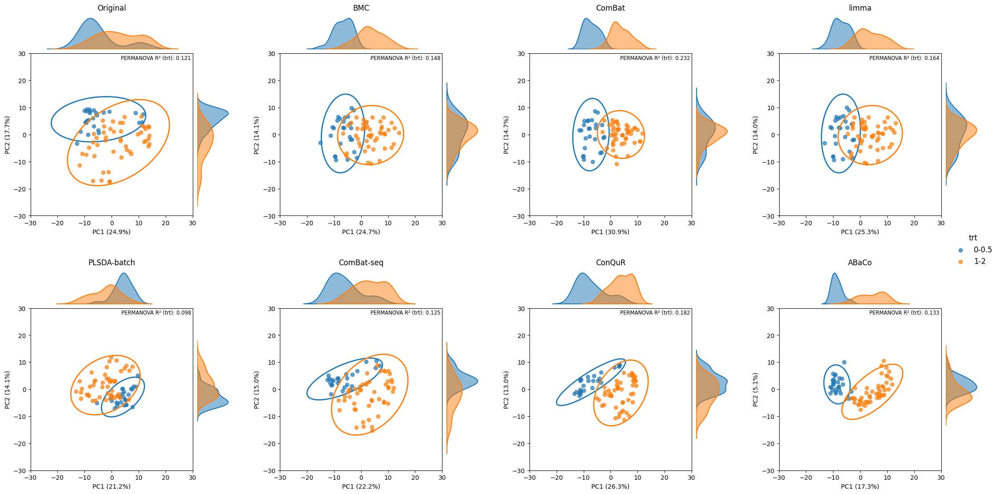

In [13]:
# Original data state
ad_pcoa, ad_explained = pcoa_aitchison(ad_count_data_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
# Other methods
ad_pcoa_bmc, ad_exp_bmc = pcoa_aitchison(ad_recon_bmc, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_combat, ad_exp_combat = pcoa_aitchison(ad_recon_combat, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_limma, ad_exp_limma = pcoa_aitchison(ad_recon_limma, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_plsda, ad_exp_plsda = pcoa_aitchison(ad_recon_plsda, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_combatseq, ad_exp_combatseq = pcoa_aitchison(ad_recon_combatseq_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_conqur, ad_exp_conqur = pcoa_aitchison(ad_recon_conqur_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
# ABaCo
ad_pcoa_abaco, ad_exp_abaco = pcoa_aitchison(ad_recon_vmm_kl_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)

fig, axes = plt.subplots(2, 4, figsize=(22,11), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(ad_pcoa, ad_count_bio_label, ad_count_data_clr, ad_count_sample_label, axes[0][0], explained=ad_explained, xlim=[-30, 30], ylim=[-30, 30], title="Original", show_legend=False)
plot_pcoa_2(ad_pcoa_bmc, ad_count_bio_label, ad_recon_bmc, ad_count_sample_label, axes[0][1], explained=ad_exp_bmc, xlim=[-30, 30], ylim=[-30, 30], title="BMC", show_legend=False)
plot_pcoa_2(ad_pcoa_combat, ad_count_bio_label, ad_recon_combat, ad_count_sample_label, axes[0][2], explained=ad_exp_combat, xlim=[-30, 30], ylim=[-30, 30], title="ComBat", show_legend=False)
plot_pcoa_2(ad_pcoa_limma, ad_count_bio_label, ad_recon_limma, ad_count_sample_label, axes[0][3], explained=ad_exp_limma, xlim=[-30, 30], ylim=[-30, 30], title="limma", show_legend=False)
plot_pcoa_2(ad_pcoa_plsda, ad_count_bio_label, ad_recon_plsda, ad_count_sample_label, axes[1][0], explained=ad_exp_plsda, xlim=[-30, 30], ylim=[-30, 30], title="PLSDA-batch", show_legend=False)
plot_pcoa_2(ad_pcoa_combatseq, ad_count_bio_label, ad_recon_combatseq_clr, ad_count_sample_label, axes[1][1], explained=ad_exp_combatseq, xlim=[-30, 30], ylim=[-30, 30], title="ComBat-seq", show_legend=False)
plot_pcoa_2(ad_pcoa_conqur, ad_count_bio_label, ad_recon_conqur_clr, ad_count_sample_label, axes[1][2], explained=ad_exp_conqur, xlim=[-30, 30], ylim=[-30, 30], title="ConQuR", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco, ad_count_bio_label, ad_recon_vmm_kl_clr, ad_count_sample_label, axes[1][3], explained=ad_exp_abaco, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo", show_legend=False)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=ad_count_bio_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.02, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

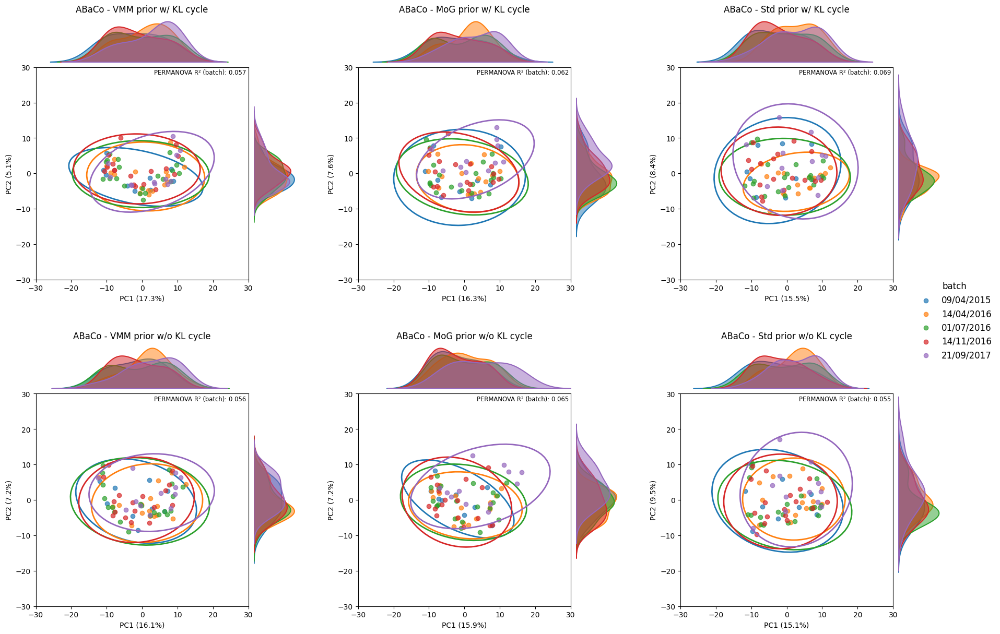

In [14]:
# ABaCo - Other priors
ad_pcoa_abaco_vmm_kl, ad_exp_abaco_vmm_kl = pcoa_aitchison(ad_recon_vmm_kl_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_abaco_mog_kl, ad_exp_abaco_mog_kl = pcoa_aitchison(ad_recon_mog_kl_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_abaco_std_kl, ad_exp_abaco_std_kl = pcoa_aitchison(ad_recon_std_kl_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_abaco_vmm_no, ad_exp_abaco_vmm_no = pcoa_aitchison(ad_recon_vmm_no_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_abaco_mog_no, ad_exp_abaco_mog_no = pcoa_aitchison(ad_recon_mog_no_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_abaco_std_no, ad_exp_abaco_std_no = pcoa_aitchison(ad_recon_std_no_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)

fig, axes = plt.subplots(2, 3, figsize=(18,12), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(ad_pcoa_abaco_vmm_kl, ad_count_batch_label, ad_recon_vmm_kl_clr, ad_count_sample_label, axes[0][0], explained=ad_exp_abaco_vmm_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - VMM prior w/ KL cycle", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco_mog_kl, ad_count_batch_label, ad_recon_mog_kl_clr, ad_count_sample_label, axes[0][1], explained=ad_exp_abaco_mog_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - MoG prior w/ KL cycle", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco_std_kl, ad_count_batch_label, ad_recon_std_kl_clr, ad_count_sample_label, axes[0][2], explained=ad_exp_abaco_std_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - Std prior w/ KL cycle", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco_vmm_no, ad_count_batch_label, ad_recon_vmm_no_clr, ad_count_sample_label, axes[1][0], explained=ad_exp_abaco_vmm_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - VMM prior w/o KL cycle", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco_mog_no, ad_count_batch_label, ad_recon_mog_no_clr, ad_count_sample_label, axes[1][1], explained=ad_exp_abaco_mog_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - MoG prior w/o KL cycle", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco_std_no, ad_count_batch_label, ad_recon_std_no_clr, ad_count_sample_label, axes[1][2], explained=ad_exp_abaco_std_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - Std prior w/o KL cycle", show_legend=False)


handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=ad_count_batch_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.06, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

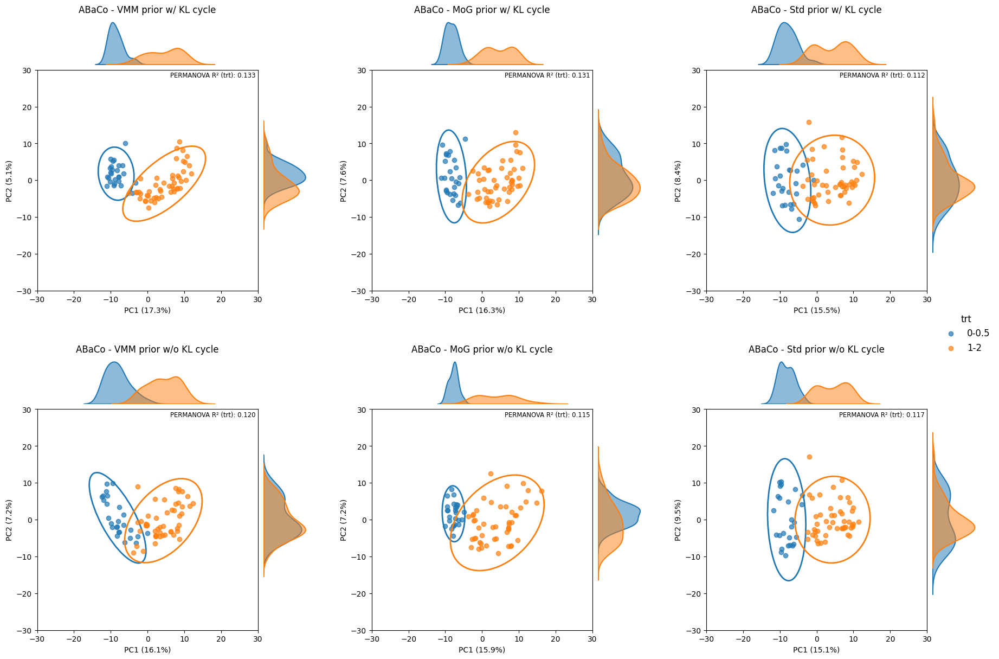

In [15]:
# ABaCo - Other priors
ad_pcoa_abaco_vmm_kl, ad_exp_abaco_vmm_kl = pcoa_aitchison(ad_recon_vmm_kl_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_abaco_mog_kl, ad_exp_abaco_mog_kl = pcoa_aitchison(ad_recon_mog_kl_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_abaco_std_kl, ad_exp_abaco_std_kl = pcoa_aitchison(ad_recon_std_kl_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_abaco_vmm_no, ad_exp_abaco_vmm_no = pcoa_aitchison(ad_recon_vmm_no_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_abaco_mog_no, ad_exp_abaco_mog_no = pcoa_aitchison(ad_recon_mog_no_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_abaco_std_no, ad_exp_abaco_std_no = pcoa_aitchison(ad_recon_std_no_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)

fig, axes = plt.subplots(2, 3, figsize=(18,12), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(ad_pcoa_abaco_vmm_kl, ad_count_bio_label, ad_recon_vmm_kl_clr, ad_count_sample_label, axes[0][0], explained=ad_exp_abaco_vmm_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - VMM prior w/ KL cycle", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco_mog_kl, ad_count_bio_label, ad_recon_mog_kl_clr, ad_count_sample_label, axes[0][1], explained=ad_exp_abaco_mog_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - MoG prior w/ KL cycle", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco_std_kl, ad_count_bio_label, ad_recon_std_kl_clr, ad_count_sample_label, axes[0][2], explained=ad_exp_abaco_std_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - Std prior w/ KL cycle", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco_vmm_no, ad_count_bio_label, ad_recon_vmm_no_clr, ad_count_sample_label, axes[1][0], explained=ad_exp_abaco_vmm_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - VMM prior w/o KL cycle", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco_mog_no, ad_count_bio_label, ad_recon_mog_no_clr, ad_count_sample_label, axes[1][1], explained=ad_exp_abaco_mog_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - MoG prior w/o KL cycle", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco_std_no, ad_count_bio_label, ad_recon_std_no_clr, ad_count_sample_label, axes[1][2], explained=ad_exp_abaco_std_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - Std prior w/o KL cycle", show_legend=False)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=ad_count_bio_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.02, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

#### IBD data

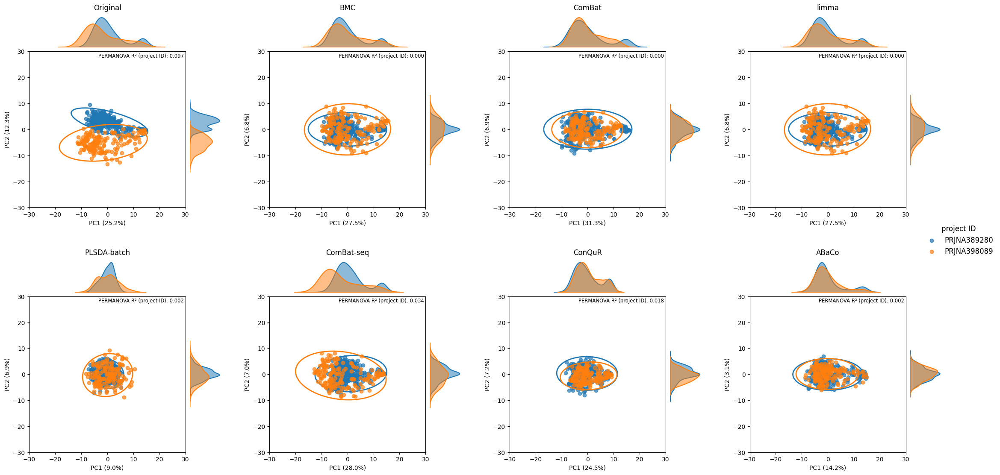

In [16]:
# Original data state
ibd_pcoa, ibd_explained = pcoa_aitchison(ibd_data_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
# Other methods
ibd_pcoa_bmc, ibd_exp_bmc = pcoa_aitchison(ibd_recon_bmc, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_combat, ibd_exp_combat = pcoa_aitchison(ibd_recon_combat, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_limma, ibd_exp_limma = pcoa_aitchison(ibd_recon_limma, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_plsda, ibd_exp_plsda = pcoa_aitchison(ibd_recon_plsda, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_combatseq, ibd_exp_combatseq = pcoa_aitchison(ibd_recon_combatseq_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_conqur, ibd_exp_conqur = pcoa_aitchison(ibd_recon_conqur_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
# ABaCo
ibd_pcoa_abaco, ibd_exp_abaco = pcoa_aitchison(ibd_recon_vmm_kl_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)

fig, axes = plt.subplots(2, 4, figsize=(22,11), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(ibd_pcoa, ibd_batch_label, ibd_data_clr, ibd_sample_label, axes[0][0], explained=ibd_explained, xlim=[-30, 30], ylim=[-30, 30], title="Original", show_legend=False)
plot_pcoa_2(ibd_pcoa_bmc, ibd_batch_label, ibd_recon_bmc, ibd_sample_label, axes[0][1], explained=ibd_exp_bmc, xlim=[-30, 30], ylim=[-30, 30], title="BMC", show_legend=False)
plot_pcoa_2(ibd_pcoa_combat, ibd_batch_label, ibd_recon_combat, ibd_sample_label, axes[0][2], explained=ibd_exp_combat, xlim=[-30, 30], ylim=[-30, 30], title="ComBat", show_legend=False)
plot_pcoa_2(ibd_pcoa_limma, ibd_batch_label, ibd_recon_limma, ibd_sample_label, axes[0][3], explained=ibd_exp_limma, xlim=[-30, 30], ylim=[-30, 30], title="limma", show_legend=False)
plot_pcoa_2(ibd_pcoa_plsda, ibd_batch_label, ibd_recon_plsda, ibd_sample_label, axes[1][0], explained=ibd_exp_plsda, xlim=[-30, 30], ylim=[-30, 30], title="PLSDA-batch", show_legend=False)
plot_pcoa_2(ibd_pcoa_combatseq, ibd_batch_label, ibd_recon_combatseq_clr, ibd_sample_label, axes[1][1], explained=ibd_exp_combatseq, xlim=[-30, 30], ylim=[-30, 30], title="ComBat-seq", show_legend=False)
plot_pcoa_2(ibd_pcoa_conqur, ibd_batch_label, ibd_recon_conqur_clr, ibd_sample_label, axes[1][2], explained=ibd_exp_conqur, xlim=[-30, 30], ylim=[-30, 30], title="ConQuR", show_legend=False)
plot_pcoa_2(ibd_pcoa_abaco, ibd_batch_label, ibd_recon_vmm_kl_clr, ibd_sample_label, axes[1][3], explained=ibd_exp_abaco, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo", show_legend=False)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=ibd_batch_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.06, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

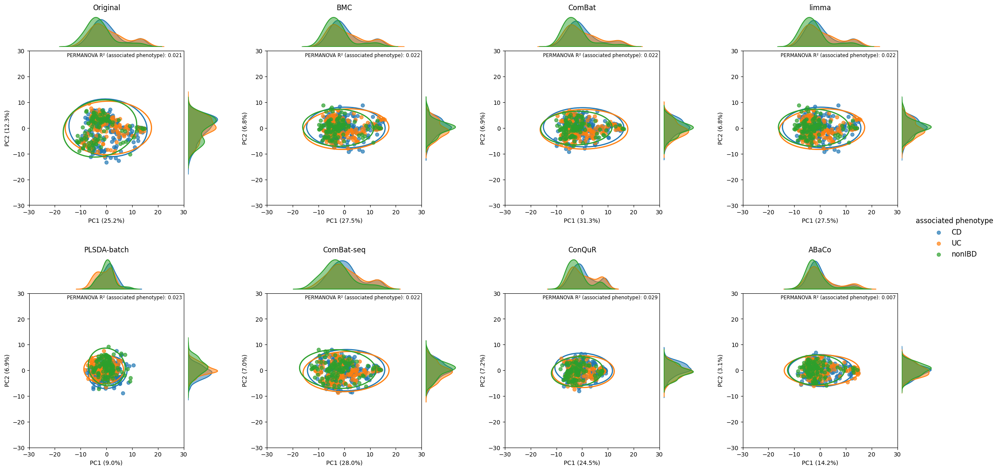

In [17]:
# Original data state
ibd_pcoa, ibd_explained = pcoa_aitchison(ibd_data_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
# Other methods
ibd_pcoa_bmc, ibd_exp_bmc = pcoa_aitchison(ibd_recon_bmc, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_combat, ibd_exp_combat = pcoa_aitchison(ibd_recon_combat, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_limma, ibd_exp_limma = pcoa_aitchison(ibd_recon_limma, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_plsda, ibd_exp_plsda = pcoa_aitchison(ibd_recon_plsda, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_combatseq, ibd_exp_combatseq = pcoa_aitchison(ibd_recon_combatseq_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_conqur, ibd_exp_conqur = pcoa_aitchison(ibd_recon_conqur_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
# ABaCo
ibd_pcoa_abaco, ibd_exp_abaco = pcoa_aitchison(ibd_recon_vmm_kl_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)

fig, axes = plt.subplots(2, 4, figsize=(22,11), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(ibd_pcoa, ibd_bio_label, ibd_data_clr, ibd_sample_label, axes[0][0], explained=ibd_explained, xlim=[-30, 30], ylim=[-30, 30], title="Original", show_legend=False)
plot_pcoa_2(ibd_pcoa_bmc, ibd_bio_label, ibd_recon_bmc, ibd_sample_label, axes[0][1], explained=ibd_exp_bmc, xlim=[-30, 30], ylim=[-30, 30], title="BMC", show_legend=False)
plot_pcoa_2(ibd_pcoa_combat, ibd_bio_label, ibd_recon_combat, ibd_sample_label, axes[0][2], explained=ibd_exp_combat, xlim=[-30, 30], ylim=[-30, 30], title="ComBat", show_legend=False)
plot_pcoa_2(ibd_pcoa_limma, ibd_bio_label, ibd_recon_limma, ibd_sample_label, axes[0][3], explained=ibd_exp_limma, xlim=[-30, 30], ylim=[-30, 30], title="limma", show_legend=False)
plot_pcoa_2(ibd_pcoa_plsda, ibd_bio_label, ibd_recon_plsda, ibd_sample_label, axes[1][0], explained=ibd_exp_plsda, xlim=[-30, 30], ylim=[-30, 30], title="PLSDA-batch", show_legend=False)
plot_pcoa_2(ibd_pcoa_combatseq, ibd_bio_label, ibd_recon_combatseq_clr, ibd_sample_label, axes[1][1], explained=ibd_exp_combatseq, xlim=[-30, 30], ylim=[-30, 30], title="ComBat-seq", show_legend=False)
plot_pcoa_2(ibd_pcoa_conqur, ibd_bio_label, ibd_recon_conqur_clr, ibd_sample_label, axes[1][2], explained=ibd_exp_conqur, xlim=[-30, 30], ylim=[-30, 30], title="ConQuR", show_legend=False)
plot_pcoa_2(ibd_pcoa_abaco, ibd_bio_label, ibd_recon_vmm_kl_clr, ibd_sample_label, axes[1][3], explained=ibd_exp_abaco, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo", show_legend=False)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=ibd_bio_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.07, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

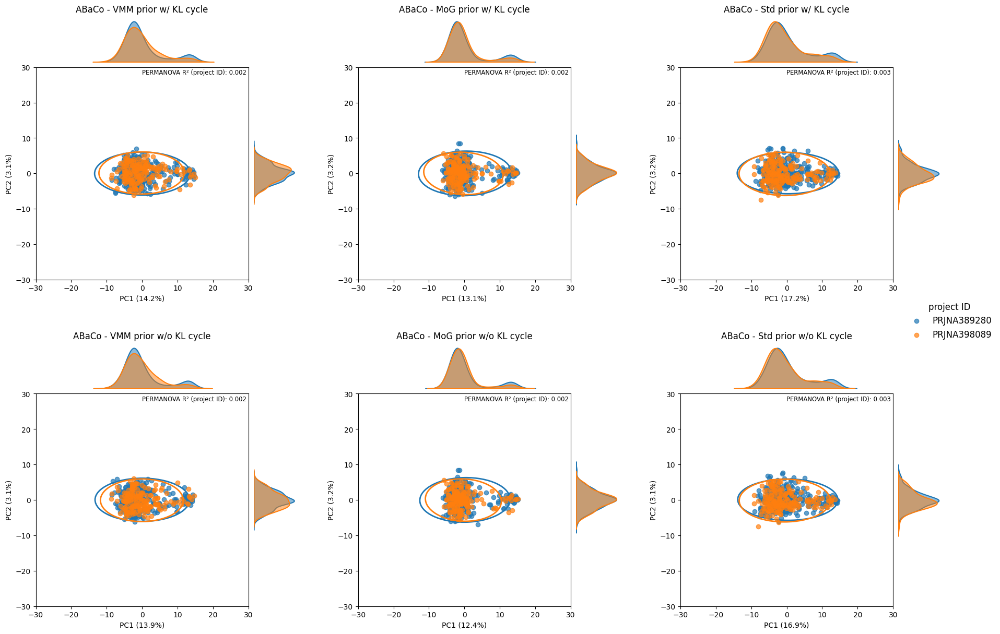

In [18]:
# ABaCo - Other priors
ibd_pcoa_abaco_vmm_kl, ibd_exp_abaco_vmm_kl = pcoa_aitchison(ibd_recon_vmm_kl_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_abaco_mog_kl, ibd_exp_abaco_mog_kl = pcoa_aitchison(ibd_recon_mog_kl_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_abaco_std_kl, ibd_exp_abaco_std_kl = pcoa_aitchison(ibd_recon_std_kl_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_abaco_vmm_no, ibd_exp_abaco_vmm_no = pcoa_aitchison(ibd_recon_vmm_no_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_abaco_mog_no, ibd_exp_abaco_mog_no = pcoa_aitchison(ibd_recon_mog_no_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_abaco_std_no, ibd_exp_abaco_std_no = pcoa_aitchison(ibd_recon_std_no_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)

fig, axes = plt.subplots(2, 3, figsize=(18,12), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(ibd_pcoa_abaco_vmm_kl, ibd_batch_label, ibd_recon_vmm_kl_clr, ibd_sample_label, axes[0][0], explained=ibd_exp_abaco_vmm_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - VMM prior w/ KL cycle", show_legend=False)
plot_pcoa_2(ibd_pcoa_abaco_mog_kl, ibd_batch_label, ibd_recon_mog_kl_clr, ibd_sample_label, axes[0][1], explained=ibd_exp_abaco_mog_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - MoG prior w/ KL cycle", show_legend=False)
plot_pcoa_2(ibd_pcoa_abaco_std_kl, ibd_batch_label, ibd_recon_std_kl_clr, ibd_sample_label, axes[0][2], explained=ibd_exp_abaco_std_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - Std prior w/ KL cycle", show_legend=False)
plot_pcoa_2(ibd_pcoa_abaco_vmm_no, ibd_batch_label, ibd_recon_vmm_no_clr, ibd_sample_label, axes[1][0], explained=ibd_exp_abaco_vmm_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - VMM prior w/o KL cycle", show_legend=False)
plot_pcoa_2(ibd_pcoa_abaco_mog_no, ibd_batch_label, ibd_recon_mog_no_clr, ibd_sample_label, axes[1][1], explained=ibd_exp_abaco_mog_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - MoG prior w/o KL cycle", show_legend=False)
plot_pcoa_2(ibd_pcoa_abaco_std_no, ibd_batch_label, ibd_recon_std_no_clr, ibd_sample_label, axes[1][2], explained=ibd_exp_abaco_std_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - Std prior w/o KL cycle", show_legend=False)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=ibd_batch_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.06, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

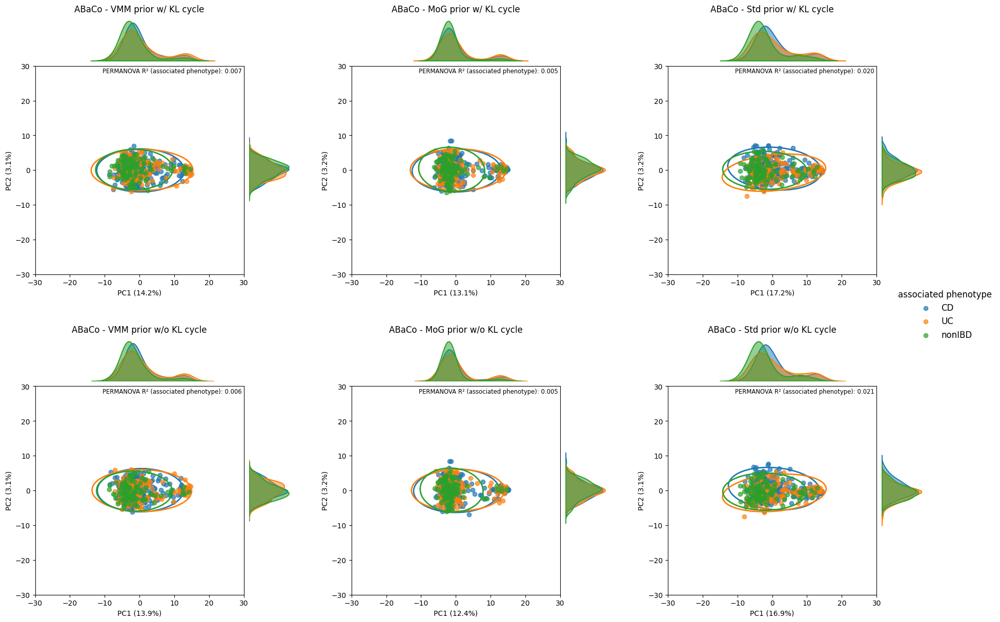

In [19]:
# ABaCo - Other priors
ibd_pcoa_abaco_vmm_kl, ibd_exp_abaco_vmm_kl = pcoa_aitchison(ibd_recon_vmm_kl_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_abaco_mog_kl, ibd_exp_abaco_mog_kl = pcoa_aitchison(ibd_recon_mog_kl_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_abaco_std_kl, ibd_exp_abaco_std_kl = pcoa_aitchison(ibd_recon_std_kl_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_abaco_vmm_no, ibd_exp_abaco_vmm_no = pcoa_aitchison(ibd_recon_vmm_no_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_abaco_mog_no, ibd_exp_abaco_mog_no = pcoa_aitchison(ibd_recon_mog_no_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)
ibd_pcoa_abaco_std_no, ibd_exp_abaco_std_no = pcoa_aitchison(ibd_recon_std_no_clr, ibd_sample_label, ibd_batch_label, ibd_bio_label)

fig, axes = plt.subplots(2, 3, figsize=(18,12), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(ibd_pcoa_abaco_vmm_kl, ibd_bio_label, ibd_recon_vmm_kl_clr, ibd_sample_label, axes[0][0], explained=ibd_exp_abaco_vmm_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - VMM prior w/ KL cycle", show_legend=False)
plot_pcoa_2(ibd_pcoa_abaco_mog_kl, ibd_bio_label, ibd_recon_mog_kl_clr, ibd_sample_label, axes[0][1], explained=ibd_exp_abaco_mog_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - MoG prior w/ KL cycle", show_legend=False)
plot_pcoa_2(ibd_pcoa_abaco_std_kl, ibd_bio_label, ibd_recon_std_kl_clr, ibd_sample_label, axes[0][2], explained=ibd_exp_abaco_std_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - Std prior w/ KL cycle", show_legend=False)
plot_pcoa_2(ibd_pcoa_abaco_vmm_no, ibd_bio_label, ibd_recon_vmm_no_clr, ibd_sample_label, axes[1][0], explained=ibd_exp_abaco_vmm_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - VMM prior w/o KL cycle", show_legend=False)
plot_pcoa_2(ibd_pcoa_abaco_mog_no, ibd_bio_label, ibd_recon_mog_no_clr, ibd_sample_label, axes[1][1], explained=ibd_exp_abaco_mog_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - MoG prior w/o KL cycle", show_legend=False)
plot_pcoa_2(ibd_pcoa_abaco_std_no, ibd_bio_label, ibd_recon_std_no_clr, ibd_sample_label, axes[1][2], explained=ibd_exp_abaco_std_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - Std prior w/o KL cycle", show_legend=False)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=ibd_bio_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.08, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

#### DTU-GE data

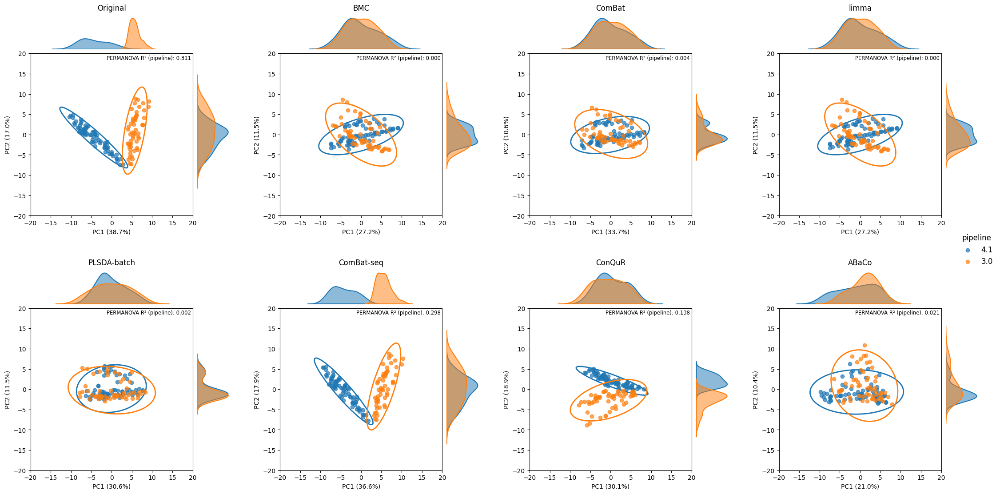

In [20]:
# Original data state
dtu_pcoa, dtu_explained = pcoa_aitchison(dtu_data_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
# Other methods
dtu_pcoa_bmc, dtu_exp_bmc = pcoa_aitchison(dtu_recon_bmc, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_combat, dtu_exp_combat = pcoa_aitchison(dtu_recon_combat, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_limma, dtu_exp_limma = pcoa_aitchison(dtu_recon_limma, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_plsda, dtu_exp_plsda = pcoa_aitchison(dtu_recon_plsda, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_combatseq, dtu_exp_combatseq = pcoa_aitchison(dtu_recon_combatseq_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_conqur, dtu_exp_conqur = pcoa_aitchison(dtu_recon_conqur_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
# ABaCo
dtu_pcoa_abaco, dtu_exp_abaco = pcoa_aitchison(dtu_recon_vmm_kl_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)

fig, axes = plt.subplots(2, 4, figsize=(22,11), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(dtu_pcoa, dtu_batch_label, dtu_data_clr, dtu_sample_label, axes[0][0], explained=dtu_explained, xlim=[-20, 20], ylim=[-20, 20], title="Original", show_legend=False)
plot_pcoa_2(dtu_pcoa_bmc, dtu_batch_label, dtu_recon_bmc, dtu_sample_label, axes[0][1], explained=dtu_exp_bmc, xlim=[-20, 20], ylim=[-20, 20], title="BMC", show_legend=False)
plot_pcoa_2(dtu_pcoa_combat, dtu_batch_label, dtu_recon_combat, dtu_sample_label, axes[0][2], explained=dtu_exp_combat, xlim=[-20, 20], ylim=[-20, 20], title="ComBat", show_legend=False)
plot_pcoa_2(dtu_pcoa_limma, dtu_batch_label, dtu_recon_limma, dtu_sample_label, axes[0][3], explained=dtu_exp_limma, xlim=[-20, 20], ylim=[-20, 20], title="limma", show_legend=False)
plot_pcoa_2(dtu_pcoa_plsda, dtu_batch_label, dtu_recon_plsda, dtu_sample_label, axes[1][0], explained=dtu_exp_plsda, xlim=[-20, 20], ylim=[-20, 20], title="PLSDA-batch", show_legend=False)
plot_pcoa_2(dtu_pcoa_combatseq, dtu_batch_label, dtu_recon_combatseq_clr, dtu_sample_label, axes[1][1], explained=dtu_exp_combatseq, xlim=[-20, 20], ylim=[-20, 20], title="ComBat-seq", show_legend=False)
plot_pcoa_2(dtu_pcoa_conqur, dtu_batch_label, dtu_recon_conqur_clr, dtu_sample_label, axes[1][2], explained=dtu_exp_conqur, xlim=[-20, 20], ylim=[-20, 20], title="ConQuR", show_legend=False)
plot_pcoa_2(dtu_pcoa_abaco, dtu_batch_label, dtu_recon_vmm_kl_clr, dtu_sample_label, axes[1][3], explained=dtu_exp_abaco, xlim=[-20, 20], ylim=[-20, 20], title="ABaCo", show_legend=False)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=dtu_batch_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.02, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

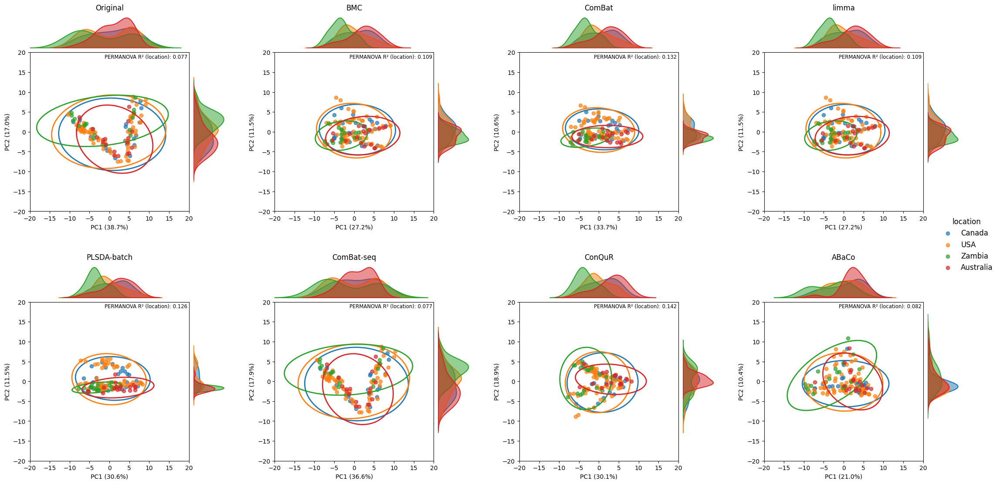

In [21]:
# Original data state
dtu_pcoa, dtu_explained = pcoa_aitchison(dtu_data_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
# Other methods
dtu_pcoa_bmc, dtu_exp_bmc = pcoa_aitchison(dtu_recon_bmc, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_combat, dtu_exp_combat = pcoa_aitchison(dtu_recon_combat, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_limma, dtu_exp_limma = pcoa_aitchison(dtu_recon_limma, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_plsda, dtu_exp_plsda = pcoa_aitchison(dtu_recon_plsda, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_combatseq, dtu_exp_combatseq = pcoa_aitchison(dtu_recon_combatseq_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_conqur, dtu_exp_conqur = pcoa_aitchison(dtu_recon_conqur_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
# ABaCo
dtu_pcoa_abaco, dtu_exp_abaco = pcoa_aitchison(dtu_recon_vmm_kl_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)

fig, axes = plt.subplots(2, 4, figsize=(22,11), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(dtu_pcoa, dtu_bio_label, dtu_data_clr, dtu_sample_label, axes[0][0], explained=dtu_explained, xlim=[-20, 20], ylim=[-20, 20], title="Original", show_legend=False)
plot_pcoa_2(dtu_pcoa_bmc, dtu_bio_label, dtu_recon_bmc, dtu_sample_label, axes[0][1], explained=dtu_exp_bmc, xlim=[-20, 20], ylim=[-20, 20], title="BMC", show_legend=False)
plot_pcoa_2(dtu_pcoa_combat, dtu_bio_label, dtu_recon_combat, dtu_sample_label, axes[0][2], explained=dtu_exp_combat, xlim=[-20, 20], ylim=[-20, 20], title="ComBat", show_legend=False)
plot_pcoa_2(dtu_pcoa_limma, dtu_bio_label, dtu_recon_limma, dtu_sample_label, axes[0][3], explained=dtu_exp_limma, xlim=[-20, 20], ylim=[-20, 20], title="limma", show_legend=False)
plot_pcoa_2(dtu_pcoa_plsda, dtu_bio_label, dtu_recon_plsda, dtu_sample_label, axes[1][0], explained=dtu_exp_plsda, xlim=[-20, 20], ylim=[-20, 20], title="PLSDA-batch", show_legend=False)
plot_pcoa_2(dtu_pcoa_combatseq, dtu_bio_label, dtu_recon_combatseq_clr, dtu_sample_label, axes[1][1], explained=dtu_exp_combatseq, xlim=[-20, 20], ylim=[-20, 20], title="ComBat-seq", show_legend=False)
plot_pcoa_2(dtu_pcoa_conqur, dtu_bio_label, dtu_recon_conqur_clr, dtu_sample_label, axes[1][2], explained=dtu_exp_conqur, xlim=[-20, 20], ylim=[-20, 20], title="ConQuR", show_legend=False)
plot_pcoa_2(dtu_pcoa_abaco, dtu_bio_label, dtu_recon_vmm_kl_clr, dtu_sample_label, axes[1][3], explained=dtu_exp_abaco, xlim=[-20, 20], ylim=[-20, 20], title="ABaCo", show_legend=False)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=dtu_bio_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.04, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

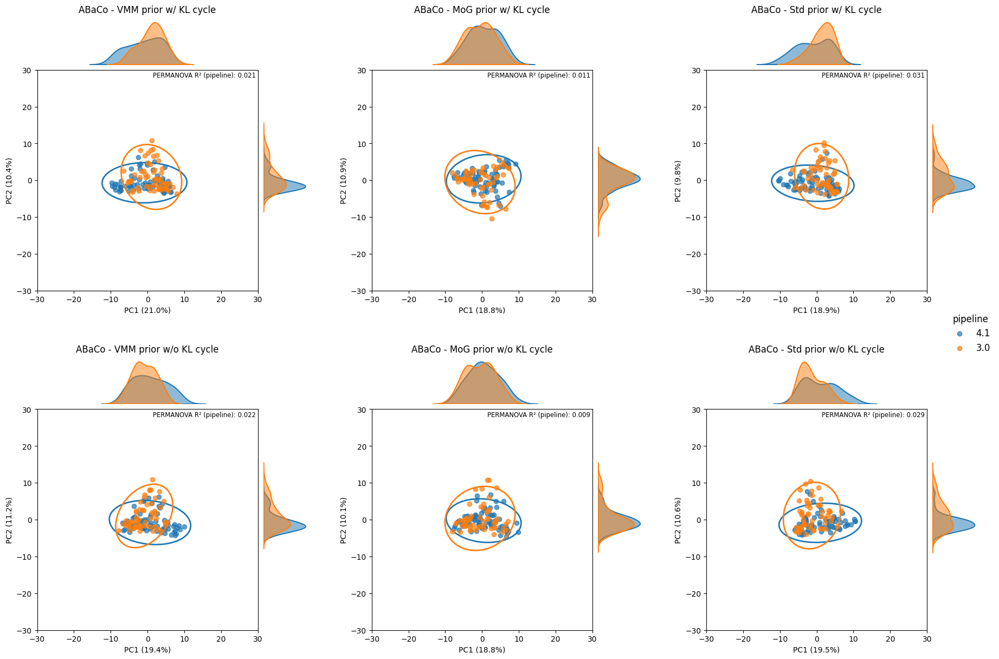

In [22]:
# ABaCo - Other priors
dtu_pcoa_abaco_vmm_kl, dtu_exp_abaco_vmm_kl = pcoa_aitchison(dtu_recon_vmm_kl_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_abaco_mog_kl, dtu_exp_abaco_mog_kl = pcoa_aitchison(dtu_recon_mog_kl_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_abaco_std_kl, dtu_exp_abaco_std_kl = pcoa_aitchison(dtu_recon_std_kl_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_abaco_vmm_no, dtu_exp_abaco_vmm_no = pcoa_aitchison(dtu_recon_vmm_no_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_abaco_mog_no, dtu_exp_abaco_mog_no = pcoa_aitchison(dtu_recon_mog_no_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_abaco_std_no, dtu_exp_abaco_std_no = pcoa_aitchison(dtu_recon_std_no_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)

fig, axes = plt.subplots(2, 3, figsize=(18,12), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(dtu_pcoa_abaco_vmm_kl, dtu_batch_label, dtu_recon_vmm_kl_clr, dtu_sample_label, axes[0][0], explained=dtu_exp_abaco_vmm_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - VMM prior w/ KL cycle", show_legend=False)
plot_pcoa_2(dtu_pcoa_abaco_mog_kl, dtu_batch_label, dtu_recon_mog_kl_clr, dtu_sample_label, axes[0][1], explained=dtu_exp_abaco_mog_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - MoG prior w/ KL cycle", show_legend=False)
plot_pcoa_2(dtu_pcoa_abaco_std_kl, dtu_batch_label, dtu_recon_std_kl_clr, dtu_sample_label, axes[0][2], explained=dtu_exp_abaco_std_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - Std prior w/ KL cycle", show_legend=False)
plot_pcoa_2(dtu_pcoa_abaco_vmm_no, dtu_batch_label, dtu_recon_vmm_no_clr, dtu_sample_label, axes[1][0], explained=dtu_exp_abaco_vmm_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - VMM prior w/o KL cycle", show_legend=False)
plot_pcoa_2(dtu_pcoa_abaco_mog_no, dtu_batch_label, dtu_recon_mog_no_clr, dtu_sample_label, axes[1][1], explained=dtu_exp_abaco_mog_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - MoG prior w/o KL cycle", show_legend=False)
plot_pcoa_2(dtu_pcoa_abaco_std_no, dtu_batch_label, dtu_recon_std_no_clr, dtu_sample_label, axes[1][2], explained=dtu_exp_abaco_std_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - Std prior w/o KL cycle", show_legend=False)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=dtu_batch_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.02, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

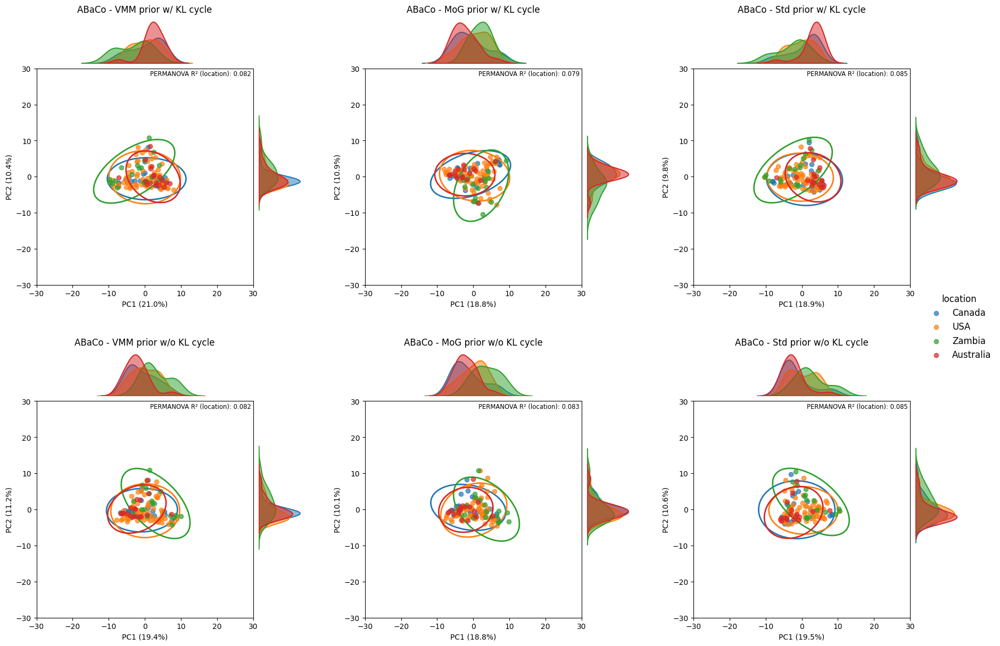

In [23]:
# ABaCo - Other priors
dtu_pcoa_abaco_vmm_kl, dtu_exp_abaco_vmm_kl = pcoa_aitchison(dtu_recon_vmm_kl_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_abaco_mog_kl, dtu_exp_abaco_mog_kl = pcoa_aitchison(dtu_recon_mog_kl_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_abaco_std_kl, dtu_exp_abaco_std_kl = pcoa_aitchison(dtu_recon_std_kl_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_abaco_vmm_no, dtu_exp_abaco_vmm_no = pcoa_aitchison(dtu_recon_vmm_no_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_abaco_mog_no, dtu_exp_abaco_mog_no = pcoa_aitchison(dtu_recon_mog_no_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)
dtu_pcoa_abaco_std_no, dtu_exp_abaco_std_no = pcoa_aitchison(dtu_recon_std_no_clr, dtu_sample_label, dtu_batch_label, dtu_bio_label)

fig, axes = plt.subplots(2, 3, figsize=(18,12), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(dtu_pcoa_abaco_vmm_kl, dtu_bio_label, dtu_recon_vmm_kl_clr, dtu_sample_label, axes[0][0], explained=dtu_exp_abaco_vmm_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - VMM prior w/ KL cycle", show_legend=False)
plot_pcoa_2(dtu_pcoa_abaco_mog_kl, dtu_bio_label, dtu_recon_mog_kl_clr, dtu_sample_label, axes[0][1], explained=dtu_exp_abaco_mog_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - MoG prior w/ KL cycle", show_legend=False)
plot_pcoa_2(dtu_pcoa_abaco_std_kl, dtu_bio_label, dtu_recon_std_kl_clr, dtu_sample_label, axes[0][2], explained=dtu_exp_abaco_std_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - Std prior w/ KL cycle", show_legend=False)
plot_pcoa_2(dtu_pcoa_abaco_vmm_no, dtu_bio_label, dtu_recon_vmm_no_clr, dtu_sample_label, axes[1][0], explained=dtu_exp_abaco_vmm_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - VMM prior w/o KL cycle", show_legend=False)
plot_pcoa_2(dtu_pcoa_abaco_mog_no, dtu_bio_label, dtu_recon_mog_no_clr, dtu_sample_label, axes[1][1], explained=dtu_exp_abaco_mog_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - MoG prior w/o KL cycle", show_legend=False)
plot_pcoa_2(dtu_pcoa_abaco_std_no, dtu_bio_label, dtu_recon_std_no_clr, dtu_sample_label, axes[1][2], explained=dtu_exp_abaco_std_no, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo - Std prior w/o KL cycle", show_legend=False)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=dtu_bio_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.04, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

## Batch effect correction metrics

### Computation of batch effect metrics - ABaCo models

In [24]:
# Defining ARI with GMM 
def ARI_GMM(data, interest_label="tissue", n_clusters=None):

    data_otus = data.select_dtypes(include="number")  # OTUs
    data_bio = data[interest_label]  # Labels

    if n_clusters == None:
        gmm = GaussianMixture(
            n_components=len(set(data_bio)), random_state=42, covariance_type="full"
        )  # GMM clustering
    else:
        gmm = GaussianMixture(
            n_clusters=n_clusters, random_state=42, covariance_type="full"
        )  # GMM clustering w/ n clusters

    gmm.fit(data_otus) # Fitting model to data
    predicted_clusters = gmm.predict(data_otus)  # Predicting label of cluster

    ari = adjusted_rand_score(data_bio, predicted_clusters)  # ARI
    return ari

In [25]:
# kBET
ad_recon_vmm_kl_kbet = kBET(data = ad_recon_vmm_kl_clr, batch_label=ad_count_batch_label)
ibd_recon_vmm_kl_kbet = kBET(data = ibd_recon_vmm_kl_clr, batch_label=ibd_batch_label)
dtu_recon_vmm_kl_kbet = kBET(data = dtu_recon_vmm_kl_clr, batch_label=dtu_batch_label)

ad_recon_mog_kl_kbet = kBET(data = ad_recon_mog_kl_clr, batch_label=ad_count_batch_label)
ibd_recon_mog_kl_kbet = kBET(data = ibd_recon_mog_kl_clr, batch_label=ibd_batch_label)
dtu_recon_mog_kl_kbet = kBET(data = dtu_recon_mog_kl_clr, batch_label=dtu_batch_label)

ad_recon_std_kl_kbet = kBET(data = ad_recon_std_kl_clr, batch_label=ad_count_batch_label)
ibd_recon_std_kl_kbet = kBET(data = ibd_recon_std_kl_clr, batch_label=ibd_batch_label)
dtu_recon_std_kl_kbet = kBET(data = dtu_recon_std_kl_clr, batch_label=dtu_batch_label)

ad_recon_vmm_no_kbet = kBET(data = ad_recon_vmm_no_clr, batch_label=ad_count_batch_label)
ibd_recon_vmm_no_kbet = kBET(data = ibd_recon_vmm_no_clr, batch_label=ibd_batch_label)
dtu_recon_vmm_no_kbet = kBET(data = dtu_recon_vmm_no_clr, batch_label=dtu_batch_label)

ad_recon_mog_no_kbet = kBET(data = ad_recon_mog_no_clr, batch_label=ad_count_batch_label)
ibd_recon_mog_no_kbet = kBET(data = ibd_recon_mog_no_clr, batch_label=ibd_batch_label)
dtu_recon_mog_no_kbet = kBET(data = dtu_recon_mog_no_clr, batch_label=dtu_batch_label)

ad_recon_std_no_kbet = kBET(data = ad_recon_std_no_clr, batch_label=ad_count_batch_label)
ibd_recon_std_no_kbet = kBET(data = ibd_recon_std_no_clr, batch_label=ibd_batch_label)
dtu_recon_std_no_kbet = kBET(data = dtu_recon_std_no_clr, batch_label=dtu_batch_label)

# ASW
ad_recon_vmm_kl_asw = ASW(data = ad_recon_vmm_kl_clr, interest_label=ad_count_batch_label)
ad_recon_vmm_kl_asw = 1 - abs(ad_recon_vmm_kl_asw)
ibd_recon_vmm_kl_asw = ASW(data = ibd_recon_vmm_kl_clr, interest_label=ibd_batch_label)
ibd_recon_vmm_kl_asw = 1 - abs(ibd_recon_vmm_kl_asw)
dtu_recon_vmm_kl_asw = ASW(data = dtu_recon_vmm_kl_clr, interest_label=dtu_batch_label)
dtu_recon_vmm_kl_asw = 1 - abs(dtu_recon_vmm_kl_asw)

ad_recon_mog_kl_asw = ASW(data = ad_recon_mog_kl_clr, interest_label=ad_count_batch_label)
ad_recon_mog_kl_asw = 1 - abs(ad_recon_mog_kl_asw)
ibd_recon_mog_kl_asw = ASW(data = ibd_recon_mog_kl_clr, interest_label=ibd_batch_label)
ibd_recon_mog_kl_asw = 1 - abs(ibd_recon_mog_kl_asw)
dtu_recon_mog_kl_asw = ASW(data = dtu_recon_mog_kl_clr, interest_label=dtu_batch_label)
dtu_recon_mog_kl_asw = 1 - abs(dtu_recon_mog_kl_asw)

ad_recon_std_kl_asw = ASW(data = ad_recon_std_kl_clr, interest_label=ad_count_batch_label)
ad_recon_std_kl_asw = 1 - abs(ad_recon_std_kl_asw)
ibd_recon_std_kl_asw = ASW(data = ibd_recon_std_kl_clr, interest_label=ibd_batch_label)
ibd_recon_std_kl_asw = 1 - abs(ibd_recon_std_kl_asw)
dtu_recon_std_kl_asw = ASW(data = dtu_recon_std_kl_clr, interest_label=dtu_batch_label)
dtu_recon_std_kl_asw = 1 - abs(dtu_recon_std_kl_asw)

ad_recon_vmm_no_asw = ASW(data = ad_recon_vmm_no_clr, interest_label=ad_count_batch_label)
ad_recon_vmm_no_asw = 1 - abs(ad_recon_vmm_no_asw)
ibd_recon_vmm_no_asw = ASW(data = ibd_recon_vmm_no_clr, interest_label=ibd_batch_label)
ibd_recon_vmm_no_asw = 1 - abs(ibd_recon_vmm_no_asw )
dtu_recon_vmm_no_asw = ASW(data = dtu_recon_vmm_no_clr, interest_label=dtu_batch_label)
dtu_recon_vmm_no_asw = 1 - abs(dtu_recon_vmm_no_asw)

ad_recon_mog_no_asw = ASW(data = ad_recon_mog_no_clr, interest_label=ad_count_batch_label)
ad_recon_mog_no_asw = 1 - abs(ad_recon_mog_no_asw)
ibd_recon_mog_no_asw = ASW(data = ibd_recon_mog_no_clr, interest_label=ibd_batch_label)
ibd_recon_mog_no_asw = 1 - abs(ibd_recon_mog_no_asw)
dtu_recon_mog_no_asw = ASW(data = dtu_recon_mog_no_clr, interest_label=dtu_batch_label)
dtu_recon_mog_no_asw = 1 - abs(dtu_recon_mog_no_asw)

ad_recon_std_no_asw = ASW(data = ad_recon_std_no_clr, interest_label=ad_count_batch_label)
ad_recon_std_no_asw = 1 - abs(ad_recon_std_no_asw)
ibd_recon_std_no_asw = ASW(data = ibd_recon_std_no_clr, interest_label=ibd_batch_label)
ibd_recon_std_no_asw = 1 - abs(ibd_recon_std_no_asw)
dtu_recon_std_no_asw = ASW(data = dtu_recon_std_no_clr, interest_label=dtu_batch_label)
dtu_recon_std_no_asw = 1 - abs(dtu_recon_std_no_asw)

# ARI
# ad_recon_vmm_kl_ari = ARI(data = ad_recon_vmm_kl_clr, interest_label=ad_count_batch_label)
# ad_recon_vmm_kl_ari = 1 - abs(ad_recon_vmm_kl_ari)
# ibd_recon_vmm_kl_ari = ARI(data = ibd_recon_vmm_kl_clr, interest_label=ibd_batch_label)
# ibd_recon_vmm_kl_ari = 1 - abs(ibd_recon_vmm_kl_ari)
# dtu_recon_vmm_kl_ari = ARI(data = dtu_recon_vmm_kl_clr, interest_label=dtu_batch_label)
# dtu_recon_vmm_kl_ari = 1 - abs(dtu_recon_vmm_kl_ari)

# ad_recon_mog_kl_ari = ARI(data = ad_recon_mog_kl_clr, interest_label=ad_count_batch_label)
# ad_recon_mog_kl_ari = 1 - abs(ad_recon_mog_kl_ari)
# ibd_recon_mog_kl_ari = ARI(data = ibd_recon_mog_kl_clr, interest_label=ibd_batch_label)
# ibd_recon_mog_kl_ari = 1 - abs(ibd_recon_mog_kl_ari)
# dtu_recon_mog_kl_ari = ARI(data = dtu_recon_mog_kl_clr, interest_label=dtu_batch_label)
# dtu_recon_mog_kl_ari = 1 - abs(dtu_recon_mog_kl_ari)

# ad_recon_std_kl_ari = ARI(data = ad_recon_std_kl_clr, interest_label=ad_count_batch_label)
# ad_recon_std_kl_ari = 1 - abs(ad_recon_std_kl_ari)
# ibd_recon_std_kl_ari = ARI(data = ibd_recon_std_kl_clr, interest_label=ibd_batch_label)
# ibd_recon_std_kl_ari = 1 - abs(ibd_recon_std_kl_ari)
# dtu_recon_std_kl_ari = ARI(data = dtu_recon_std_kl_clr, interest_label=dtu_batch_label)
# dtu_recon_std_kl_ari = 1 - abs(dtu_recon_std_kl_ari)

# ad_recon_vmm_no_ari = ARI(data = ad_recon_vmm_no_clr, interest_label=ad_count_batch_label)
# ad_recon_vmm_no_ari = 1 - abs(ad_recon_vmm_no_ari)
# ibd_recon_vmm_no_ari = ARI(data = ibd_recon_vmm_no_clr, interest_label=ibd_batch_label)
# ibd_recon_vmm_no_ari = 1 - abs(ibd_recon_vmm_no_ari)
# dtu_recon_vmm_no_ari = ARI(data = dtu_recon_vmm_no_clr, interest_label=dtu_batch_label)
# dtu_recon_vmm_no_ari = 1 - abs(dtu_recon_vmm_no_ari)

# ad_recon_mog_no_ari = ARI(data = ad_recon_mog_no_clr, interest_label=ad_count_batch_label)
# ad_recon_mog_no_ari = 1 - abs(ad_recon_mog_no_ari)
# ibd_recon_mog_no_ari = ARI(data = ibd_recon_mog_no_clr, interest_label=ibd_batch_label)
# ibd_recon_mog_no_ari = 1 - abs(ibd_recon_mog_no_ari)
# dtu_recon_mog_no_ari = ARI(data = dtu_recon_mog_no_clr, interest_label=dtu_batch_label)
# dtu_recon_mog_no_ari = 1 - abs(dtu_recon_mog_no_ari)

# ad_recon_std_no_ari = ARI(data = ad_recon_std_no_clr, interest_label=ad_count_batch_label)
# ad_recon_std_no_ari = 1 - abs(ad_recon_std_no_ari)
# ibd_recon_std_no_ari = ARI(data = ibd_recon_std_no_clr, interest_label=ibd_batch_label)
# ibd_recon_std_no_ari = 1 - abs(ibd_recon_std_no_ari)
# dtu_recon_std_no_ari = ARI(data = dtu_recon_std_no_clr, interest_label=dtu_batch_label)
# dtu_recon_std_no_ari = 1 - abs(dtu_recon_std_no_ari)

# ARI GMM
ad_recon_vmm_kl_ari = ARI_GMM(data = ad_recon_vmm_kl_clr, interest_label=ad_count_batch_label)
ad_recon_vmm_kl_ari = 1 - ad_recon_vmm_kl_ari
ibd_recon_vmm_kl_ari = ARI_GMM(data = ibd_recon_vmm_kl_clr, interest_label=ibd_batch_label)
ibd_recon_vmm_kl_ari = 1 - ibd_recon_vmm_kl_ari
dtu_recon_vmm_kl_ari = ARI_GMM(data = dtu_recon_vmm_kl_clr, interest_label=dtu_batch_label)
dtu_recon_vmm_kl_ari = 1 - dtu_recon_vmm_kl_ari

ad_recon_mog_kl_ari = ARI_GMM(data = ad_recon_mog_kl_clr, interest_label=ad_count_batch_label)
ad_recon_mog_kl_ari = 1 - ad_recon_mog_kl_ari
ibd_recon_mog_kl_ari = ARI_GMM(data = ibd_recon_mog_kl_clr, interest_label=ibd_batch_label)
ibd_recon_mog_kl_ari = 1 - ibd_recon_mog_kl_ari
dtu_recon_mog_kl_ari = ARI_GMM(data = dtu_recon_mog_kl_clr, interest_label=dtu_batch_label)
dtu_recon_mog_kl_ari = 1 - dtu_recon_mog_kl_ari

ad_recon_std_kl_ari = ARI_GMM(data = ad_recon_std_kl_clr, interest_label=ad_count_batch_label)
ad_recon_std_kl_ari = 1 - ad_recon_std_kl_ari
ibd_recon_std_kl_ari = ARI_GMM(data = ibd_recon_std_kl_clr, interest_label=ibd_batch_label)
ibd_recon_std_kl_ari = 1 - ibd_recon_std_kl_ari
dtu_recon_std_kl_ari = ARI_GMM(data = dtu_recon_std_kl_clr, interest_label=dtu_batch_label)
dtu_recon_std_kl_ari = 1 - dtu_recon_std_kl_ari

ad_recon_vmm_no_ari = ARI_GMM(data = ad_recon_vmm_no_clr, interest_label=ad_count_batch_label)
ad_recon_vmm_no_ari = 1 - ad_recon_vmm_no_ari
ibd_recon_vmm_no_ari = ARI_GMM(data = ibd_recon_vmm_no_clr, interest_label=ibd_batch_label)
ibd_recon_vmm_no_ari = 1 - ibd_recon_vmm_no_ari
dtu_recon_vmm_no_ari = ARI_GMM(data = dtu_recon_vmm_no_clr, interest_label=dtu_batch_label)
dtu_recon_vmm_no_ari = 1 - dtu_recon_vmm_no_ari

ad_recon_mog_no_ari = ARI_GMM(data = ad_recon_mog_no_clr, interest_label=ad_count_batch_label)
ad_recon_mog_no_ari = 1 - ad_recon_mog_no_ari
ibd_recon_mog_no_ari = ARI_GMM(data = ibd_recon_mog_no_clr, interest_label=ibd_batch_label)
ibd_recon_mog_no_ari = 1 - ibd_recon_mog_no_ari
dtu_recon_mog_no_ari = ARI_GMM(data = dtu_recon_mog_no_clr, interest_label=dtu_batch_label)
dtu_recon_mog_no_ari = 1 - dtu_recon_mog_no_ari

ad_recon_std_no_ari = ARI_GMM(data = ad_recon_std_no_clr, interest_label=ad_count_batch_label)
ad_recon_std_no_ari = 1 - ad_recon_std_no_ari
ibd_recon_std_no_ari = ARI_GMM(data = ibd_recon_std_no_clr, interest_label=ibd_batch_label)
ibd_recon_std_no_ari = 1 - ibd_recon_std_no_ari
dtu_recon_std_no_ari = ARI_GMM(data = dtu_recon_std_no_clr, interest_label=dtu_batch_label)
dtu_recon_std_no_ari = 1 - dtu_recon_std_no_ari

# iLISI
ad_recon_vmm_kl_ilisi = iLISI_norm(data = ad_recon_vmm_kl_clr, batch_label=ad_count_batch_label)
ibd_recon_vmm_kl_ilisi = iLISI_norm(data = ibd_recon_vmm_kl_clr, batch_label=ibd_batch_label)
dtu_recon_vmm_kl_ilisi = iLISI_norm(data = dtu_recon_vmm_kl_clr, batch_label=dtu_batch_label)

ad_recon_mog_kl_ilisi = iLISI_norm(data = ad_recon_mog_kl_clr, batch_label=ad_count_batch_label)
ibd_recon_mog_kl_ilisi = iLISI_norm(data = ibd_recon_mog_kl_clr, batch_label=ibd_batch_label)
dtu_recon_mog_kl_ilisi = iLISI_norm(data = dtu_recon_mog_kl_clr, batch_label=dtu_batch_label)

ad_recon_std_kl_ilisi = iLISI_norm(data = ad_recon_std_kl_clr, batch_label=ad_count_batch_label)
ibd_recon_std_kl_ilisi = iLISI_norm(data = ibd_recon_std_kl_clr, batch_label=ibd_batch_label)
dtu_recon_std_kl_ilisi = iLISI_norm(data = dtu_recon_std_kl_clr, batch_label=dtu_batch_label)

ad_recon_vmm_no_ilisi = iLISI_norm(data = ad_recon_vmm_no_clr, batch_label=ad_count_batch_label)
ibd_recon_vmm_no_ilisi = iLISI_norm(data = ibd_recon_vmm_no_clr, batch_label=ibd_batch_label)
dtu_recon_vmm_no_ilisi = iLISI_norm(data = dtu_recon_vmm_no_clr, batch_label=dtu_batch_label)

ad_recon_mog_no_ilisi = iLISI_norm(data = ad_recon_mog_no_clr, batch_label=ad_count_batch_label)
ibd_recon_mog_no_ilisi = iLISI_norm(data = ibd_recon_mog_no_clr, batch_label=ibd_batch_label)
dtu_recon_mog_no_ilisi = iLISI_norm(data = dtu_recon_mog_no_clr, batch_label=dtu_batch_label)

ad_recon_std_no_ilisi = iLISI_norm(data = ad_recon_std_no_clr, batch_label=ad_count_batch_label)
ibd_recon_std_no_ilisi = iLISI_norm(data = ibd_recon_std_no_clr, batch_label=ibd_batch_label)
dtu_recon_std_no_ilisi = iLISI_norm(data = dtu_recon_std_no_clr, batch_label=dtu_batch_label)

### Computation of batch effect metrics - Other methods

In [26]:
# kBET
ad_original_kbet = kBET(data = ad_count_data_clr, batch_label = ad_count_batch_label)
ibd_original_kbet = kBET(data = ibd_data_clr, batch_label = ibd_batch_label)
dtu_original_kbet = kBET(data = dtu_data_clr, batch_label = dtu_batch_label)

ad_recon_bmc_kbet = kBET(data = ad_recon_bmc, batch_label = ad_count_batch_label)
ibd_recon_bmc_kbet = kBET(data = ibd_recon_bmc, batch_label = ibd_batch_label)
dtu_recon_bmc_kbet = kBET(data = dtu_recon_bmc, batch_label = dtu_batch_label)

ad_recon_combat_kbet = kBET(data = ad_recon_combat, batch_label = ad_count_batch_label)
ibd_recon_combat_kbet = kBET(data = ibd_recon_combat, batch_label = ibd_batch_label)
dtu_recon_combat_kbet = kBET(data = dtu_recon_combat, batch_label = dtu_batch_label)

ad_recon_limma_kbet = kBET(data = ad_recon_limma, batch_label = ad_count_batch_label)
ibd_recon_limma_kbet = kBET(data = ibd_recon_limma, batch_label = ibd_batch_label)
dtu_recon_limma_kbet = kBET(data = dtu_recon_limma, batch_label = dtu_batch_label)

ad_recon_plsda_kbet = kBET(data = ad_recon_plsda, batch_label = ad_count_batch_label)
ibd_recon_plsda_kbet = kBET(data = ibd_recon_plsda, batch_label = ibd_batch_label)
dtu_recon_plsda_kbet = kBET(data = dtu_recon_plsda, batch_label = dtu_batch_label)

ad_recon_combatseq_kbet = kBET(data = ad_recon_combatseq_clr, batch_label = ad_count_batch_label)
ibd_recon_combatseq_kbet = kBET(data = ibd_recon_combatseq_clr, batch_label = ibd_batch_label)
dtu_recon_combatseq_kbet = kBET(data = dtu_recon_combatseq_clr, batch_label = dtu_batch_label)

ad_recon_conqur_kbet = kBET(data = ad_recon_conqur_clr, batch_label = ad_count_batch_label)
ibd_recon_conqur_kbet = kBET(data = ibd_recon_conqur_clr, batch_label = ibd_batch_label)
dtu_recon_conqur_kbet = kBET(data = dtu_recon_conqur_clr, batch_label = dtu_batch_label)

# ASW
ad_original_asw = ASW(data = ad_count_data_clr, interest_label = ad_count_batch_label)
ad_original_asw = 1 - abs(ad_original_asw)
ibd_original_asw = ASW(data = ibd_data_clr, interest_label = ibd_batch_label)
ibd_original_asw = 1 - abs(ibd_original_asw)
dtu_original_asw = ASW(data = dtu_data_clr, interest_label = dtu_batch_label)
dtu_original_asw = 1 - abs(dtu_original_asw)

ad_recon_bmc_asw = ASW(data = ad_recon_bmc, interest_label = ad_count_batch_label)
ad_recon_bmc_asw = 1 - abs(ad_recon_bmc_asw)
ibd_recon_bmc_asw = ASW(data = ibd_recon_bmc, interest_label = ibd_batch_label)
ibd_recon_bmc_asw = 1 - abs(ibd_recon_bmc_asw)
dtu_recon_bmc_asw = ASW(data = dtu_recon_bmc, interest_label = dtu_batch_label)
dtu_recon_bmc_asw = 1 - abs(dtu_recon_bmc_asw)

ad_recon_combat_asw = ASW(data = ad_recon_combat, interest_label = ad_count_batch_label)
ad_recon_combat_asw = 1 - abs(ad_recon_combat_asw)
ibd_recon_combat_asw = ASW(data = ibd_recon_combat, interest_label = ibd_batch_label)
ibd_recon_combat_asw = 1 - abs(ibd_recon_combat_asw)
dtu_recon_combat_asw = ASW(data = dtu_recon_combat, interest_label = dtu_batch_label)
dtu_recon_combat_asw = 1 - abs(dtu_recon_combat_asw)

ad_recon_limma_asw = ASW(data = ad_recon_limma, interest_label = ad_count_batch_label)
ad_recon_limma_asw = 1 - abs(ad_recon_limma_asw)
ibd_recon_limma_asw = ASW(data = ibd_recon_limma, interest_label = ibd_batch_label)
ibd_recon_limma_asw = 1 - abs(ibd_recon_limma_asw)
dtu_recon_limma_asw = ASW(data = dtu_recon_limma, interest_label = dtu_batch_label)
dtu_recon_limma_asw = 1 - abs(dtu_recon_limma_asw)

ad_recon_plsda_asw = ASW(data = ad_recon_plsda, interest_label = ad_count_batch_label)
ad_recon_plsda_asw = 1 - abs(ad_recon_plsda_asw)
ibd_recon_plsda_asw = ASW(data = ibd_recon_plsda, interest_label = ibd_batch_label)
ibd_recon_plsda_asw = 1 - abs(ibd_recon_plsda_asw)
dtu_recon_plsda_asw = ASW(data = dtu_recon_plsda, interest_label = dtu_batch_label)
dtu_recon_plsda_asw = 1 - abs(dtu_recon_plsda_asw)

ad_recon_combatseq_asw = ASW(data = ad_recon_combatseq_clr, interest_label = ad_count_batch_label)
ad_recon_combatseq_asw = 1 - abs(ad_recon_combatseq_asw)
ibd_recon_combatseq_asw = ASW(data = ibd_recon_combatseq_clr, interest_label = ibd_batch_label)
ibd_recon_combatseq_asw = 1 - abs(ibd_recon_combatseq_asw)
dtu_recon_combatseq_asw = ASW(data = dtu_recon_combatseq_clr, interest_label = dtu_batch_label)
dtu_recon_combatseq_asw = 1 - abs(dtu_recon_combatseq_asw)

ad_recon_conqur_asw = ASW(data = ad_recon_conqur_clr, interest_label = ad_count_batch_label)
ad_recon_conqur_asw = 1 - abs(ad_recon_conqur_asw)
ibd_recon_conqur_asw = ASW(data = ibd_recon_conqur_clr, interest_label = ibd_batch_label)
ibd_recon_conqur_asw = 1 - abs(ibd_recon_conqur_asw)
dtu_recon_conqur_asw = ASW(data = dtu_recon_conqur_clr, interest_label = dtu_batch_label)
dtu_recon_conqur_asw = 1 - abs(dtu_recon_conqur_asw)

# ARI
# ad_original_ari = ARI(data = ad_count_data_clr, interest_label = ad_count_batch_label)
# ad_original_ari = 1 - abs(ad_original_ari)
# ibd_original_ari = ARI(data = ibd_data_clr, interest_label = ibd_batch_label)
# ibd_original_ari = 1 - abs(ibd_original_ari)
# dtu_original_ari = ARI(data = dtu_data_clr, interest_label = dtu_batch_label)
# dtu_original_ari = 1 - abs(dtu_original_ari)

# ad_recon_bmc_ari = ARI(data = ad_recon_bmc, interest_label = ad_count_batch_label)
# ad_recon_bmc_ari = 1 - abs(ad_recon_bmc_ari)
# ibd_recon_bmc_ari = ARI(data = ibd_recon_bmc, interest_label = ibd_batch_label)
# ibd_recon_bmc_ari = 1 - abs(ibd_recon_bmc_ari)
# dtu_recon_bmc_ari = ARI(data = dtu_recon_bmc, interest_label = dtu_batch_label)
# dtu_recon_bmc_ari = 1 - abs(dtu_recon_bmc_ari)

# ad_recon_combat_ari = ARI(data = ad_recon_combat, interest_label = ad_count_batch_label)
# ad_recon_combat_ari = 1 - abs(ad_recon_combat_ari)
# ibd_recon_combat_ari = ARI(data = ibd_recon_combat, interest_label = ibd_batch_label)
# ibd_recon_combat_ari = 1 - abs(ibd_recon_combat_ari)
# dtu_recon_combat_ari = ARI(data = dtu_recon_combat, interest_label = dtu_batch_label)
# dtu_recon_combat_ari = 1 - abs(dtu_recon_combat_ari)

# ad_recon_limma_ari = ARI(data = ad_recon_limma, interest_label = ad_count_batch_label)
# ad_recon_limma_ari = 1 - abs(ad_recon_limma_ari)
# ibd_recon_limma_ari = ARI(data = ibd_recon_limma, interest_label = ibd_batch_label)
# ibd_recon_limma_ari = 1 - abs(ibd_recon_limma_ari)
# dtu_recon_limma_ari = ARI(data = dtu_recon_limma, interest_label = dtu_batch_label)
# dtu_recon_limma_ari = 1 - abs(dtu_recon_limma_ari)

# ad_recon_plsda_ari = ARI(data = ad_recon_plsda, interest_label = ad_count_batch_label)
# ad_recon_plsda_ari = 1 - abs(ad_recon_plsda_ari)
# ibd_recon_plsda_ari = ARI(data = ibd_recon_plsda, interest_label = ibd_batch_label)
# ibd_recon_plsda_ari = 1 - abs(ibd_recon_plsda_ari)
# dtu_recon_plsda_ari = ARI(data = dtu_recon_plsda, interest_label = dtu_batch_label)
# dtu_recon_plsda_ari = 1 - abs(dtu_recon_plsda_ari)

# ad_recon_combatseq_ari = ARI(data = ad_recon_combatseq_clr, interest_label = ad_count_batch_label)
# ad_recon_combatseq_ari = 1 - abs(ad_recon_combatseq_ari)
# ibd_recon_combatseq_ari = ARI(data = ibd_recon_combatseq_clr, interest_label = ibd_batch_label)
# ibd_recon_combatseq_ari = 1 - abs(ibd_recon_combatseq_ari)
# dtu_recon_combatseq_ari = ARI(data = dtu_recon_combatseq_clr, interest_label = dtu_batch_label)
# dtu_recon_combatseq_ari = 1 - abs(dtu_recon_combatseq_ari)

# ad_recon_conqur_ari = ARI(data = ad_recon_conqur_clr, interest_label = ad_count_batch_label)
# ad_recon_conqur_ari = 1 - abs(ad_recon_conqur_ari)
# ibd_recon_conqur_ari = ARI(data = ibd_recon_conqur_clr, interest_label = ibd_batch_label)
# ibd_recon_conqur_ari = 1 - abs(ibd_recon_conqur_ari)
# dtu_recon_conqur_ari = ARI(data = dtu_recon_conqur_clr, interest_label = dtu_batch_label)
# dtu_recon_conqur_ari = 1 - abs(dtu_recon_conqur_ari)

# ARI GMM
ad_original_ari = ARI_GMM(data = ad_count_data_clr, interest_label = ad_count_batch_label)
ad_original_ari = 1 - ad_original_ari
ibd_original_ari = ARI_GMM(data = ibd_data_clr, interest_label = ibd_batch_label)
ibd_original_ari = 1 - ibd_original_ari
dtu_original_ari = ARI_GMM(data = dtu_data_clr, interest_label = dtu_batch_label)
dtu_original_ari = 1 - dtu_original_ari

ad_recon_bmc_ari = ARI_GMM(data = ad_recon_bmc, interest_label = ad_count_batch_label)
ad_recon_bmc_ari = 1 - ad_recon_bmc_ari
ibd_recon_bmc_ari = ARI_GMM(data = ibd_recon_bmc, interest_label = ibd_batch_label)
ibd_recon_bmc_ari = 1 - ibd_recon_bmc_ari
dtu_recon_bmc_ari = ARI_GMM(data = dtu_recon_bmc, interest_label = dtu_batch_label)
dtu_recon_bmc_ari = 1 - dtu_recon_bmc_ari

ad_recon_combat_ari = ARI_GMM(data = ad_recon_combat, interest_label = ad_count_batch_label)
ad_recon_combat_ari = 1 - ad_recon_combat_ari
ibd_recon_combat_ari = ARI_GMM(data = ibd_recon_combat, interest_label = ibd_batch_label)
ibd_recon_combat_ari = 1 - ibd_recon_combat_ari
dtu_recon_combat_ari = ARI_GMM(data = dtu_recon_combat, interest_label = dtu_batch_label)
dtu_recon_combat_ari = 1 - dtu_recon_combat_ari

ad_recon_limma_ari = ARI_GMM(data = ad_recon_limma, interest_label = ad_count_batch_label)
ad_recon_limma_ari = 1 - ad_recon_limma_ari
ibd_recon_limma_ari = ARI_GMM(data = ibd_recon_limma, interest_label = ibd_batch_label)
ibd_recon_limma_ari = 1 - ibd_recon_limma_ari
dtu_recon_limma_ari = ARI_GMM(data = dtu_recon_limma, interest_label = dtu_batch_label)
dtu_recon_limma_ari = 1 - dtu_recon_limma_ari

ad_recon_plsda_ari = ARI_GMM(data = ad_recon_plsda, interest_label = ad_count_batch_label)
ad_recon_plsda_ari = 1 - ad_recon_plsda_ari
ibd_recon_plsda_ari = ARI_GMM(data = ibd_recon_plsda, interest_label = ibd_batch_label)
ibd_recon_plsda_ari = 1 - ibd_recon_plsda_ari
dtu_recon_plsda_ari = ARI_GMM(data = dtu_recon_plsda, interest_label = dtu_batch_label)
dtu_recon_plsda_ari = 1 - dtu_recon_plsda_ari

ad_recon_combatseq_ari = ARI_GMM(data = ad_recon_combatseq_clr, interest_label = ad_count_batch_label)
ad_recon_combatseq_ari = 1 - ad_recon_combatseq_ari
ibd_recon_combatseq_ari = ARI_GMM(data = ibd_recon_combatseq_clr, interest_label = ibd_batch_label)
ibd_recon_combatseq_ari = 1 - ibd_recon_combatseq_ari
dtu_recon_combatseq_ari = ARI_GMM(data = dtu_recon_combatseq_clr, interest_label = dtu_batch_label)
dtu_recon_combatseq_ari = 1 - dtu_recon_combatseq_ari

ad_recon_conqur_ari = ARI_GMM(data = ad_recon_conqur_clr, interest_label = ad_count_batch_label)
ad_recon_conqur_ari = 1 - ad_recon_conqur_ari
ibd_recon_conqur_ari = ARI_GMM(data = ibd_recon_conqur_clr, interest_label = ibd_batch_label)
ibd_recon_conqur_ari = 1 - ibd_recon_conqur_ari
dtu_recon_conqur_ari = ARI_GMM(data = dtu_recon_conqur_clr, interest_label = dtu_batch_label)
dtu_recon_conqur_ari = 1 - dtu_recon_conqur_ari

# iLISI
ad_original_ilisi = iLISI_norm(data = ad_count_data_clr, batch_label = ad_count_batch_label)
ibd_original_ilisi = iLISI_norm(data = ibd_data_clr, batch_label = ibd_batch_label)
dtu_original_ilisi = iLISI_norm(data = dtu_data_clr, batch_label = dtu_batch_label)

ad_recon_bmc_ilisi = iLISI_norm(data = ad_recon_bmc, batch_label = ad_count_batch_label)
ibd_recon_bmc_ilisi = iLISI_norm(data = ibd_recon_bmc, batch_label = ibd_batch_label)
dtu_recon_bmc_ilisi = iLISI_norm(data = dtu_recon_bmc, batch_label = dtu_batch_label)

ad_recon_combat_ilisi = iLISI_norm(data = ad_recon_combat, batch_label = ad_count_batch_label)
ibd_recon_combat_ilisi = iLISI_norm(data = ibd_recon_combat, batch_label = ibd_batch_label)
dtu_recon_combat_ilisi = iLISI_norm(data = dtu_recon_combat, batch_label = dtu_batch_label)

ad_recon_limma_ilisi = iLISI_norm(data = ad_recon_limma, batch_label = ad_count_batch_label)
ibd_recon_limma_ilisi = iLISI_norm(data = ibd_recon_limma, batch_label = ibd_batch_label)
dtu_recon_limma_ilisi = iLISI_norm(data = dtu_recon_limma, batch_label = dtu_batch_label)

ad_recon_plsda_ilisi = iLISI_norm(data = ad_recon_plsda, batch_label = ad_count_batch_label)
ibd_recon_plsda_ilisi = iLISI_norm(data = ibd_recon_plsda, batch_label = ibd_batch_label)
dtu_recon_plsda_ilisi = iLISI_norm(data = dtu_recon_plsda, batch_label = dtu_batch_label)

ad_recon_combatseq_ilisi = iLISI_norm(data = ad_recon_combatseq_clr, batch_label = ad_count_batch_label)
ibd_recon_combatseq_ilisi = iLISI_norm(data = ibd_recon_combatseq_clr, batch_label = ibd_batch_label)
dtu_recon_combatseq_ilisi = iLISI_norm(data = dtu_recon_combatseq_clr, batch_label = dtu_batch_label)

ad_recon_conqur_ilisi = iLISI_norm(data = ad_recon_conqur_clr, batch_label = ad_count_batch_label)
ibd_recon_conqur_ilisi = iLISI_norm(data = ibd_recon_conqur_clr, batch_label = ibd_batch_label)
dtu_recon_conqur_ilisi = iLISI_norm(data = dtu_recon_conqur_clr, batch_label = dtu_batch_label)

### Barplots: VMM ABaCo vs others

(0.0, 1.05)

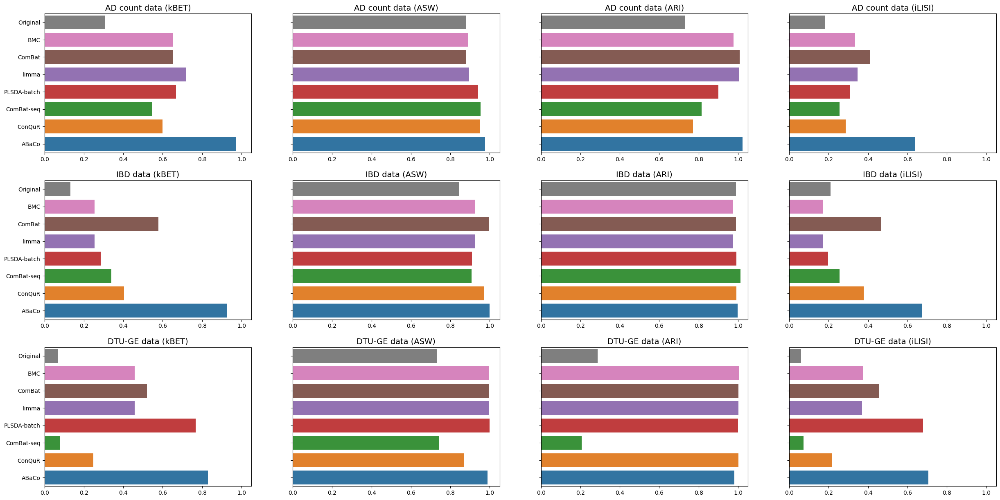

In [27]:
# Start subplot
fig, axes = plt.subplots(3, 4, figsize = (30,15), sharey=True)

# kBET
ad_abaco_kbet = ad_recon_vmm_kl_kbet
ibd_abaco_kbet = ibd_recon_vmm_kl_kbet
dtu_abaco_kbet = dtu_recon_vmm_kl_kbet

ad_kbet_results =  {"Original": ad_original_kbet, 
                   "BMC": ad_recon_bmc_kbet, 
                   "ComBat": ad_recon_combat_kbet, 
                   "limma": ad_recon_limma_kbet, 
                   "PLSDA-batch": ad_recon_plsda_kbet, 
                   "ComBat-seq": ad_recon_combatseq_kbet, 
                   "ConQuR": ad_recon_conqur_kbet, 
                   "ABaCo": ad_abaco_kbet}

ibd_kbet_results = {"Original": ibd_original_kbet, 
                   "BMC": ibd_recon_bmc_kbet, 
                   "ComBat": ibd_recon_combat_kbet, 
                   "limma": ibd_recon_limma_kbet, 
                   "PLSDA-batch": ibd_recon_plsda_kbet, 
                   "ComBat-seq": ibd_recon_combatseq_kbet, 
                   "ConQuR": ibd_recon_conqur_kbet, 
                   "ABaCo": ibd_abaco_kbet}

dtu_kbet_results = {"Original": dtu_original_kbet, 
                   "BMC": dtu_recon_bmc_kbet, 
                   "ComBat": dtu_recon_combat_kbet, 
                   "limma": dtu_recon_limma_kbet, 
                   "PLSDA-batch": dtu_recon_plsda_kbet, 
                   "ComBat-seq": dtu_recon_combatseq_kbet, 
                   "ConQuR": dtu_recon_conqur_kbet, 
                   "ABaCo": dtu_abaco_kbet}

palette = list(reversed(sns.color_palette("tab10", n_colors=8)))

sns.barplot(
    y = ad_kbet_results.keys(),
    x = [ad_kbet_results[k] for k in ad_kbet_results.keys()],
    ax = axes[0,0],
    palette = palette,
)


axes[0, 0].set_title("AD count data (kBET)", fontsize=14)
# axes[0, 0].set_xlabel("Method", fontsize=12)
# axes[0, 0].set_ylabel("kBET", fontsize=12)
axes[0, 0].set_xlim(0, 1.05)

sns.barplot(
    y = ibd_kbet_results.keys(),
    x = [ibd_kbet_results[k] for k in ibd_kbet_results.keys()],
    ax = axes[1,0],
    palette = palette
)

axes[1, 0].set_title("IBD data (kBET)", fontsize=14)
# axes[1, 0].set_xlabel("Method", fontsize=12)
# axes[1, 0].set_ylabel("kBET", fontsize=12)
axes[1, 0].set_xlim(0, 1.05)

sns.barplot(
    y = dtu_kbet_results.keys(),
    x = [dtu_kbet_results[k] for k in dtu_kbet_results.keys()],
    ax = axes[2,0],
    palette = palette
)

axes[2, 0].set_title("DTU-GE data (kBET)", fontsize=14)
# axes[2, 0].set_xlabel("Method", fontsize=12)
# axes[2, 0].set_ylabel("kBET", fontsize=12)
axes[2, 0].set_xlim(0, 1.05)

# ASW
ad_abaco_asw = ad_recon_vmm_kl_asw
ibd_abaco_asw = ibd_recon_vmm_kl_asw
dtu_abaco_asw = dtu_recon_vmm_kl_asw

ad_asw_results =  {"Original": ad_original_asw, 
                   "BMC": ad_recon_bmc_asw, 
                   "ComBat": ad_recon_combat_asw, 
                   "limma": ad_recon_limma_asw, 
                   "PLSDA-batch": ad_recon_plsda_asw, 
                   "ComBat-seq": ad_recon_combatseq_asw, 
                   "ConQuR": ad_recon_conqur_asw, 
                   "ABaCo": ad_abaco_asw}

ibd_asw_results = {"Original": ibd_original_asw, 
                   "BMC": ibd_recon_bmc_asw, 
                   "ComBat": ibd_recon_combat_asw, 
                   "limma": ibd_recon_limma_asw, 
                   "PLSDA-batch": ibd_recon_plsda_asw, 
                   "ComBat-seq": ibd_recon_combatseq_asw, 
                   "ConQuR": ibd_recon_conqur_asw, 
                   "ABaCo": ibd_abaco_asw}

dtu_asw_results = {"Original": dtu_original_asw, 
                   "BMC": dtu_recon_bmc_asw, 
                   "ComBat": dtu_recon_combat_asw, 
                   "limma": dtu_recon_limma_asw, 
                   "PLSDA-batch": dtu_recon_plsda_asw, 
                   "ComBat-seq": dtu_recon_combatseq_asw, 
                   "ConQuR": dtu_recon_conqur_asw, 
                   "ABaCo": dtu_abaco_asw}

palette = list(reversed(sns.color_palette("tab10", n_colors=8)))
dtu_palette = [col for i, col in enumerate(palette) if i != 6]

sns.barplot(
    y = ad_asw_results.keys(),
    x = [ad_asw_results[k] for k in ad_asw_results.keys()],
    ax = axes[0,1],
    palette = palette,
)


axes[0, 1].set_title("AD count data (ASW)", fontsize=14)
# axes[0, 1].set_xlabel("Method", fontsize=12)
# axes[0, 1].set_ylabel("ASW", fontsize=12)
axes[0, 1].set_xlim(0, 1.05)

sns.barplot(
    y = ibd_asw_results.keys(),
    x = [ibd_asw_results[k] for k in ibd_asw_results.keys()],
    ax = axes[1,1],
    palette = palette
)

axes[1, 1].set_title("IBD data (ASW)", fontsize=14)
# axes[1, 1].set_xlabel("Method", fontsize=12)
# axes[1, 1].set_ylabel("ASW", fontsize=12)
axes[1, 1].set_xlim(0, 1.05)

sns.barplot(
    y = dtu_asw_results.keys(),
    x = [dtu_asw_results[k] for k in dtu_asw_results.keys()],
    ax = axes[2,1],
    palette = palette
)

axes[2, 1].set_title("DTU-GE data (ASW)", fontsize=14)
# axes[2, 1].set_xlabel("Method", fontsize=12)
# axes[2, 1].set_ylabel("ASW", fontsize=12)
axes[2, 1].set_xlim(0, 1.05)

# ARI
ad_abaco_ari = ad_recon_vmm_kl_ari
ibd_abaco_ari = ibd_recon_vmm_kl_ari
dtu_abaco_ari = dtu_recon_vmm_kl_ari

ad_ari_results =  {"Original": ad_original_ari, 
                   "BMC": ad_recon_bmc_ari, 
                   "ComBat": ad_recon_combat_ari, 
                   "limma": ad_recon_limma_ari, 
                   "PLSDA-batch": ad_recon_plsda_ari, 
                   "ComBat-seq": ad_recon_combatseq_ari, 
                   "ConQuR": ad_recon_conqur_ari, 
                   "ABaCo": ad_abaco_ari}

ibd_ari_results = {"Original": ibd_original_ari, 
                   "BMC": ibd_recon_bmc_ari, 
                   "ComBat": ibd_recon_combat_ari, 
                   "limma": ibd_recon_limma_ari, 
                   "PLSDA-batch": ibd_recon_plsda_ari, 
                   "ComBat-seq": ibd_recon_combatseq_ari, 
                   "ConQuR": ibd_recon_conqur_ari, 
                   "ABaCo": ibd_abaco_ari}

dtu_ari_results = {"Original": dtu_original_ari, 
                   "BMC": dtu_recon_bmc_ari, 
                   "ComBat": dtu_recon_combat_ari, 
                   "limma": dtu_recon_limma_ari, 
                   "PLSDA-batch": dtu_recon_plsda_ari, 
                   "ComBat-seq": dtu_recon_combatseq_ari, 
                   "ConQuR": dtu_recon_conqur_ari, 
                   "ABaCo": dtu_abaco_ari}

palette = list(reversed(sns.color_palette("tab10", n_colors=8)))

sns.barplot(
    y = ad_ari_results.keys(),
    x = [ad_ari_results[k] for k in ad_ari_results.keys()],
    ax = axes[0,2],
    palette = palette,
)

axes[0, 2].set_title("AD count data (ARI)", fontsize=14)
# axes[0, 2].set_xlabel("Method", fontsize=12)
# axes[0, 2].set_ylabel("ARI", fontsize=12)
axes[0, 2].set_xlim(0, 1.05)

sns.barplot(
    y = ibd_ari_results.keys(),
    x = [ibd_ari_results[k] for k in ibd_ari_results.keys()],
    ax = axes[1,2],
    palette = palette
)

axes[1, 2].set_title("IBD data (ARI)", fontsize=14)
# axes[1, 2].set_xlabel("Method", fontsize=12)
# axes[1, 2].set_ylabel("ARI", fontsize=12)
axes[1, 2].set_xlim(0, 1.05)

sns.barplot(
    y = dtu_ari_results.keys(),
    x = [dtu_ari_results[k] for k in dtu_ari_results.keys()],
    ax = axes[2,2],
    palette = palette
)

axes[2, 2].set_title("DTU-GE data (ARI)", fontsize=14)
# axes[2, 2].set_xlabel("Method", fontsize=12)
# axes[2, 2].set_ylabel("ARI", fontsize=12)
axes[2, 2].set_xlim(0, 1.05)

# iLISI
ad_abaco_ilisi = ad_recon_vmm_kl_ilisi
ibd_abaco_ilisi = ibd_recon_vmm_kl_ilisi
dtu_abaco_ilisi = dtu_recon_vmm_kl_ilisi

ad_ilisi_results =  {"Original": ad_original_ilisi, 
                   "BMC": ad_recon_bmc_ilisi, 
                   "ComBat": ad_recon_combat_ilisi, 
                   "limma": ad_recon_limma_ilisi, 
                   "PLSDA-batch": ad_recon_plsda_ilisi, 
                   "ComBat-seq": ad_recon_combatseq_ilisi, 
                   "ConQuR": ad_recon_conqur_ilisi, 
                   "ABaCo": ad_abaco_ilisi}

ibd_ilisi_results = {"Original": ibd_original_ilisi, 
                   "BMC": ibd_recon_bmc_ilisi, 
                   "ComBat": ibd_recon_combat_ilisi, 
                   "limma": ibd_recon_limma_ilisi, 
                   "PLSDA-batch": ibd_recon_plsda_ilisi, 
                   "ComBat-seq": ibd_recon_combatseq_ilisi, 
                   "ConQuR": ibd_recon_conqur_ilisi, 
                   "ABaCo": ibd_abaco_ilisi}

dtu_ilisi_results = {"Original": dtu_original_ilisi, 
                   "BMC": dtu_recon_bmc_ilisi, 
                   "ComBat": dtu_recon_combat_ilisi, 
                   "limma": dtu_recon_limma_ilisi, 
                   "PLSDA-batch": dtu_recon_plsda_ilisi, 
                   "ComBat-seq": dtu_recon_combatseq_ilisi, 
                   "ConQuR": dtu_recon_conqur_ilisi, 
                   "ABaCo": dtu_abaco_ilisi}

palette = list(reversed(sns.color_palette("tab10", n_colors=8)))

sns.barplot(
    y = ad_ilisi_results.keys(),
    x = [ad_ilisi_results[k] for k in ad_ilisi_results.keys()],
    ax = axes[0,3],
    palette = palette,
)

axes[0, 3].set_title("AD count data (iLISI)", fontsize=14)
# axes[0, 3].set_xlabel("Method", fontsize=12)
# axes[0, 3].set_ylabel("iLISI", fontsize=12)
axes[0, 3].set_xlim(0, 1.05)

sns.barplot(
    y = ibd_ilisi_results.keys(),
    x = [ibd_ilisi_results[k] for k in ibd_ilisi_results.keys()],
    ax = axes[1,3],
    palette = palette
)

axes[1, 3].set_title("IBD data (iLISI)", fontsize=14)
# axes[1, 3].set_xlabel("Method", fontsize=12)
# axes[1, 3].set_ylabel("iLISI", fontsize=12)
axes[1, 3].set_xlim(0, 1.05)

sns.barplot(
    y = dtu_ilisi_results.keys(),
    x = [dtu_ilisi_results[k] for k in dtu_ilisi_results.keys()],
    ax = axes[2,3],
    palette = palette
)

axes[2, 3].set_title("DTU-GE data (iLISI)", fontsize=14)
# axes[2, 3].set_xlabel("Method", fontsize=12)
# axes[2, 3].set_ylabel("iLISI", fontsize=12)
axes[2, 3].set_xlim(0, 1.05)

### Barplots: ABaCo vs ABaCo

(0.0, 1.0)

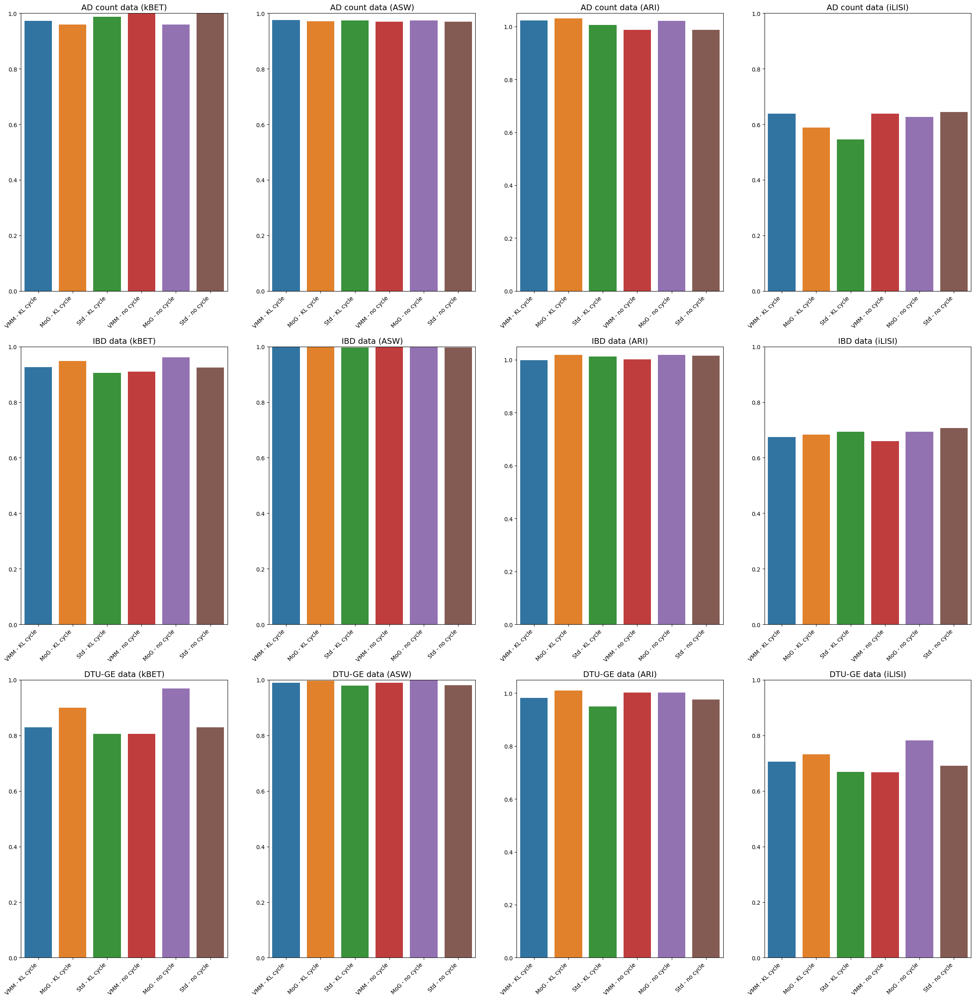

In [28]:
# Start subplot
fig, axes = plt.subplots(3, 4, figsize = (30,30))

# kBET
ad_kbet_results =  {"VMM - KL cycle": ad_recon_vmm_kl_kbet, 
                   "MoG - KL cycle": ad_recon_mog_kl_kbet, 
                   "Std - KL cycle": ad_recon_std_kl_kbet, 
                   "VMM - no cycle": ad_recon_vmm_no_kbet, 
                   "MoG - no cycle": ad_recon_mog_no_kbet, 
                   "Std - no cycle": ad_recon_std_no_kbet}

ibd_kbet_results =  {"VMM - KL cycle": ibd_recon_vmm_kl_kbet, 
                   "MoG - KL cycle": ibd_recon_mog_kl_kbet, 
                   "Std - KL cycle": ibd_recon_std_kl_kbet, 
                   "VMM - no cycle": ibd_recon_vmm_no_kbet, 
                   "MoG - no cycle": ibd_recon_mog_no_kbet, 
                   "Std - no cycle": ibd_recon_std_no_kbet}

dtu_kbet_results =  {"VMM - KL cycle": dtu_recon_vmm_kl_kbet, 
                   "MoG - KL cycle": dtu_recon_mog_kl_kbet, 
                   "Std - KL cycle": dtu_recon_std_kl_kbet, 
                   "VMM - no cycle": dtu_recon_vmm_no_kbet, 
                   "MoG - no cycle": dtu_recon_mog_no_kbet,
                   "Std - no cycle": dtu_recon_std_no_kbet}

palette = sns.color_palette("tab10", n_colors=6)

sns.barplot(
    x = ad_kbet_results.keys(),
    y = [ad_kbet_results[k] for k in ad_kbet_results.keys()],
    ax = axes[0,0],
    palette = palette,
)

axes[0, 0].set_xticklabels(axes[0, 0].get_xticklabels(), rotation=45, ha="right")
axes[0, 0].set_title("AD count data (kBET)", fontsize=14)
# axes[0, 0].set_xlabel("Prior", fontsize=12)
# axes[0, 0].set_ylabel("kBET", fontsize=12)
axes[0, 0].set_ylim(0, 1)

sns.barplot(
    x = ibd_kbet_results.keys(),
    y = [ibd_kbet_results[k] for k in ibd_kbet_results.keys()],
    ax = axes[1,0],
    palette = palette
)
axes[1, 0].set_xticklabels(axes[1, 0].get_xticklabels(), rotation=45, ha="right")
axes[1, 0].set_title("IBD data (kBET)", fontsize=14)
# axes[1, 0].set_xlabel("Prior", fontsize=12)
# axes[1, 0].set_ylabel("kBET", fontsize=12)
axes[1, 0].set_ylim(0, 1)

sns.barplot(
    x = dtu_kbet_results.keys(),
    y = [dtu_kbet_results[k] for k in dtu_kbet_results.keys()],
    ax = axes[2,0],
    palette = palette
)
axes[2, 0].set_xticklabels(axes[2, 0].get_xticklabels(), rotation=45, ha="right")
axes[2, 0].set_title("DTU-GE data (kBET)", fontsize=14)
# axes[2, 0].set_xlabel("Prior", fontsize=12)
# axes[2, 0].set_ylabel("kBET", fontsize=12)
axes[2, 0].set_ylim(0, 1)

# ASW
ad_asw_results =  {"VMM - KL cycle": ad_recon_vmm_kl_asw, 
                   "MoG - KL cycle": ad_recon_mog_kl_asw, 
                   "Std - KL cycle": ad_recon_std_kl_asw, 
                   "VMM - no cycle": ad_recon_vmm_no_asw, 
                   "MoG - no cycle": ad_recon_mog_no_asw, 
                   "Std - no cycle": ad_recon_std_no_asw}

ibd_asw_results =  {"VMM - KL cycle": ibd_recon_vmm_kl_asw, 
                   "MoG - KL cycle": ibd_recon_mog_kl_asw, 
                   "Std - KL cycle": ibd_recon_std_kl_asw, 
                   "VMM - no cycle": ibd_recon_vmm_no_asw, 
                   "MoG - no cycle": ibd_recon_mog_no_asw, 
                   "Std - no cycle": ibd_recon_std_no_asw}

dtu_asw_results =  {"VMM - KL cycle": dtu_recon_vmm_kl_asw, 
                   "MoG - KL cycle": dtu_recon_mog_kl_asw, 
                   "Std - KL cycle": dtu_recon_std_kl_asw, 
                   "VMM - no cycle": dtu_recon_vmm_no_asw, 
                   "MoG - no cycle": dtu_recon_mog_no_asw,
                   "Std - no cycle": dtu_recon_std_no_asw}

palette = sns.color_palette("tab10", n_colors=6)

sns.barplot(
    x = ad_asw_results.keys(),
    y = [ad_asw_results[k] for k in ad_asw_results.keys()],
    ax = axes[0,1],
    palette = palette,
)

axes[0, 1].set_xticklabels(axes[0, 1].get_xticklabels(), rotation=45, ha="right")
axes[0, 1].set_title("AD count data (ASW)", fontsize=14)
# axes[0, 1].set_xlabel("Prior", fontsize=12)
# axes[0, 1].set_ylabel("ASW", fontsize=12)
axes[0, 1].set_ylim(0, 1)

sns.barplot(
    x = ibd_asw_results.keys(),
    y = [ibd_asw_results[k] for k in ibd_asw_results.keys()],
    ax = axes[1,1],
    palette = palette
)
axes[1, 1].set_xticklabels(axes[1, 1].get_xticklabels(), rotation=45, ha="right")
axes[1, 1].set_title("IBD data (ASW)", fontsize=14)
# axes[1, 1].set_xlabel("Prior", fontsize=12)
# axes[1, 1].set_ylabel("ASW", fontsize=12)
axes[1, 1].set_ylim(0, 1)

sns.barplot(
    x = dtu_asw_results.keys(),
    y = [dtu_asw_results[k] for k in dtu_asw_results.keys()],
    ax = axes[2,1],
    palette = palette
)
axes[2, 1].set_xticklabels(axes[2, 1].get_xticklabels(), rotation=45, ha="right")
axes[2, 1].set_title("DTU-GE data (ASW)", fontsize=14)
# axes[2, 1].set_xlabel("Prior", fontsize=12)
# axes[2, 1].set_ylabel("ASW", fontsize=12)
axes[2, 1].set_ylim(0, 1)

# ARI
ad_ari_results =  {"VMM - KL cycle": ad_recon_vmm_kl_ari, 
                   "MoG - KL cycle": ad_recon_mog_kl_ari, 
                   "Std - KL cycle": ad_recon_std_kl_ari, 
                   "VMM - no cycle": ad_recon_vmm_no_ari, 
                   "MoG - no cycle": ad_recon_mog_no_ari, 
                   "Std - no cycle": ad_recon_std_no_ari}

ibd_ari_results =  {"VMM - KL cycle": ibd_recon_vmm_kl_ari, 
                   "MoG - KL cycle": ibd_recon_mog_kl_ari, 
                   "Std - KL cycle": ibd_recon_std_kl_ari, 
                   "VMM - no cycle": ibd_recon_vmm_no_ari, 
                   "MoG - no cycle": ibd_recon_mog_no_ari, 
                   "Std - no cycle": ibd_recon_std_no_ari}

dtu_ari_results =  {"VMM - KL cycle": dtu_recon_vmm_kl_ari, 
                   "MoG - KL cycle": dtu_recon_mog_kl_ari, 
                   "Std - KL cycle": dtu_recon_std_kl_ari, 
                   "VMM - no cycle": dtu_recon_vmm_no_ari, 
                   "MoG - no cycle": dtu_recon_mog_no_ari,
                   "Std - no cycle": dtu_recon_std_no_ari}

palette = sns.color_palette("tab10", n_colors=6)

sns.barplot(
    x = ad_ari_results.keys(),
    y = [ad_ari_results[k] for k in ad_ari_results.keys()],
    ax = axes[0,2],
    palette = palette,
)

axes[0, 2].set_xticklabels(axes[0, 2].get_xticklabels(), rotation=45, ha="right")
axes[0, 2].set_title("AD count data (ARI)", fontsize=14)
# axes[0, 2].set_xlabel("Prior", fontsize=12)
# axes[0, 2].set_ylabel("ARI", fontsize=12)
axes[0, 2].set_ylim(0, 1.05)

sns.barplot(
    x = ibd_ari_results.keys(),
    y = [ibd_ari_results[k] for k in ibd_ari_results.keys()],
    ax = axes[1,2],
    palette = palette
)
axes[1, 2].set_xticklabels(axes[1, 2].get_xticklabels(), rotation=45, ha="right")
axes[1, 2].set_title("IBD data (ARI)", fontsize=14)
# axes[1, 2].set_xlabel("Prior", fontsize=12)
# axes[1, 2].set_ylabel("ARI", fontsize=12)
axes[1, 2].set_ylim(0, 1.05)

sns.barplot(
    x = dtu_ari_results.keys(),
    y = [dtu_ari_results[k] for k in dtu_ari_results.keys()],
    ax = axes[2,2],
    palette = palette
)
axes[2, 2].set_xticklabels(axes[2, 2].get_xticklabels(), rotation=45, ha="right")
axes[2, 2].set_title("DTU-GE data (ARI)", fontsize=14)
# axes[2, 2].set_xlabel("Prior", fontsize=12)
# axes[2, 2].set_ylabel("ARI", fontsize=12)
axes[2, 2].set_ylim(0, 1.05)

# iLISI
ad_ilisi_results =  {"VMM - KL cycle": ad_recon_vmm_kl_ilisi, 
                   "MoG - KL cycle": ad_recon_mog_kl_ilisi, 
                   "Std - KL cycle": ad_recon_std_kl_ilisi, 
                   "VMM - no cycle": ad_recon_vmm_no_ilisi, 
                   "MoG - no cycle": ad_recon_mog_no_ilisi, 
                   "Std - no cycle": ad_recon_std_no_ilisi}

ibd_ilisi_results =  {"VMM - KL cycle": ibd_recon_vmm_kl_ilisi, 
                   "MoG - KL cycle": ibd_recon_mog_kl_ilisi, 
                   "Std - KL cycle": ibd_recon_std_kl_ilisi, 
                   "VMM - no cycle": ibd_recon_vmm_no_ilisi, 
                   "MoG - no cycle": ibd_recon_mog_no_ilisi, 
                   "Std - no cycle": ibd_recon_std_no_ilisi}

dtu_ilisi_results =  {"VMM - KL cycle": dtu_recon_vmm_kl_ilisi, 
                   "MoG - KL cycle": dtu_recon_mog_kl_ilisi, 
                   "Std - KL cycle": dtu_recon_std_kl_ilisi, 
                   "VMM - no cycle": dtu_recon_vmm_no_ilisi, 
                   "MoG - no cycle": dtu_recon_mog_no_ilisi,
                   "Std - no cycle": dtu_recon_std_no_ilisi}

palette = sns.color_palette("tab10", n_colors=6)

sns.barplot(
    x = ad_ilisi_results.keys(),
    y = [ad_ilisi_results[k] for k in ad_ilisi_results.keys()],
    ax = axes[0,3],
    palette = palette,
)

axes[0, 3].set_xticklabels(axes[0, 3].get_xticklabels(), rotation=45, ha="right")
axes[0, 3].set_title("AD count data (iLISI)", fontsize=14)
# axes[0, 3].set_xlabel("Prior", fontsize=12)
# axes[0, 3].set_ylabel("iLISI", fontsize=12)
axes[0, 3].set_ylim(0, 1)

sns.barplot(
    x = ibd_ilisi_results.keys(),
    y = [ibd_ilisi_results[k] for k in ibd_ilisi_results.keys()],
    ax = axes[1,3],
    palette = palette
)
axes[1, 3].set_xticklabels(axes[1, 3].get_xticklabels(), rotation=45, ha="right")
axes[1, 3].set_title("IBD data (iLISI)", fontsize=14)
# axes[1, 3].set_xlabel("Prior", fontsize=12)
# axes[1, 3].set_ylabel("iLISI", fontsize=12)
axes[1, 3].set_ylim(0, 1)

sns.barplot(
    x = dtu_ilisi_results.keys(),
    y = [dtu_ilisi_results[k] for k in dtu_ilisi_results.keys()],
    ax = axes[2,3],
    palette = palette
)
axes[2, 3].set_xticklabels(axes[2, 3].get_xticklabels(), rotation=45, ha="right")
axes[2, 3].set_title("DTU-GE data (iLISI)", fontsize=14)
# axes[2, 3].set_xlabel("Prior", fontsize=12)
# axes[2, 3].set_ylabel("iLISI", fontsize=12)
axes[2, 3].set_ylim(0, 1)

## Kruskal-Wallis on top taxonomic groups

### Definition of function

In [29]:
# Define function to compute Kruskal-Wallis per taxa
def kruskal_wallis_taxa(df, sample_label, batch_label, bio_label, method):
    # Melt dataframe
    melt_df = pd.melt(df, id_vars = [sample_label, batch_label, bio_label], var_name = "taxa", value_name = "norm_counts")
    # Comput K-W test
    results = []
    # Per taxa
    for taxon, df_taxa in melt_df.groupby("taxa"):
        # For each biological group
        groups = []

        for grp, df_grp in df_taxa.groupby(bio_label):

            groups.append(df_grp["norm_counts"].values)

        try:
            stat, pval = kruskal(*groups)
            
        except ValueError:
            continue

        results.append({"taxa":taxon,
                        "H_stat":stat,
                        "p-value":pval})

    kw_df = pd.DataFrame(results)

    rej, p_adj, _, _ = multipletests(kw_df["p-value"], method = "fdr_bh")
    kw_df["p_adj"] = p_adj
    kw_df["significant"] = rej
    kw_df["method"] = method
    return kw_df

### Kruskal-wallis computation on other methods

In [30]:
# AD Count
# Define top taxonomic groups on each dataset
ad_top_taxa = ad_count_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]
ibd_top_taxa = ibd_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]
dtu_top_taxa = dtu_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]

# Creating dataframe to save results
ad_kw_results = pd.DataFrame()

# Original
ad_top_taxa_cols = ad_count_data_clr.select_dtypes(include = "number").columns.intersection(ad_top_taxa)
ad_non_num_cols = ad_count_data_clr.select_dtypes(exclude = "number").columns
ad_top_taxa_data = ad_count_data_clr[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "Original - All batches combined")], axis = 0)

# # Original - One per batch
# for batch in ad_count_data_clr[ad_count_batch_label].unique():
#     ad_top_taxa_data_batch = ad_top_taxa_data[ad_top_taxa_data[ad_count_batch_label] == batch]
#     ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_data_batch, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, f"Original - Batch {batch}")], axis = 0)

# BMC
ad_top_taxa_bmc_data = ad_recon_bmc[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_bmc_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "BMC")], axis = 0)

# ComBat
ad_top_taxa_combat_data = ad_recon_combat[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_combat_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "ComBat")], axis = 0)

# limma
ad_top_taxa_limma_data = ad_recon_limma[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_limma_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "limma")], axis = 0)

# PLSDA-batch
ad_top_taxa_plsda_data = ad_recon_plsda[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_plsda_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "PLSDA-batch")], axis = 0)

# ComBat-seq
ad_top_taxa_combatseq_data = ad_recon_combatseq_clr[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_combatseq_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "ComBat-seq")], axis = 0)

# ConQuR
ad_top_taxa_conqur_data = ad_recon_conqur_clr[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_conqur_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "ConQuR")], axis = 0)

# ABaCo
ad_top_taxa_abaco_data = ad_recon_vmm_kl_clr[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_abaco_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "ABaCo")], axis = 0)


# Creating dataframe to save results
ibd_kw_results = pd.DataFrame()

# Original
ibd_top_taxa_cols = ibd_data_clr.select_dtypes(include = "number").columns.intersection(ibd_top_taxa)
ibd_non_num_cols = ibd_data_clr.select_dtypes(exclude = "number").columns
ibd_top_taxa_data = ibd_data_clr[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "Original - All batches combined")], axis = 0)

# # Original - One per batch
# for batch in ibd_data_clr[ibd_batch_label].unique():
#     ibd_top_taxa_data_batch = ibd_top_taxa_data[ibd_top_taxa_data[ibd_batch_label] == batch]
#     ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_data_batch, ibd_sample_label, ibd_batch_label, ibd_bio_label, f"Original - Batch {batch}")], axis = 0)

# BMC
ibd_top_taxa_bmc_data = ibd_recon_bmc[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_bmc_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "BMC")], axis = 0)

# ComBat
ibd_top_taxa_combat_data = ibd_recon_combat[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_combat_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "ComBat")], axis = 0)

# limma
ibd_top_taxa_limma_data = ibd_recon_limma[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_limma_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "limma")], axis = 0)

# PLSDA-batch
ibd_top_taxa_plsda_data = ibd_recon_plsda[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_plsda_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "PLSDA-batch")], axis = 0)

# ComBat-seq
ibd_top_taxa_combatseq_data = ibd_recon_combatseq_clr[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_combatseq_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "ComBat-seq")], axis = 0)

# ConQuR
ibd_top_taxa_conqur_data = ibd_recon_conqur_clr[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_conqur_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "ConQuR")], axis = 0)

# ABaCo
ibd_top_taxa_abaco_data = ibd_recon_vmm_kl_clr[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_abaco_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "ABaCo")], axis = 0)


# Creating dataframe to save results
dtu_kw_results = pd.DataFrame()

# Original
dtu_top_taxa_cols = dtu_data_clr.select_dtypes(include = "number").columns.intersection(dtu_top_taxa)
dtu_non_num_cols = dtu_data_clr.select_dtypes(exclude = "number").columns
dtu_top_taxa_data = dtu_data_clr[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "Original - All batches combined")], axis = 0)

# # Original - One per batch
# for batch in dtu_data_clr[dtu_batch_label].unique():
#     dtu_top_taxa_data_batch = dtu_top_taxa_data[dtu_top_taxa_data[dtu_batch_label] == batch]
#     dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_data_batch, dtu_sample_label, dtu_batch_label, dtu_bio_label, f"Original - Batch {batch}")], axis = 0)

# BMC
dtu_top_taxa_bmc_data = dtu_recon_bmc[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_bmc_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "BMC")], axis = 0)

# ComBat
dtu_top_taxa_combat_data = dtu_recon_combat[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_combat_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "ComBat")], axis = 0)

# limma
dtu_top_taxa_limma_data = dtu_recon_limma[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_limma_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "limma")], axis = 0)

# PLSDA-batch
dtu_top_taxa_plsda_data = dtu_recon_plsda[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_plsda_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "PLSDA-batch")], axis = 0)

# ComBat-seq
dtu_top_taxa_combatseq_data = dtu_recon_combatseq_clr[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_combatseq_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "ComBat-seq")], axis = 0)

# ConQuR
dtu_top_taxa_conqur_data = dtu_recon_conqur_clr[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_conqur_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "ConQuR")], axis = 0)

# ABaCo
dtu_top_taxa_abaco_data = dtu_recon_vmm_kl_clr[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_abaco_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "ABaCo")], axis = 0)

### Kruskal-wallis computations on ABaCo models

In [31]:
# Define top taxonomic groups on each dataset
ad_top_taxa = ad_count_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]
ibd_top_taxa = ibd_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]
dtu_top_taxa = dtu_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]

# AD Count
# Creating dataframe to save results
ad_kw_results_abaco = pd.DataFrame()

# Original
ad_top_taxa_cols = ad_count_data_clr.select_dtypes(include = "number").columns.intersection(ad_top_taxa)
ad_non_num_cols = ad_count_data_clr.select_dtypes(exclude = "number").columns
ad_top_taxa_data = ad_count_data_clr[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

# VMM KL cycle
ad_top_taxa_abaco_data = ad_recon_vmm_kl_clr[list(ad_non_num_cols) + list(ad_top_taxa_cols)]
ad_kw_results_abaco = pd.concat([ad_kw_results_abaco, kruskal_wallis_taxa(ad_top_taxa_abaco_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "VMM - KL cycle")], axis = 0)

# MoG KL cycle
ad_top_taxa_abaco_data = ad_recon_mog_kl_clr[list(ad_non_num_cols) + list(ad_top_taxa_cols)]
ad_kw_results_abaco = pd.concat([ad_kw_results_abaco, kruskal_wallis_taxa(ad_top_taxa_abaco_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "MoG - KL cycle")], axis = 0)

# Std KL cycle
ad_top_taxa_abaco_data = ad_recon_std_kl_clr[list(ad_non_num_cols) + list(ad_top_taxa_cols)]
ad_kw_results_abaco = pd.concat([ad_kw_results_abaco, kruskal_wallis_taxa(ad_top_taxa_abaco_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "Std - KL cycle")], axis = 0)

# VMM no cycle
ad_top_taxa_abaco_data = ad_recon_vmm_no_clr[list(ad_non_num_cols) + list(ad_top_taxa_cols)]
ad_kw_results_abaco = pd.concat([ad_kw_results_abaco, kruskal_wallis_taxa(ad_top_taxa_abaco_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "VMM - no cycle")], axis = 0)

# MoG no cycle
ad_top_taxa_abaco_data = ad_recon_mog_no_clr[list(ad_non_num_cols) + list(ad_top_taxa_cols)]
ad_kw_results_abaco = pd.concat([ad_kw_results_abaco, kruskal_wallis_taxa(ad_top_taxa_abaco_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "MoG - no cycle")], axis = 0)

# Std no cycle
ad_top_taxa_abaco_data = ad_recon_std_no_clr[list(ad_non_num_cols) + list(ad_top_taxa_cols)]
ad_kw_results_abaco = pd.concat([ad_kw_results_abaco, kruskal_wallis_taxa(ad_top_taxa_abaco_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "Std - no cycle")], axis = 0)

# IBD data
# Creating dataframe to save results
ibd_kw_results_abaco = pd.DataFrame()

# Original
ibd_top_taxa_cols = ibd_data_clr.select_dtypes(include = "number").columns.intersection(ibd_top_taxa)
ibd_non_num_cols = ibd_data_clr.select_dtypes(exclude = "number").columns
ibd_top_taxa_data = ibd_data_clr[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]
ibd_kw_results_abaco = pd.concat([ibd_kw_results_abaco, kruskal_wallis_taxa(ibd_top_taxa_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "Original")], axis = 0)

# VMM KL cycle
ibd_top_taxa_abaco_data = ibd_recon_vmm_kl_clr[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]
ibd_kw_results_abaco = pd.concat([ibd_kw_results_abaco, kruskal_wallis_taxa(ibd_top_taxa_abaco_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "VMM - KL cycle")], axis = 0)

# MoG KL cycle
ibd_top_taxa_abaco_data = ibd_recon_mog_kl_clr[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]
ibd_kw_results_abaco = pd.concat([ibd_kw_results_abaco, kruskal_wallis_taxa(ibd_top_taxa_abaco_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "MoG - KL cycle")], axis = 0)

# Std KL cycle
ibd_top_taxa_abaco_data = ibd_recon_std_kl_clr[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]
ibd_kw_results_abaco = pd.concat([ibd_kw_results_abaco, kruskal_wallis_taxa(ibd_top_taxa_abaco_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "Std - KL cycle")], axis = 0)

# VMM no cycle
ibd_top_taxa_abaco_data = ibd_recon_vmm_no_clr[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]
ibd_kw_results_abaco = pd.concat([ibd_kw_results_abaco, kruskal_wallis_taxa(ibd_top_taxa_abaco_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "VMM - no cycle")], axis = 0)

# MoG no cycle
ibd_top_taxa_abaco_data = ibd_recon_mog_no_clr[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]
ibd_kw_results_abaco = pd.concat([ibd_kw_results_abaco, kruskal_wallis_taxa(ibd_top_taxa_abaco_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "MoG - no cycle")], axis = 0)

# Std no cycle
ibd_top_taxa_abaco_data = ibd_recon_std_no_clr[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]
ibd_kw_results_abaco = pd.concat([ibd_kw_results_abaco, kruskal_wallis_taxa(ibd_top_taxa_abaco_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "Std - no cycle")], axis = 0)

# DTU-GE data
# Creating dataframe to save results
dtu_kw_results_abaco = pd.DataFrame()

# Original
dtu_top_taxa_cols = dtu_data_clr.select_dtypes(include = "number").columns.intersection(dtu_top_taxa)
dtu_non_num_cols = dtu_data_clr.select_dtypes(exclude = "number").columns
dtu_top_taxa_data = dtu_data_clr[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

# VMM KL cycle
dtu_top_taxa_abaco_data = dtu_recon_vmm_kl_clr[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]
dtu_kw_results_abaco = pd.concat([dtu_kw_results_abaco, kruskal_wallis_taxa(dtu_top_taxa_abaco_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "VMM - KL cycle")], axis = 0)

# MoG KL cycle
dtu_top_taxa_abaco_data = dtu_recon_mog_kl_clr[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]
dtu_kw_results_abaco = pd.concat([dtu_kw_results_abaco, kruskal_wallis_taxa(dtu_top_taxa_abaco_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "MoG - KL cycle")], axis = 0)

# Std KL cycle
dtu_top_taxa_abaco_data = dtu_recon_std_kl_clr[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]
dtu_kw_results_abaco = pd.concat([dtu_kw_results_abaco, kruskal_wallis_taxa(dtu_top_taxa_abaco_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "Std - KL cycle")], axis = 0)

# VMM no cycle
dtu_top_taxa_abaco_data = dtu_recon_vmm_no_clr[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]
dtu_kw_results_abaco = pd.concat([dtu_kw_results_abaco, kruskal_wallis_taxa(dtu_top_taxa_abaco_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "VMM - no cycle")], axis = 0)

# MoG no cycle
dtu_top_taxa_abaco_data = dtu_recon_mog_no_clr[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]
dtu_kw_results_abaco = pd.concat([dtu_kw_results_abaco, kruskal_wallis_taxa(dtu_top_taxa_abaco_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "MoG - no cycle")], axis = 0)

# Std no cycle
dtu_top_taxa_abaco_data = dtu_recon_std_no_clr[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]
dtu_kw_results_abaco = pd.concat([dtu_kw_results_abaco, kruskal_wallis_taxa(dtu_top_taxa_abaco_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "Std - no cycle")], axis = 0)

### Heat maps: VMM ABaCo vs others

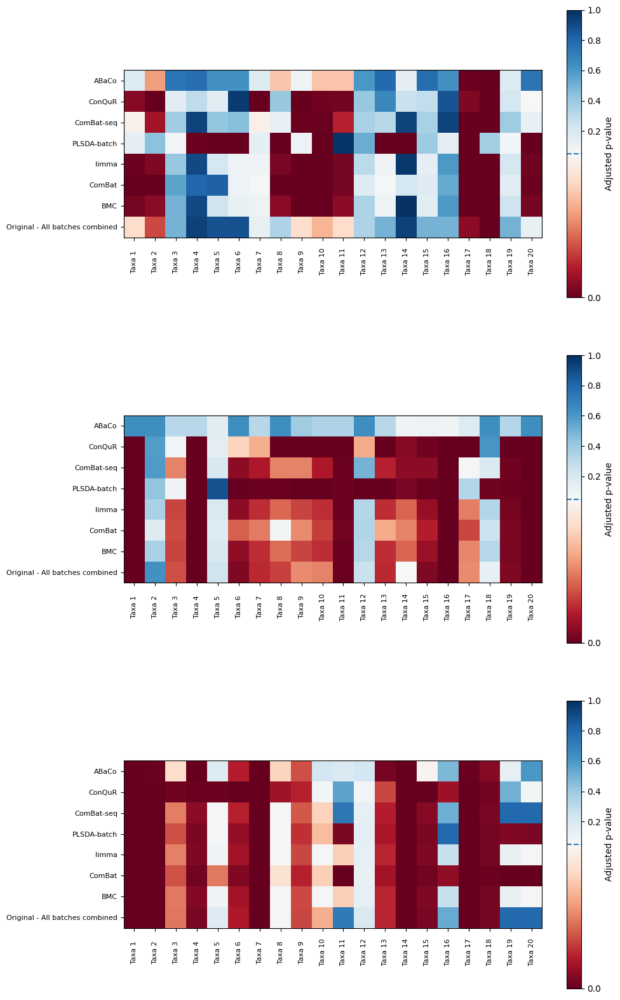

In [32]:
fig, axes = plt.subplots(3, 1, figsize=(10, 20))

# AD count
heat_df = ad_kw_results.pivot(index="method", columns="taxa", values="p_adj").reindex(index = ad_kw_results["method"].drop_duplicates().tolist()) 

vmin = 0
vmax = 1
mid = 0.05

norm = TwoSlopeNorm(vmin = vmin, vcenter = mid, vmax = vmax)
cmap = plt.get_cmap("RdBu")

n_rows, n_cols = heat_df.shape

x = np.arange(n_cols + 1)
y = np.arange(n_rows + 1)

cell_size = 0.3
fig_width  = n_cols * cell_size
fig_height = n_rows * cell_size

ax = axes[0]

im = ax.pcolormesh(
    x, y, heat_df.values, 
    norm=norm,
    cmap=cmap,
    shading="flat")

n_cols = heat_df.shape[1]
generic_labels = [f"Taxa {i+1}" for i in range(n_cols)]
ax.set_xticks(np.arange(n_cols) + 0.5)
ax.set_xticklabels(generic_labels, rotation=90, va='center', fontsize=8)

ax.set_yticks(np.arange(n_rows) + 0.5)
ax.set_yticklabels(heat_df.index, fontsize=8)
ax.set_aspect('equal')
ax.tick_params(axis='x', which='major', pad=24)

cbar = fig.colorbar(im, ax=ax, fraction=0.1)
cbar.set_label('Adjusted p-value')
cbar.ax.hlines(mid, *cbar.ax.get_xlim(), linestyles='--')

# IBD
heat_df = ibd_kw_results.pivot(index="method", columns="taxa", values="p_adj").reindex(index = ibd_kw_results["method"].drop_duplicates().tolist()) 

vmin = 0
vmax = 1
mid = 0.05

norm = TwoSlopeNorm(vmin = vmin, vcenter = mid, vmax = vmax)
cmap = plt.get_cmap("RdBu")

n_rows, n_cols = heat_df.shape

x = np.arange(n_cols + 1)
y = np.arange(n_rows + 1)

cell_size = 0.3
fig_width  = n_cols * cell_size
fig_height = n_rows * cell_size

ax = axes[1]

im = ax.pcolormesh(
    x, y, heat_df.values, 
    norm=norm,
    cmap=cmap,
    shading="flat")

n_cols = heat_df.shape[1]
generic_labels = [f"Taxa {i+1}" for i in range(n_cols)]
ax.set_xticks(np.arange(n_cols) + 0.5)
ax.set_xticklabels(generic_labels, rotation=90, va='center', fontsize=8)

ax.set_yticks(np.arange(n_rows) + 0.5)
ax.set_yticklabels(heat_df.index, fontsize=8)
ax.set_aspect('equal')
ax.tick_params(axis='x', which='major', pad=24)

cbar = fig.colorbar(im, ax=ax, fraction=0.1)
cbar.set_label('Adjusted p-value')
cbar.ax.hlines(mid, *cbar.ax.get_xlim(), linestyles='--')

# DTU-GE
heat_df = dtu_kw_results.pivot(index="method", columns="taxa", values="p_adj").reindex(index = dtu_kw_results["method"].drop_duplicates().tolist()) 

vmin = 0
vmax = 1
mid = 0.05

norm = TwoSlopeNorm(vmin = vmin, vcenter = mid, vmax = vmax)
cmap = plt.get_cmap("RdBu")

n_rows, n_cols = heat_df.shape

x = np.arange(n_cols + 1)
y = np.arange(n_rows + 1)

cell_size = 0.3
fig_width  = n_cols * cell_size
fig_height = n_rows * cell_size

ax = axes[2]

im = ax.pcolormesh(
    x, y, heat_df.values, 
    norm=norm,
    cmap=cmap,
    shading="flat")

n_cols = heat_df.shape[1]
generic_labels = [f"Taxa {i+1}" for i in range(n_cols)]
ax.set_xticks(np.arange(n_cols) + 0.5)
ax.set_xticklabels(generic_labels, rotation=90, va='center', fontsize=8)

ax.set_yticks(np.arange(n_rows) + 0.5)
ax.set_yticklabels(heat_df.index, fontsize=8)
ax.set_aspect('equal')
ax.tick_params(axis='x', which='major', pad=24)

cbar = fig.colorbar(im, ax=ax, fraction=0.1)
cbar.set_label('Adjusted p-value')
cbar.ax.hlines(mid, *cbar.ax.get_xlim(), linestyles='--')

### Heat maps: ABaCo vs ABaCo

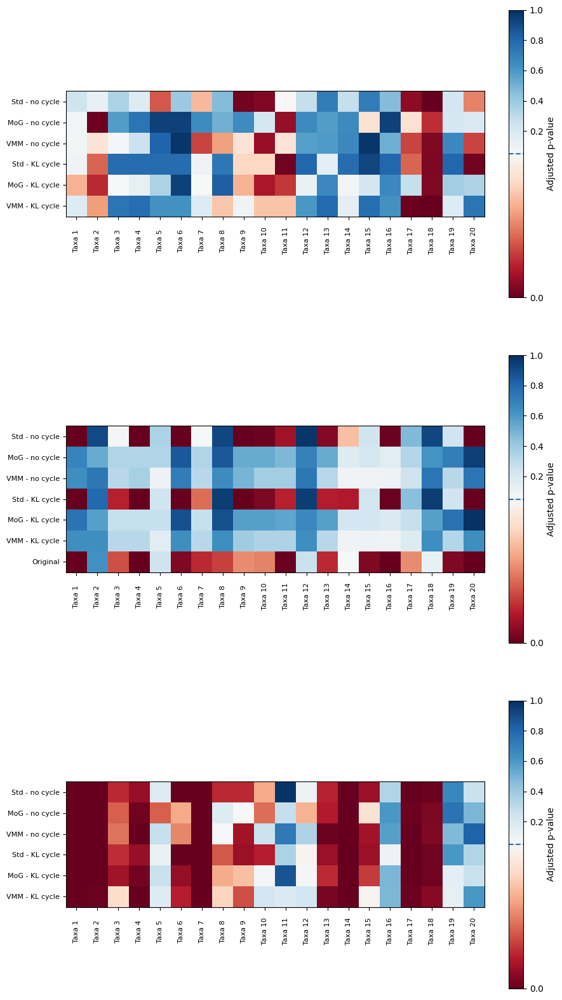

In [33]:
fig, axes = plt.subplots(3, 1, figsize=(10, 20))

# AD count
heat_df = ad_kw_results_abaco.pivot(index="method", columns="taxa", values="p_adj").reindex(index = ad_kw_results_abaco["method"].drop_duplicates().tolist()) 

vmin = 0
vmax = 1
mid = 0.05

norm = TwoSlopeNorm(vmin = vmin, vcenter = mid, vmax = vmax)
cmap = plt.get_cmap("RdBu")

n_rows, n_cols = heat_df.shape

x = np.arange(n_cols + 1)
y = np.arange(n_rows + 1)

cell_size = 0.3
fig_width  = n_cols * cell_size
fig_height = n_rows * cell_size

ax = axes[0]

im = ax.pcolormesh(
    x, y, heat_df.values, 
    norm=norm,
    cmap=cmap,
    shading="flat")

n_cols = heat_df.shape[1]
generic_labels = [f"Taxa {i+1}" for i in range(n_cols)]
ax.set_xticks(np.arange(n_cols) + 0.5)
ax.set_xticklabels(generic_labels, rotation=90, va='center', fontsize=8)

ax.set_yticks(np.arange(n_rows) + 0.5)
ax.set_yticklabels(heat_df.index, fontsize=8)
ax.set_aspect('equal')
ax.tick_params(axis='x', which='major', pad=24)

cbar = fig.colorbar(im, ax=ax, fraction=0.1)
cbar.set_label('Adjusted p-value')
cbar.ax.hlines(mid, *cbar.ax.get_xlim(), linestyles='--')

# IBD
heat_df = ibd_kw_results_abaco.pivot(index="method", columns="taxa", values="p_adj").reindex(index = ibd_kw_results_abaco["method"].drop_duplicates().tolist()) 

vmin = 0
vmax = 1
mid = 0.05

norm = TwoSlopeNorm(vmin = vmin, vcenter = mid, vmax = vmax)
cmap = plt.get_cmap("RdBu")

n_rows, n_cols = heat_df.shape

x = np.arange(n_cols + 1)
y = np.arange(n_rows + 1)

cell_size = 0.3
fig_width  = n_cols * cell_size
fig_height = n_rows * cell_size

ax = axes[1]

im = ax.pcolormesh(
    x, y, heat_df.values, 
    norm=norm,
    cmap=cmap,
    shading="flat")

n_cols = heat_df.shape[1]
generic_labels = [f"Taxa {i+1}" for i in range(n_cols)]
ax.set_xticks(np.arange(n_cols) + 0.5)
ax.set_xticklabels(generic_labels, rotation=90, va='center', fontsize=8)

ax.set_yticks(np.arange(n_rows) + 0.5)
ax.set_yticklabels(heat_df.index, fontsize=8)
ax.set_aspect('equal')
ax.tick_params(axis='x', which='major', pad=24)

cbar = fig.colorbar(im, ax=ax, fraction=0.1)
cbar.set_label('Adjusted p-value')
cbar.ax.hlines(mid, *cbar.ax.get_xlim(), linestyles='--')

# DTU-GE
heat_df = dtu_kw_results_abaco.pivot(index="method", columns="taxa", values="p_adj").reindex(index = dtu_kw_results_abaco["method"].drop_duplicates().tolist()) 

vmin = 0
vmax = 1
mid = 0.05

norm = TwoSlopeNorm(vmin = vmin, vcenter = mid, vmax = vmax)
cmap = plt.get_cmap("RdBu")

n_rows, n_cols = heat_df.shape

x = np.arange(n_cols + 1)
y = np.arange(n_rows + 1)

cell_size = 0.3
fig_width  = n_cols * cell_size
fig_height = n_rows * cell_size

ax = axes[2]

im = ax.pcolormesh(
    x, y, heat_df.values, 
    norm=norm,
    cmap=cmap,
    shading="flat")

n_cols = heat_df.shape[1]
generic_labels = [f"Taxa {i+1}" for i in range(n_cols)]
ax.set_xticks(np.arange(n_cols) + 0.5)
ax.set_xticklabels(generic_labels, rotation=90, va='center', fontsize=8)

ax.set_yticks(np.arange(n_rows) + 0.5)
ax.set_yticklabels(heat_df.index, fontsize=8)
ax.set_aspect('equal')
ax.tick_params(axis='x', which='major', pad=24)

cbar = fig.colorbar(im, ax=ax, fraction=0.1)
cbar.set_label('Adjusted p-value')
cbar.ax.hlines(mid, *cbar.ax.get_xlim(), linestyles='--')

## Co-abundance analysis: taxonomic network construction

### Computing co-abundance matrices: ABaCo models

In [34]:
# Original data
def plot_coabundance(data, ax):
    dataset = data.select_dtypes(include = "number")
    corr, pval = spearmanr(dataset, axis = 0)

    corr_df = pd.DataFrame(corr, index = dataset.columns, columns = dataset.columns)
    pval_df = pd.DataFrame(pval, index = dataset.columns, columns = dataset.columns)

    rho_thresh = 0.05
    p_thresh = 0.05

    mask = (corr_df.abs() >= rho_thresh) & (pval_df <= p_thresh)

    for g in corr_df.columns:
        mask.loc[g,g] = False

    G = nx.Graph()
    for taxa in dataset.columns:
        G.add_node(taxa)

    for i, gi in enumerate(corr_df.index):
        for j, gj in enumerate(corr_df.columns):
            if mask.iloc[i,j]:
                weight = corr_df.iloc[i, j]
                G.add_edge(gi, gj, weight=weight)

    pos = nx.spring_layout(G, k=0.3)

    nx.draw_networkx_nodes(G, pos, node_size=300, ax=ax, node_color='lightblue')

    edges = G.edges(data=True)
    nx.draw_networkx_edges(
        G, pos,
        edgelist=[(u,v) for u,v,_ in edges],
        width=[abs(d['weight']) * 5 for _,_,d in edges],
        alpha=0.7,
        ax=ax
    )

    nx.draw_networkx_labels(G,pos,font_size=8,ax=ax)

    ax.axis('off')
    ax.set_title('Co‑abundance network (Spearman |ρ| ≥ {:.1f})'.format(rho_thresh))
    return G

def plot_network_and_hist(df_clr, rho_thresh=0.6, p_thresh=0.05):
    # --- build your graph G (same as before) ---
    corr, pval = spearmanr(df_clr, axis=0)
    corr_df = pd.DataFrame(corr, index=df_clr.columns, columns=df_clr.columns)
    pval_df = pd.DataFrame(pval, index=df_clr.columns, columns=df_clr.columns)

    mask = (corr_df.abs() >= rho_thresh) & (pval_df <= p_thresh)
    np.fill_diagonal(mask.values, False)

    G = nx.Graph()
    for genus in df_clr.columns:
        G.add_node(genus)
    for i, gi in enumerate(corr_df.index):
        for j, gj in enumerate(corr_df.columns):
            if mask.iloc[i, j]:
                G.add_edge(gi, gj, weight=corr_df.iloc[i, j])

    # --- set up a 1×2 grid of axes ---
    fig, (ax_net, ax_hist) = plt.subplots(ncols=2, figsize=(14, 6))

    # 1) draw the network into ax_net
    pos = nx.spring_layout(G, k=0.3, seed=42)
    nx.draw_networkx_nodes(G, pos, ax=ax_net,
                           node_size=300, node_color='lightblue')
    nx.draw_networkx_edges(G, pos, ax=ax_net,
                           edgelist=G.edges(),
                           width=[abs(G[u][v]['weight'])*5 for u, v in G.edges()],
                           alpha=0.7)
    nx.draw_networkx_labels(G, pos, ax=ax_net, font_size=8)
    ax_net.set_title(f'Co‑abundance Network\n|ρ|≥{rho_thresh}, p≤{p_thresh}')
    ax_net.axis('off')

    # 2) draw the histogram into ax_hist
    weights = [d['weight'] for _, _, d in G.edges(data=True)]
    ax_hist.hist(weights, bins=30)
    ax_hist.set_title('Edge Weight Histogram')
    ax_hist.set_xlabel('Spearman ρ')
    ax_hist.set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()


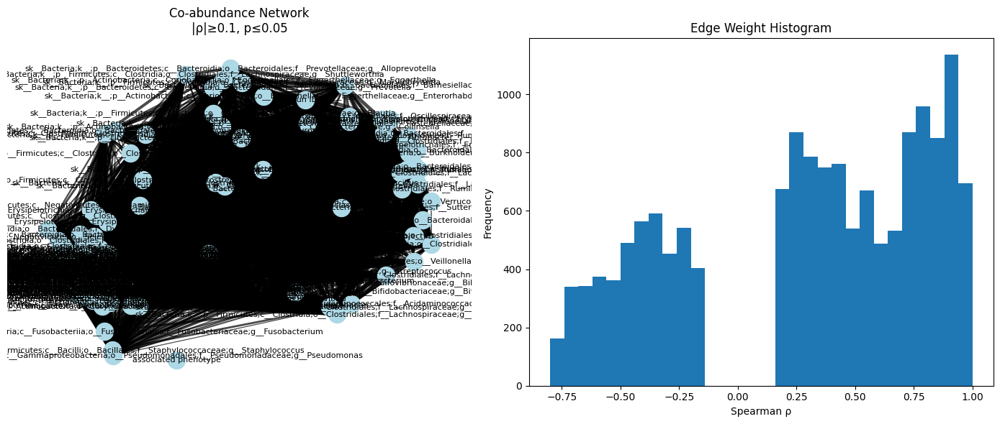

In [35]:
# IBD uncorrected
plot_network_and_hist(ibd_data_clr[ibd_data_clr[ibd_bio_label]=="UC"], rho_thresh=0.1, p_thresh=0.05)

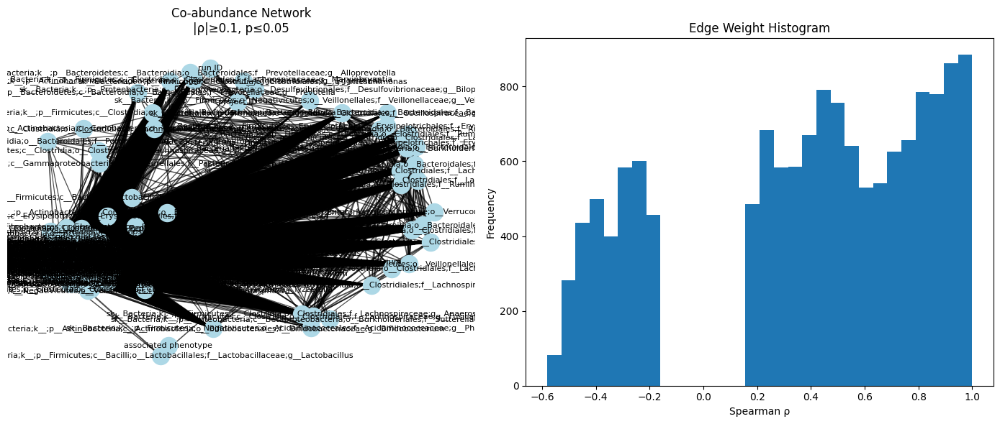

In [36]:
# IBD corrected
plot_network_and_hist(ibd_recon_vmm_kl_clr[ibd_recon_vmm_kl_clr[ibd_bio_label]=="UC"], rho_thresh=0.1, p_thresh=0.05)

## Robustness analysis: multiple run framework

### Loading data from multiple runs

In [37]:
datasets = ["AD_count", "IBD", "DTU-GE"]
dataset_labels = ["AD count", "IBD", "DTU-GE"]
priors = ["vmm_kl", "mog_kl", "std_kl", "vmm_no", "mog_no", "std_no"]
prior_labels = ["VMM w/ KL cycle", "MoG w/ KL cycle", "Std w/ KL cycle", "VMM w/o KL cycle", "MoG w/o KL cycle", "Std w/o KL cycle"]
mult = 1
bio_label = ["trt", "associated phenotype", "location"]
sample_label = ["sample", "run ID", "accession"]
batch_label = ["batch", "project ID", "pipeline"]

multi_runs = []

for j, dataset in enumerate(datasets):
    folder = f"performance_metrics/multi_runs/{dataset}"

    for k, prior in enumerate(priors):
        if (dataset == "DTU-GE"):
            if (prior == "vmm_kl") | (prior == "vmm_no"):
                file_paths = [os.path.join(folder, file) 
                                for file in os.listdir(folder) 
                                if file.startswith(prior) and 
                                os.path.isfile(os.path.join(folder, file)) and
                                int(re.search(r"\d+$", file).group()) % mult == 0 and
                                re.search(r"kl_annealing_\d+$", os.path.splitext(file)[0])]
                
            else:
                file_paths = [os.path.join(folder, file) 
                                for file in os.listdir(folder) 
                                if file.startswith(prior) and 
                                os.path.isfile(os.path.join(folder, file)) and
                                int(re.search(r"\d+$", file).group()) % mult == 0 and
                                re.search(r"contra_1000_\d+$", os.path.splitext(file)[0])]
            
        elif (dataset == "IBD"):
            if (prior == "vmm_kl") | (prior == "vmm_no"):
                file_paths = [os.path.join(folder, file) 
                                for file in os.listdir(folder) 
                                if file.startswith(prior) and 
                                os.path.isfile(os.path.join(folder, file)) and
                                int(re.search(r"\d+$", file).group()) % mult == 0 and
                                re.search(r"kl_annealing_\d+$", os.path.splitext(file)[0])]
                
            else:
                file_paths = [os.path.join(folder, file) 
                                for file in os.listdir(folder) 
                                if file.startswith(prior) and 
                                os.path.isfile(os.path.join(folder, file)) and
                                int(re.search(r"\d+$", file).group()) % mult == 0 and
                                re.search(r"contra_1000_2_\d+$", os.path.splitext(file)[0])]

        else:
            file_paths = [os.path.join(folder, file) 
                            for file in os.listdir(folder) 
                            if file.startswith(prior) and 
                            os.path.isfile(os.path.join(folder, file)) and
                            int(re.search(r"\d+$", file).group()) % mult == 0]

        for i, file in enumerate(file_paths):
            run = DataPreprocess(path = file, factors = [sample_label[j], batch_label[j], bio_label[j]])
            run_format = {
                "iter":i,
                "dataset": dataset,
                "run": run,
                "prior": prior,
                "path":file,
            }
            multi_runs.append(run_format)

multi_runs = pd.DataFrame(multi_runs)

### Batch effect correction metrics across runs

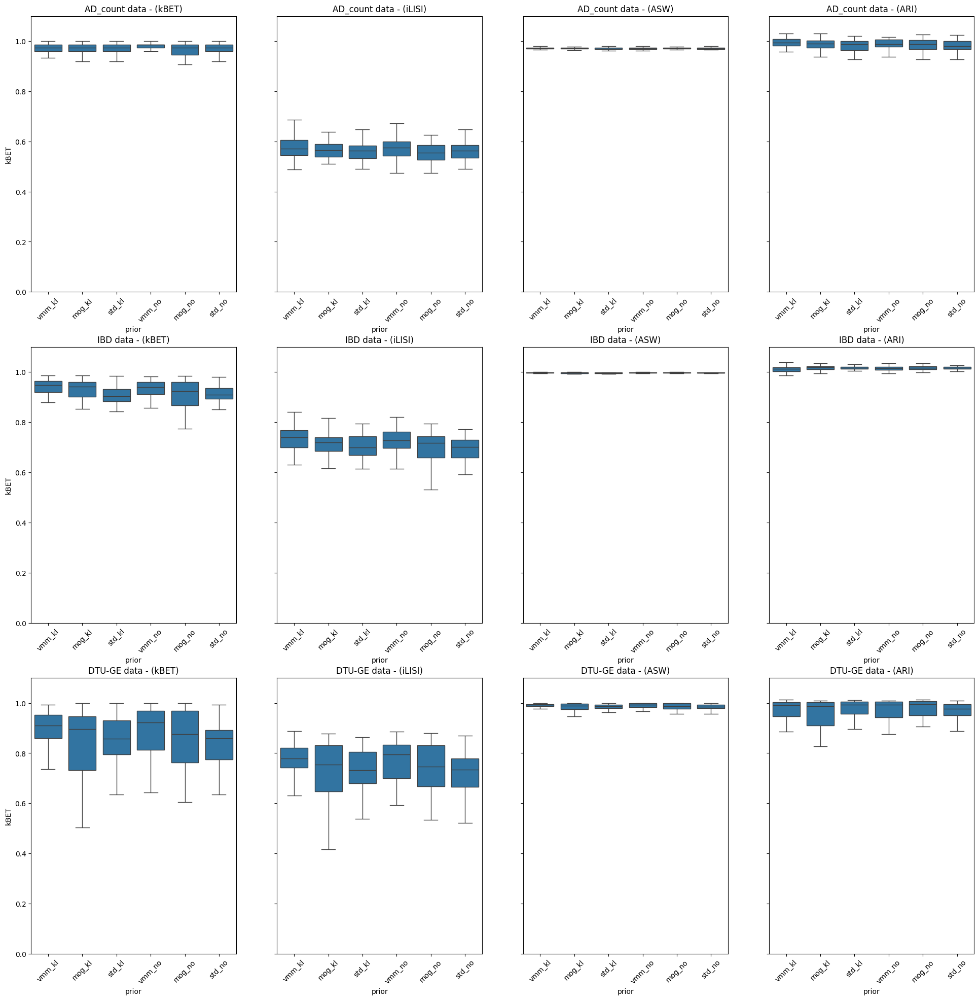

In [38]:
fig, axes = plt.subplots(3, 4, figsize=(24, 24), sharey=True)

# Data frame to save values
abaco_kbet_results = pd.DataFrame()
abaco_ilisi_results = pd.DataFrame()
abaco_asw_results = pd.DataFrame()
abaco_ari_results = pd.DataFrame()

for i, dataset in enumerate(datasets):
    kbet_results = []
    ilisi_results = []
    asw_results = []
    ari_results = []

    for j, prior in enumerate(priors):
        abaco_runs = multi_runs[(multi_runs["dataset"] == dataset) & (multi_runs["prior"] == prior)]
        
        for k, abaco_run in enumerate(abaco_runs["run"]):

            recon_data = DataTransform(abaco_run, factors = [sample_label[i], batch_label[i], bio_label[i]], count = True)

            # Compute kBET
            abaco_kbet = kBET(data = recon_data, batch_label = batch_label[i])
            # Compute iLISI
            abaco_ilisi = iLISI_norm(data = recon_data, batch_label = batch_label[i])
            # Compute ASW
            abaco_asw = ASW(data = recon_data, interest_label = batch_label[i])
            abaco_asw = 1 - abs(abaco_asw)
            # Compute ARI
            abaco_ari = ARI_GMM(data = recon_data, interest_label=batch_label[i])
            abaco_ari = 1 - abaco_ari

            # Save value
            kbet_results.append({
                "iter": k,
                "prior": prior,
                "kBET": abaco_kbet,
                "dataset": dataset
            })
            ilisi_results.append({
                "iter": k,
                "prior": prior,
                "iLISI": abaco_ilisi,
                "dataset": dataset
            })
            asw_results.append({
                "iter": k,
                "prior": prior,
                "ASW": abaco_asw,
                "dataset": dataset
            })
            ari_results.append({
                "iter": k,
                "prior": prior,
                "ARI": abaco_ari,
                "dataset": dataset
            })
    
    sns.boxplot(
    data=pd.DataFrame(kbet_results),
    x='prior',
    y='kBET',
    ax=axes[i][0],
    showfliers=False,
    )
    axes[i][0].set_title(f'{dataset} data - (kBET)')
    axes[i][0].tick_params(axis='x', rotation=45)
    axes[i][0].set_ylim([0, 1.1])

    sns.boxplot(
    data=pd.DataFrame(ilisi_results),
    x='prior',
    y='iLISI',
    ax=axes[i][1],
    showfliers=False,
    )
    axes[i][1].set_title(f'{dataset} data - (iLISI)')
    axes[i][1].tick_params(axis='x', rotation=45)
    axes[i][0].set_ylim([0, 1.1])

    sns.boxplot(
    data=pd.DataFrame(asw_results),
    x='prior',
    y='ASW',
    ax=axes[i][2],
    showfliers=False
    )
    axes[i][2].set_title(f'{dataset} data - (ASW)')
    axes[i][2].tick_params(axis='x', rotation=45)
    axes[i][0].set_ylim([0, 1.1])

    sns.boxplot(
    data=pd.DataFrame(ari_results),
    x='prior',
    y='ARI',
    ax=axes[i][3],
    showfliers=False
    )
    axes[i][3].set_title(f'{dataset} data - (ARI)')
    axes[i][3].tick_params(axis='x', rotation=45)
    axes[i][0].set_ylim([0, 1.1])

    abaco_kbet_results = pd.concat([abaco_kbet_results, pd.DataFrame(kbet_results)], axis=0)
    abaco_ilisi_results = pd.concat([abaco_ilisi_results, pd.DataFrame(ilisi_results)], axis=0)
    abaco_asw_results = pd.concat([abaco_asw_results, pd.DataFrame(asw_results)], axis=0)
    abaco_ari_results = pd.concat([abaco_ari_results, pd.DataFrame(ari_results)], axis=0)

### Inclusion of metrics for final plot (among methods)

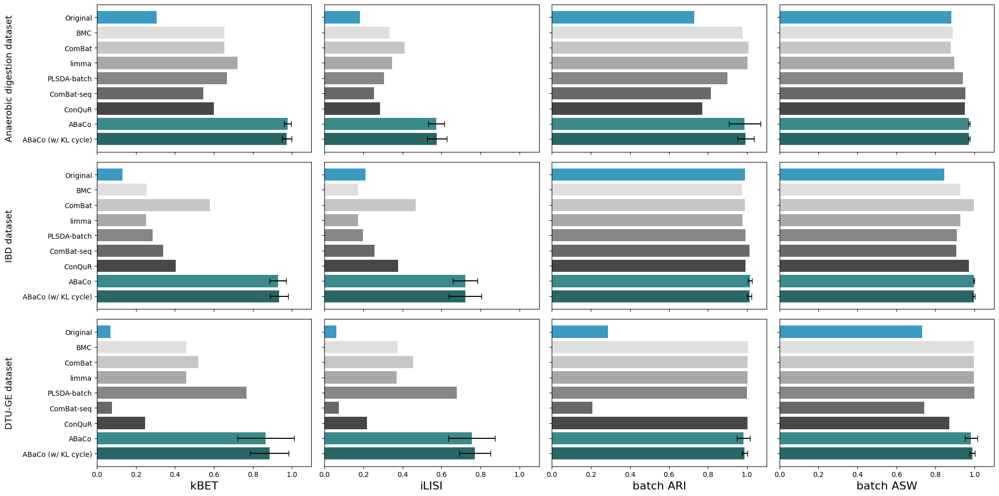

In [39]:
# Start subplot
fig, axes = plt.subplots(3, 4, figsize = (20,10), sharey=True, sharex=True)

# Selected ABaCo priors
priors = ["vmm_no","vmm_kl"]
datasets = ["AD_count", "IBD", "DTU-GE"]

# kBET

# Get mean for abaco runs

metric_df = abaco_kbet_results[abaco_kbet_results["prior"].isin(priors)]
metric = "kBET"
abaco_results = []

for prior in priors:

    for dataset in datasets:

        results = metric_df[(metric_df["dataset"]==dataset) & (metric_df["prior"]==prior)][metric]

        abaco_mean = np.mean(results)
        abaco_std = np.std(results)

        abaco_results.append({"dataset":dataset,
                            "prior":prior,
                            "mean":abaco_mean,
                            "error":abaco_std})

abaco_results = pd.DataFrame(abaco_results)

ad_abaco_mean = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_no")]["mean"].iloc[0]
ad_abaco_error = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_no")]["error"].iloc[0]
ad_abaco_kl_mean = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_kl")]["mean"].iloc[0]
ad_abaco_kl_error = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_kl")]["error"].iloc[0]

ad_kbet_results =  {"Original": ad_original_kbet, 
                   "BMC": ad_recon_bmc_kbet, 
                   "ComBat": ad_recon_combat_kbet, 
                   "limma": ad_recon_limma_kbet, 
                   "PLSDA-batch": ad_recon_plsda_kbet, 
                   "ComBat-seq": ad_recon_combatseq_kbet, 
                   "ConQuR": ad_recon_conqur_kbet, 
                   "ABaCo": ad_abaco_mean,
                   "ABaCo (w/ KL cycle)": ad_abaco_kl_mean}

ibd_abaco_mean = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_no")]["mean"].iloc[0]
ibd_abaco_error = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_no")]["error"].iloc[0]
ibd_abaco_kl_mean = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_kl")]["mean"].iloc[0]
ibd_abaco_kl_error = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_kl")]["error"].iloc[0]

ibd_kbet_results = {"Original": ibd_original_kbet, 
                   "BMC": ibd_recon_bmc_kbet, 
                   "ComBat": ibd_recon_combat_kbet, 
                   "limma": ibd_recon_limma_kbet, 
                   "PLSDA-batch": ibd_recon_plsda_kbet, 
                   "ComBat-seq": ibd_recon_combatseq_kbet, 
                   "ConQuR": ibd_recon_conqur_kbet, 
                   "ABaCo": ibd_abaco_mean,
                   "ABaCo (w/ KL cycle)": ibd_abaco_kl_mean}

dtu_abaco_mean = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_no")]["mean"].iloc[0]
dtu_abaco_error = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_no")]["error"].iloc[0]
dtu_abaco_kl_mean = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_kl")]["mean"].iloc[0]
dtu_abaco_kl_error = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_kl")]["error"].iloc[0]

dtu_kbet_results = {"Original": dtu_original_kbet, 
                   "BMC": dtu_recon_bmc_kbet, 
                   "ComBat": dtu_recon_combat_kbet, 
                   "limma": dtu_recon_limma_kbet,
                   "PLSDA-batch": dtu_recon_plsda_kbet, 
                   "ComBat-seq": dtu_recon_combatseq_kbet, 
                   "ConQuR": dtu_recon_conqur_kbet, 
                   "ABaCo": dtu_abaco_mean,
                   "ABaCo (w/ KL cycle)": dtu_abaco_kl_mean}


muted = sns.color_palette("Greys", n_colors=8)[1:7]
# highlight = sns.color_palette("Set1", n_colors=2)
highlight = ["#2D9797", "#1F7171"]
base = ["#24A4D8"]

new_palette = base + muted + highlight

methods = list(ad_kbet_results.keys())
errors = [0]*len(methods)
errors[methods.index("ABaCo")] = ad_abaco_error
errors[methods.index("ABaCo (w/ KL cycle)")] = ad_abaco_kl_error

sns.barplot(
    y = ad_kbet_results.keys(),
    x = [ad_kbet_results[k] for k in ad_kbet_results.keys()],
    ax = axes[0,0],
    palette = new_palette,
)

for idx, method in enumerate(methods):
    err = errors[idx]
    if err > 0:
        axes[0,0].errorbar(
            x       = ad_kbet_results[method],
            y       = idx,
            xerr    = err,
            fmt     = 'none',
            ecolor  = 'black',
            capsize = 4
        )

# axes[0, 0].set_title("AD count data (kBET)", fontsize=14)
# axes[0, 0].set_xlabel("Method", fontsize=12)
# axes[0, 0].set_ylabel("kBET", fontsize=12)
axes[0, 0].set_xlim(0, 1.1)

sns.barplot(
    y = ibd_kbet_results.keys(),
    x = [ibd_kbet_results[k] for k in ibd_kbet_results.keys()],
    ax = axes[1,0],
    palette = new_palette
)

errors = [0]*len(methods)
errors[methods.index("ABaCo")] = ibd_abaco_error
errors[methods.index("ABaCo (w/ KL cycle)")] = ibd_abaco_kl_error

for idx, method in enumerate(methods):
    err = errors[idx]
    if err > 0:
        axes[1,0].errorbar(
            x       = ibd_kbet_results[method],
            y       = idx,
            xerr    = err,
            fmt     = 'none',
            ecolor  = 'black',
            capsize = 4
        )

# axes[1, 0].set_title("IBD data (kBET)", fontsize=14)
# axes[1, 0].set_xlabel("Method", fontsize=12)
# axes[1, 0].set_ylabel("kBET", fontsize=12)
axes[1, 0].set_xlim(0, 1.1)

sns.barplot(
    y = dtu_kbet_results.keys(),
    x = [dtu_kbet_results[k] for k in dtu_kbet_results.keys()],
    ax = axes[2,0],
    palette = new_palette
)

errors = [0]*len(methods)
errors[methods.index("ABaCo")] = dtu_abaco_error
errors[methods.index("ABaCo (w/ KL cycle)")] = dtu_abaco_kl_error

for idx, method in enumerate(methods):
    err = errors[idx]
    if err > 0:
        axes[2,0].errorbar(
            x       = dtu_kbet_results[method],
            y       = idx,
            xerr    = err,
            fmt     = 'none',
            ecolor  = 'black',
            capsize = 4
        )

# axes[2, 0].set_title("DTU-GE data (kBET)", fontsize=14)
# axes[2, 0].set_xlabel("Method", fontsize=12)
# axes[2, 0].set_ylabel("kBET", fontsize=12)
axes[2, 0].set_xlim(0, 1.1)



# ASW

# Get mean for abaco runs

metric_df = abaco_asw_results[abaco_asw_results["prior"].isin(priors)]
metric = "ASW"
abaco_results = []

for prior in priors:

    for dataset in datasets:

        results = metric_df[(metric_df["dataset"]==dataset) & (metric_df["prior"]==prior)][metric]

        abaco_mean = np.mean(results)
        abaco_std = np.std(results)

        abaco_results.append({"dataset":dataset,
                            "prior":prior,
                            "mean":abaco_mean,
                            "error":abaco_std})

abaco_results = pd.DataFrame(abaco_results)

ad_abaco_mean = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_no")]["mean"].iloc[0]
ad_abaco_error = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_no")]["error"].iloc[0]
ad_abaco_kl_mean = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_kl")]["mean"].iloc[0]
ad_abaco_kl_error = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_kl")]["error"].iloc[0]

ad_asw_results =  {"Original": ad_original_asw, 
                   "BMC": ad_recon_bmc_asw, 
                   "ComBat": ad_recon_combat_asw, 
                   "limma": ad_recon_limma_asw, 
                   "PLSDA-batch": ad_recon_plsda_asw, 
                   "ComBat-seq": ad_recon_combatseq_asw, 
                   "ConQuR": ad_recon_conqur_asw, 
                   "ABaCo": ad_abaco_mean,
                   "ABaCo (w/ KL cycle)": ad_abaco_kl_mean}

ibd_abaco_mean = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_no")]["mean"].iloc[0]
ibd_abaco_error = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_no")]["error"].iloc[0]
ibd_abaco_kl_mean = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_kl")]["mean"].iloc[0]
ibd_abaco_kl_error = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_kl")]["error"].iloc[0]

ibd_asw_results = {"Original": ibd_original_asw, 
                   "BMC": ibd_recon_bmc_asw, 
                   "ComBat": ibd_recon_combat_asw, 
                   "limma": ibd_recon_limma_asw, 
                   "PLSDA-batch": ibd_recon_plsda_asw, 
                   "ComBat-seq": ibd_recon_combatseq_asw, 
                   "ConQuR": ibd_recon_conqur_asw, 
                   "ABaCo": ibd_abaco_mean,
                   "ABaCo (w/ KL cycle)": ibd_abaco_kl_mean}

dtu_abaco_mean = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_no")]["mean"].iloc[0]
dtu_abaco_error = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_no")]["error"].iloc[0]
dtu_abaco_kl_mean = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_kl")]["mean"].iloc[0]
dtu_abaco_kl_error = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_kl")]["error"].iloc[0]

dtu_asw_results = {"Original": dtu_original_asw, 
                   "BMC": dtu_recon_bmc_asw, 
                   "ComBat": dtu_recon_combat_asw, 
                   "limma": dtu_recon_limma_asw, 
                   "PLSDA-batch": dtu_recon_plsda_asw, 
                   "ComBat-seq": dtu_recon_combatseq_asw, 
                   "ConQuR": dtu_recon_conqur_asw, 
                   "ABaCo": dtu_abaco_mean,
                   "ABaCo (w/ KL cycle)": dtu_abaco_kl_mean}

palette = list(reversed(sns.color_palette("tab10", n_colors=8)))
dtu_palette = [col for i, col in enumerate(palette) if i != 6]

sns.barplot(
    y = ad_asw_results.keys(),
    x = [ad_asw_results[k] for k in ad_asw_results.keys()],
    ax = axes[0,3],
    palette = new_palette,
)

errors = [0]*len(methods)
errors[methods.index("ABaCo")] = ad_abaco_error
errors[methods.index("ABaCo (w/ KL cycle)")] = ad_abaco_kl_error

for idx, method in enumerate(methods):
    err = errors[idx]
    if err > 0:
        axes[0,3].errorbar(
            x       = ad_asw_results[method],
            y       = idx,
            xerr    = err,
            fmt     = 'none',
            ecolor  = 'black',
            capsize = 4
        )

# axes[0, 3].set_title("AD count data (ASW)", fontsize=14)
# axes[0, 1].set_xlabel("Method", fontsize=12)
# axes[0, 1].set_ylabel("ASW", fontsize=12)
axes[0, 3].set_xlim(0, 1.1)

sns.barplot(
    y = ibd_asw_results.keys(),
    x = [ibd_asw_results[k] for k in ibd_asw_results.keys()],
    ax = axes[1,3],
    palette = new_palette
)

errors = [0]*len(methods)
errors[methods.index("ABaCo")] = ibd_abaco_error
errors[methods.index("ABaCo (w/ KL cycle)")] = ibd_abaco_kl_error

for idx, method in enumerate(methods):
    err = errors[idx]
    if err > 0:
        axes[1,3].errorbar(
            x       = ibd_asw_results[method],
            y       = idx,
            xerr    = err,
            fmt     = 'none',
            ecolor  = 'black',
            capsize = 4
        )

# axes[1, 3].set_title("IBD data (ASW)", fontsize=14)
# axes[1, 1].set_xlabel("Method", fontsize=12)
# axes[1, 1].set_ylabel("ASW", fontsize=12)
axes[1, 3].set_xlim(0, 1.1)

sns.barplot(
    y = dtu_asw_results.keys(),
    x = [dtu_asw_results[k] for k in dtu_asw_results.keys()],
    ax = axes[2,3],
    palette = new_palette
)

errors = [0]*len(methods)
errors[methods.index("ABaCo")] = dtu_abaco_error
errors[methods.index("ABaCo (w/ KL cycle)")] = dtu_abaco_kl_error

for idx, method in enumerate(methods):
    err = errors[idx]
    if err > 0:
        axes[2,3].errorbar(
            x       = dtu_asw_results[method],
            y       = idx,
            xerr    = err,
            fmt     = 'none',
            ecolor  = 'black',
            capsize = 4
        )

# axes[2, 3].set_title("DTU-GE data (ASW)", fontsize=14)
# axes[2, 1].set_xlabel("Method", fontsize=12)
# axes[2, 1].set_ylabel("ASW", fontsize=12)
axes[2, 3].set_xlim(0, 1.1)



# ARI

# Get mean for abaco runs

metric_df = abaco_ari_results[abaco_ari_results["prior"].isin(priors)]
metric = "ARI"
abaco_results = []

for prior in priors:

    for dataset in datasets:

        results = metric_df[(metric_df["dataset"]==dataset) & (metric_df["prior"]==prior)][metric]

        abaco_mean = np.mean(results)
        abaco_std = np.std(results)

        abaco_results.append({"dataset":dataset,
                            "prior":prior,
                            "mean":abaco_mean,
                            "error":abaco_std})

abaco_results = pd.DataFrame(abaco_results)

ad_abaco_mean = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_no")]["mean"].iloc[0]
ad_abaco_error = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_no")]["error"].iloc[0]
ad_abaco_kl_mean = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_kl")]["mean"].iloc[0]
ad_abaco_kl_error = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_kl")]["error"].iloc[0]

ad_ari_results =  {"Original": ad_original_ari, 
                   "BMC": ad_recon_bmc_ari, 
                   "ComBat": ad_recon_combat_ari, 
                   "limma": ad_recon_limma_ari, 
                   "PLSDA-batch": ad_recon_plsda_ari, 
                   "ComBat-seq": ad_recon_combatseq_ari, 
                   "ConQuR": ad_recon_conqur_ari, 
                   "ABaCo": ad_abaco_mean,
                   "ABaCo (w/ KL cycle)": ad_abaco_kl_mean}

ibd_abaco_mean = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_no")]["mean"].iloc[0]
ibd_abaco_error = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_no")]["error"].iloc[0]
ibd_abaco_kl_mean = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_kl")]["mean"].iloc[0]
ibd_abaco_kl_error = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_kl")]["error"].iloc[0]

ibd_ari_results = {"Original": ibd_original_ari, 
                   "BMC": ibd_recon_bmc_ari, 
                   "ComBat": ibd_recon_combat_ari, 
                   "limma": ibd_recon_limma_ari, 
                   "PLSDA-batch": ibd_recon_plsda_ari, 
                   "ComBat-seq": ibd_recon_combatseq_ari, 
                   "ConQuR": ibd_recon_conqur_ari, 
                   "ABaCo": ibd_abaco_mean,
                   "ABaCo (w/ KL cycle)": ibd_abaco_kl_mean}

ad_abaco_mean = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_no")]["mean"].iloc[0]
ad_abaco_error = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_no")]["error"].iloc[0]
ad_abaco_kl_mean = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_kl")]["mean"].iloc[0]
ad_abaco_kl_error = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_kl")]["error"].iloc[0]

dtu_ari_results = {"Original": dtu_original_ari, 
                   "BMC": dtu_recon_bmc_ari, 
                   "ComBat": dtu_recon_combat_ari, 
                   "limma": dtu_recon_limma_ari, 
                   "PLSDA-batch": dtu_recon_plsda_ari, 
                   "ComBat-seq": dtu_recon_combatseq_ari, 
                   "ConQuR": dtu_recon_conqur_ari, 
                   "ABaCo": dtu_abaco_mean,
                   "ABaCo (w/ KL cycle)": dtu_abaco_kl_mean}

palette = list(reversed(sns.color_palette("tab10", n_colors=8)))

sns.barplot(
    y = ad_ari_results.keys(),
    x = [ad_ari_results[k] for k in ad_ari_results.keys()],
    ax = axes[0,2],
    palette = new_palette,
)

errors = [0]*len(methods)
errors[methods.index("ABaCo")] = ad_abaco_error
errors[methods.index("ABaCo (w/ KL cycle)")] = ad_abaco_kl_error

for idx, method in enumerate(methods):
    err = errors[idx]
    if err > 0:
        axes[0,2].errorbar(
            x       = ad_ari_results[method],
            y       = idx,
            xerr    = err,
            fmt     = 'none',
            ecolor  = 'black',
            capsize = 4
        )

# axes[0, 2].set_title("AD count data (ARI)", fontsize=14)
# axes[0, 2].set_xlabel("Method", fontsize=12)
# axes[0, 2].set_ylabel("ARI", fontsize=12)
axes[0, 2].set_xlim(0, 1.1)

sns.barplot(
    y = ibd_ari_results.keys(),
    x = [ibd_ari_results[k] for k in ibd_ari_results.keys()],
    ax = axes[1,2],
    palette = new_palette
)

errors = [0]*len(methods)
errors[methods.index("ABaCo")] = ibd_abaco_error
errors[methods.index("ABaCo (w/ KL cycle)")] = ibd_abaco_kl_error

for idx, method in enumerate(methods):
    err = errors[idx]
    if err > 0:
        axes[1,2].errorbar(
            x       = ibd_ari_results[method],
            y       = idx,
            xerr    = err,
            fmt     = 'none',
            ecolor  = 'black',
            capsize = 4
        )

# axes[1, 2].set_title("IBD data (ARI)", fontsize=14)
# axes[1, 2].set_xlabel("Method", fontsize=12)
# axes[1, 2].set_ylabel("ARI", fontsize=12)
axes[1, 2].set_xlim(0, 1.1)

sns.barplot(
    y = dtu_ari_results.keys(),
    x = [dtu_ari_results[k] for k in dtu_ari_results.keys()],
    ax = axes[2,2],
    palette = new_palette
)

errors = [0]*len(methods)
errors[methods.index("ABaCo")] = dtu_abaco_error
errors[methods.index("ABaCo (w/ KL cycle)")] = dtu_abaco_kl_error

for idx, method in enumerate(methods):
    err = errors[idx]
    if err > 0:
        axes[2,2].errorbar(
            x       = dtu_ari_results[method],
            y       = idx,
            xerr    = err,
            fmt     = 'none',
            ecolor  = 'black',
            capsize = 4
        )

# axes[2, 2].set_title("DTU-GE data (ARI)", fontsize=14)
# axes[2, 2].set_xlabel("Method", fontsize=12)
# axes[2, 2].set_ylabel("ARI", fontsize=12)
axes[2, 2].set_xlim(0, 1.1)



# iLISI

# Get mean for abaco runs

metric_df = abaco_ilisi_results[abaco_ilisi_results["prior"].isin(priors)]
metric = "iLISI"
abaco_results = []

for prior in priors:

    for dataset in datasets:

        results = metric_df[(metric_df["dataset"]==dataset) & (metric_df["prior"]==prior)][metric]

        abaco_mean = np.mean(results)
        abaco_std = np.std(results)

        abaco_results.append({"dataset":dataset,
                            "prior":prior,
                            "mean":abaco_mean,
                            "error":abaco_std})

abaco_results = pd.DataFrame(abaco_results)

ad_abaco_mean = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_no")]["mean"].iloc[0]
ad_abaco_error = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_no")]["error"].iloc[0]
ad_abaco_kl_mean = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_kl")]["mean"].iloc[0]
ad_abaco_kl_error = abaco_results[(abaco_results["dataset"]=="AD_count") & (abaco_results["prior"]=="vmm_kl")]["error"].iloc[0]

ad_ilisi_results =  {"Original": ad_original_ilisi, 
                   "BMC": ad_recon_bmc_ilisi, 
                   "ComBat": ad_recon_combat_ilisi, 
                   "limma": ad_recon_limma_ilisi, 
                   "PLSDA-batch": ad_recon_plsda_ilisi, 
                   "ComBat-seq": ad_recon_combatseq_ilisi, 
                   "ConQuR": ad_recon_conqur_ilisi, 
                   "ABaCo": ad_abaco_mean,
                   "ABaCo (w/ KL cycle)": ad_abaco_kl_mean}

ibd_abaco_mean = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_no")]["mean"].iloc[0]
ibd_abaco_error = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_no")]["error"].iloc[0]
ibd_abaco_kl_mean = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_kl")]["mean"].iloc[0]
ibd_abaco_kl_error = abaco_results[(abaco_results["dataset"]=="IBD") & (abaco_results["prior"]=="vmm_kl")]["error"].iloc[0]

ibd_ilisi_results = {"Original": ibd_original_ilisi, 
                   "BMC": ibd_recon_bmc_ilisi, 
                   "ComBat": ibd_recon_combat_ilisi, 
                   "limma": ibd_recon_limma_ilisi, 
                   "PLSDA-batch": ibd_recon_plsda_ilisi, 
                   "ComBat-seq": ibd_recon_combatseq_ilisi, 
                   "ConQuR": ibd_recon_conqur_ilisi, 
                   "ABaCo": ibd_abaco_mean,
                   "ABaCo (w/ KL cycle)": ibd_abaco_kl_mean}

dtu_abaco_mean = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_no")]["mean"].iloc[0]
dtu_abaco_error = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_no")]["error"].iloc[0]
dtu_abaco_kl_mean = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_kl")]["mean"].iloc[0]
dtu_abaco_kl_error = abaco_results[(abaco_results["dataset"]=="DTU-GE") & (abaco_results["prior"]=="vmm_kl")]["error"].iloc[0]

dtu_ilisi_results = {"Original": dtu_original_ilisi, 
                   "BMC": dtu_recon_bmc_ilisi, 
                   "ComBat": dtu_recon_combat_ilisi, 
                   "limma": dtu_recon_limma_ilisi, 
                   "PLSDA-batch": dtu_recon_plsda_ilisi, 
                   "ComBat-seq": dtu_recon_combatseq_ilisi, 
                   "ConQuR": dtu_recon_conqur_ilisi, 
                   "ABaCo": dtu_abaco_mean,
                   "ABaCo (w/ KL cycle)": dtu_abaco_kl_mean}

palette = list(reversed(sns.color_palette("tab10", n_colors=8)))

sns.barplot(
    y = ad_ilisi_results.keys(),
    x = [ad_ilisi_results[k] for k in ad_ilisi_results.keys()],
    ax = axes[0,1],
    palette = new_palette,
)

errors = [0]*len(methods)
errors[methods.index("ABaCo")] = ad_abaco_error
errors[methods.index("ABaCo (w/ KL cycle)")] = ad_abaco_kl_error

for idx, method in enumerate(methods):
    err = errors[idx]
    if err > 0:
        axes[0,1].errorbar(
            x       = ad_ilisi_results[method],
            y       = idx,
            xerr    = err,
            fmt     = 'none',
            ecolor  = 'black',
            capsize = 4
        )

# axes[0, 1].set_title("AD count data (iLISI)", fontsize=14)
# axes[0, 3].set_xlabel("Method", fontsize=12)
# axes[0, 3].set_ylabel("iLISI", fontsize=12)
axes[0, 1].set_xlim(0, 1.1)

sns.barplot(
    y = ibd_ilisi_results.keys(),
    x = [ibd_ilisi_results[k] for k in ibd_ilisi_results.keys()],
    ax = axes[1,1],
    palette = new_palette
)

errors = [0]*len(methods)
errors[methods.index("ABaCo")] = ibd_abaco_error
errors[methods.index("ABaCo (w/ KL cycle)")] = ibd_abaco_kl_error

for idx, method in enumerate(methods):
    err = errors[idx]
    if err > 0:
        axes[1,1].errorbar(
            x       = ibd_ilisi_results[method],
            y       = idx,
            xerr    = err,
            fmt     = 'none',
            ecolor  = 'black',
            capsize = 4
        )

# axes[1, 1].set_title("IBD data (iLISI)", fontsize=14)
# axes[1, 3].set_xlabel("Method", fontsize=12)
# axes[1, 3].set_ylabel("iLISI", fontsize=12)
axes[1, 1].set_xlim(0, 1.1)

sns.barplot(
    y = dtu_ilisi_results.keys(),
    x = [dtu_ilisi_results[k] for k in dtu_ilisi_results.keys()],
    ax = axes[2,1],
    palette = new_palette
)

errors = [0]*len(methods)
errors[methods.index("ABaCo")] = dtu_abaco_error
errors[methods.index("ABaCo (w/ KL cycle)")] = dtu_abaco_kl_error

for idx, method in enumerate(methods):
    err = errors[idx]
    if err > 0:
        axes[2,1].errorbar(
            x       = dtu_ilisi_results[method],
            y       = idx,
            xerr    = err,
            fmt     = 'none',
            ecolor  = 'black',
            capsize = 4
        )

# axes[2, 1].set_title("DTU-GE data (iLISI)", fontsize=14)
# axes[2, 3].set_xlabel("Method", fontsize=12)
# axes[2, 3].set_ylabel("iLISI", fontsize=12)
axes[2, 1].set_xlim(0, 1.1)

axes[2, 0].set_xlabel("kBET", fontsize=16)
axes[2, 1].set_xlabel("iLISI", fontsize=16)
axes[2, 2].set_xlabel("batch ARI", fontsize=16)
axes[2, 3].set_xlabel("batch ASW", fontsize=16)

axes[0, 0].set_ylabel("Anaerobic digestion dataset", rotation = 90, fontsize=13, labelpad=12)
axes[1, 0].set_ylabel("IBD dataset", rotation = 90, fontsize=13, labelpad=12)
axes[2, 0].set_ylabel("DTU-GE dataset", rotation = 90, fontsize=13, labelpad=12)

plt.tight_layout()
plt.show()

### RESULTS FIRST PLOT: PCoAs (AD count) plus performance metrics plots

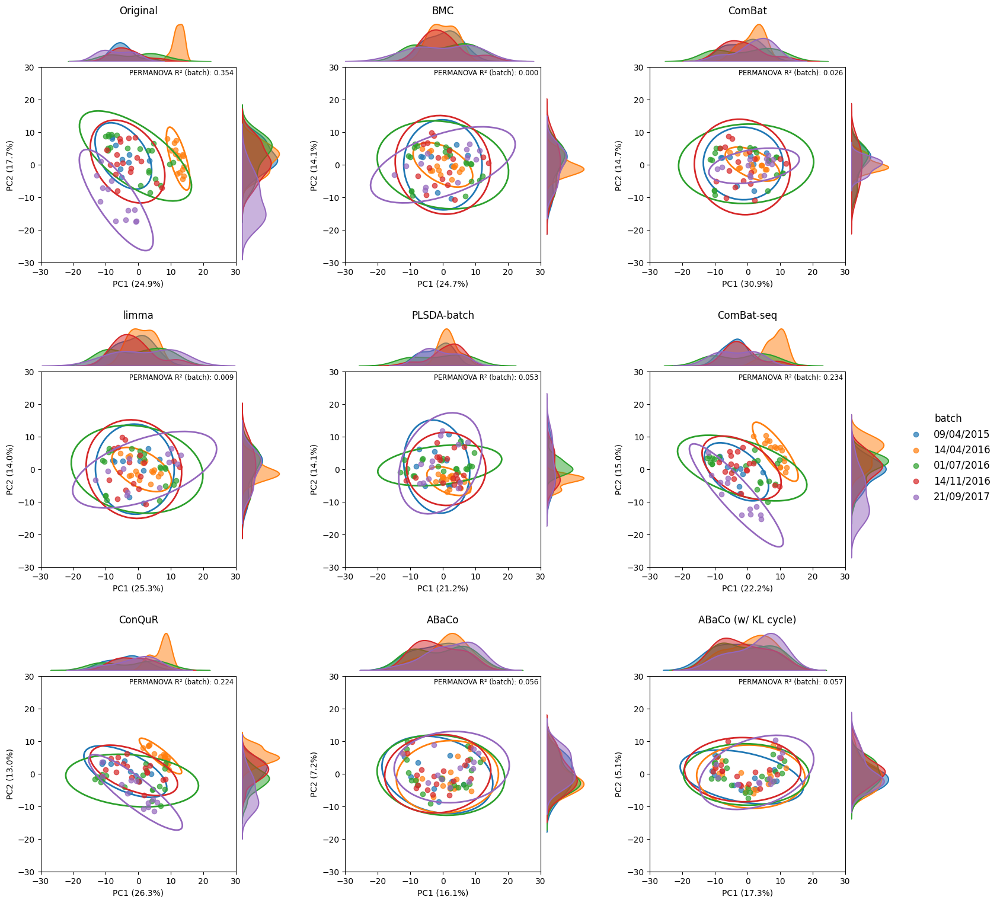

In [40]:
# Original data state
ad_pcoa, ad_explained = pcoa_aitchison(ad_count_data_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
# Other methods
ad_pcoa_bmc, ad_exp_bmc = pcoa_aitchison(ad_recon_bmc, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_combat, ad_exp_combat = pcoa_aitchison(ad_recon_combat, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_limma, ad_exp_limma = pcoa_aitchison(ad_recon_limma, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_plsda, ad_exp_plsda = pcoa_aitchison(ad_recon_plsda, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_combatseq, ad_exp_combatseq = pcoa_aitchison(ad_recon_combatseq_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_conqur, ad_exp_conqur = pcoa_aitchison(ad_recon_conqur_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
# ABaCo
ad_pcoa_abaco, ad_exp_abaco = pcoa_aitchison(ad_recon_vmm_no_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_abaco_kl, ad_exp_abaco_kl = pcoa_aitchison(ad_recon_vmm_kl_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)

fig, axes = plt.subplots(3, 3, figsize=(15,15), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(ad_pcoa, ad_count_batch_label, ad_count_data_clr, ad_count_sample_label, axes[0][0], explained=ad_explained, xlim=[-30, 30], ylim=[-30, 30], title="Original", show_legend=False)
plot_pcoa_2(ad_pcoa_bmc, ad_count_batch_label, ad_recon_bmc, ad_count_sample_label, axes[0][1], explained=ad_exp_bmc, xlim=[-30, 30], ylim=[-30, 30], title= "BMC", show_legend=False)
plot_pcoa_2(ad_pcoa_combat, ad_count_batch_label, ad_recon_combat, ad_count_sample_label, axes[0][2], explained=ad_exp_combat, xlim=[-30, 30], ylim=[-30, 30], title="ComBat", show_legend=False)
plot_pcoa_2(ad_pcoa_limma, ad_count_batch_label, ad_recon_limma, ad_count_sample_label, axes[1][0], explained=ad_exp_limma, xlim=[-30, 30], ylim=[-30, 30], title="limma", show_legend=False)
plot_pcoa_2(ad_pcoa_plsda, ad_count_batch_label, ad_recon_plsda, ad_count_sample_label, axes[1][1], explained=ad_exp_plsda, xlim=[-30, 30], ylim=[-30, 30], title="PLSDA-batch", show_legend=False)
plot_pcoa_2(ad_pcoa_combatseq, ad_count_batch_label, ad_recon_combatseq_clr, ad_count_sample_label, axes[1][2], explained=ad_exp_combatseq, xlim=[-30, 30], ylim=[-30, 30], title="ComBat-seq", show_legend=False)
plot_pcoa_2(ad_pcoa_conqur, ad_count_batch_label, ad_recon_conqur_clr, ad_count_sample_label, axes[2][0], explained=ad_exp_conqur, xlim=[-30, 30], ylim=[-30, 30], title="ConQuR", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco, ad_count_batch_label, ad_recon_vmm_no_clr, ad_count_sample_label, axes[2][1], explained=ad_exp_abaco, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco_kl, ad_count_batch_label, ad_recon_vmm_kl_clr, ad_count_sample_label, axes[2][2], explained=ad_exp_abaco_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo (w/ KL cycle)", show_legend=False)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=ad_count_batch_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.12, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

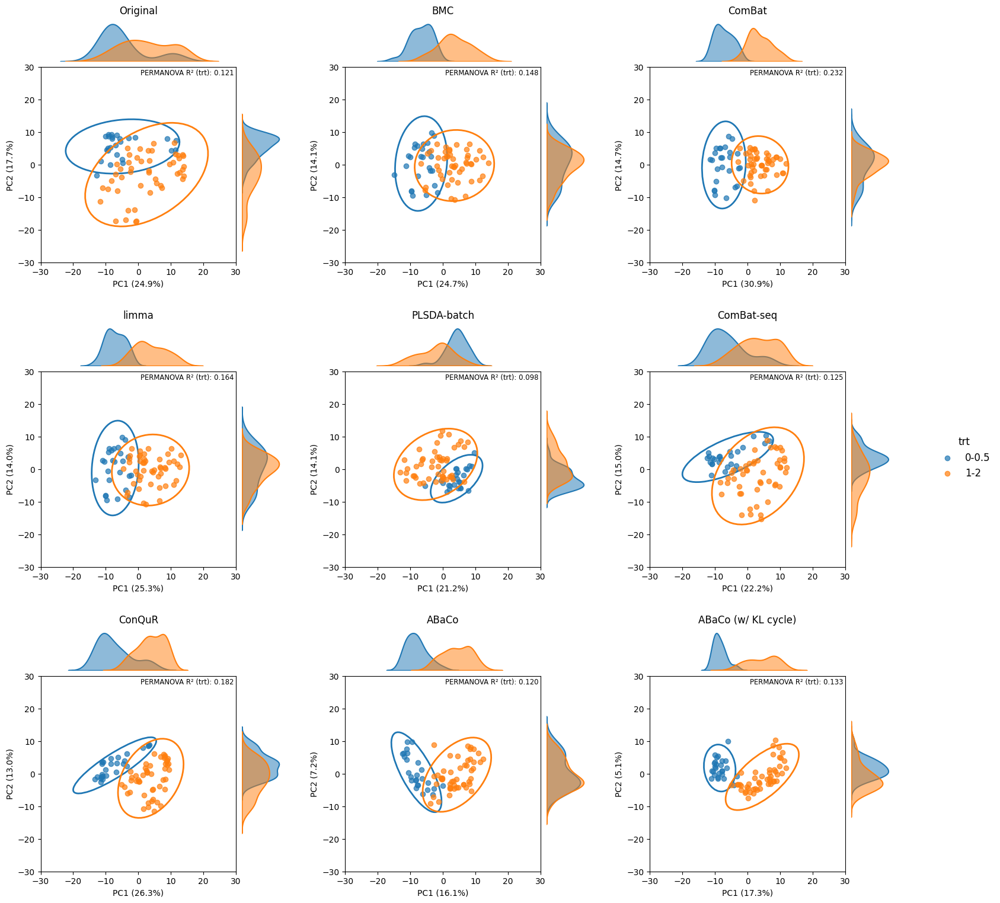

In [41]:
# Original data state
ad_pcoa, ad_explained = pcoa_aitchison(ad_count_data_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
# Other methods
ad_pcoa_bmc, ad_exp_bmc = pcoa_aitchison(ad_recon_bmc, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_combat, ad_exp_combat = pcoa_aitchison(ad_recon_combat, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_limma, ad_exp_limma = pcoa_aitchison(ad_recon_limma, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_plsda, ad_exp_plsda = pcoa_aitchison(ad_recon_plsda, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_combatseq, ad_exp_combatseq = pcoa_aitchison(ad_recon_combatseq_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_conqur, ad_exp_conqur = pcoa_aitchison(ad_recon_conqur_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
# ABaCo
ad_pcoa_abaco, ad_exp_abaco = pcoa_aitchison(ad_recon_vmm_no_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)
ad_pcoa_abaco_kl, ad_exp_abaco_kl = pcoa_aitchison(ad_recon_vmm_kl_clr, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label)

fig, axes = plt.subplots(3, 3, figsize=(15,15), constrained_layout = True, gridspec_kw={"wspace":0.1, "hspace":0.1})

plot_pcoa_2(ad_pcoa, ad_count_bio_label, ad_count_data_clr, ad_count_sample_label, axes[0][0], explained=ad_explained, xlim=[-30, 30], ylim=[-30, 30], title="Original", show_legend=False)
plot_pcoa_2(ad_pcoa_bmc, ad_count_bio_label, ad_recon_bmc, ad_count_sample_label, axes[0][1], explained=ad_exp_bmc, xlim=[-30, 30], ylim=[-30, 30], title= "BMC", show_legend=False)
plot_pcoa_2(ad_pcoa_combat, ad_count_bio_label, ad_recon_combat, ad_count_sample_label, axes[0][2], explained=ad_exp_combat, xlim=[-30, 30], ylim=[-30, 30], title="ComBat", show_legend=False)
plot_pcoa_2(ad_pcoa_limma, ad_count_bio_label, ad_recon_limma, ad_count_sample_label, axes[1][0], explained=ad_exp_limma, xlim=[-30, 30], ylim=[-30, 30], title="limma", show_legend=False)
plot_pcoa_2(ad_pcoa_plsda, ad_count_bio_label, ad_recon_plsda, ad_count_sample_label, axes[1][1], explained=ad_exp_plsda, xlim=[-30, 30], ylim=[-30, 30], title="PLSDA-batch", show_legend=False)
plot_pcoa_2(ad_pcoa_combatseq, ad_count_bio_label, ad_recon_combatseq_clr, ad_count_sample_label, axes[1][2], explained=ad_exp_combatseq, xlim=[-30, 30], ylim=[-30, 30], title="ComBat-seq", show_legend=False)
plot_pcoa_2(ad_pcoa_conqur, ad_count_bio_label, ad_recon_conqur_clr, ad_count_sample_label, axes[2][0], explained=ad_exp_conqur, xlim=[-30, 30], ylim=[-30, 30], title="ConQuR", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco, ad_count_bio_label, ad_recon_vmm_no_clr, ad_count_sample_label, axes[2][1], explained=ad_exp_abaco, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo", show_legend=False)
plot_pcoa_2(ad_pcoa_abaco_kl, ad_count_bio_label, ad_recon_vmm_kl_clr, ad_count_sample_label, axes[2][2], explained=ad_exp_abaco_kl, xlim=[-30, 30], ylim=[-30, 30], title="ABaCo (w/ KL cycle)", show_legend=False)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title=ad_count_bio_label,
    loc = "center right",
    frameon = False,
    bbox_to_anchor = (1.12, 0.5),
    fontsize=12,
    title_fontsize=12
)

fig.subplots_adjust(right=0.85)

plt.show()

### Kruskal-Wallis among top taxas across runs

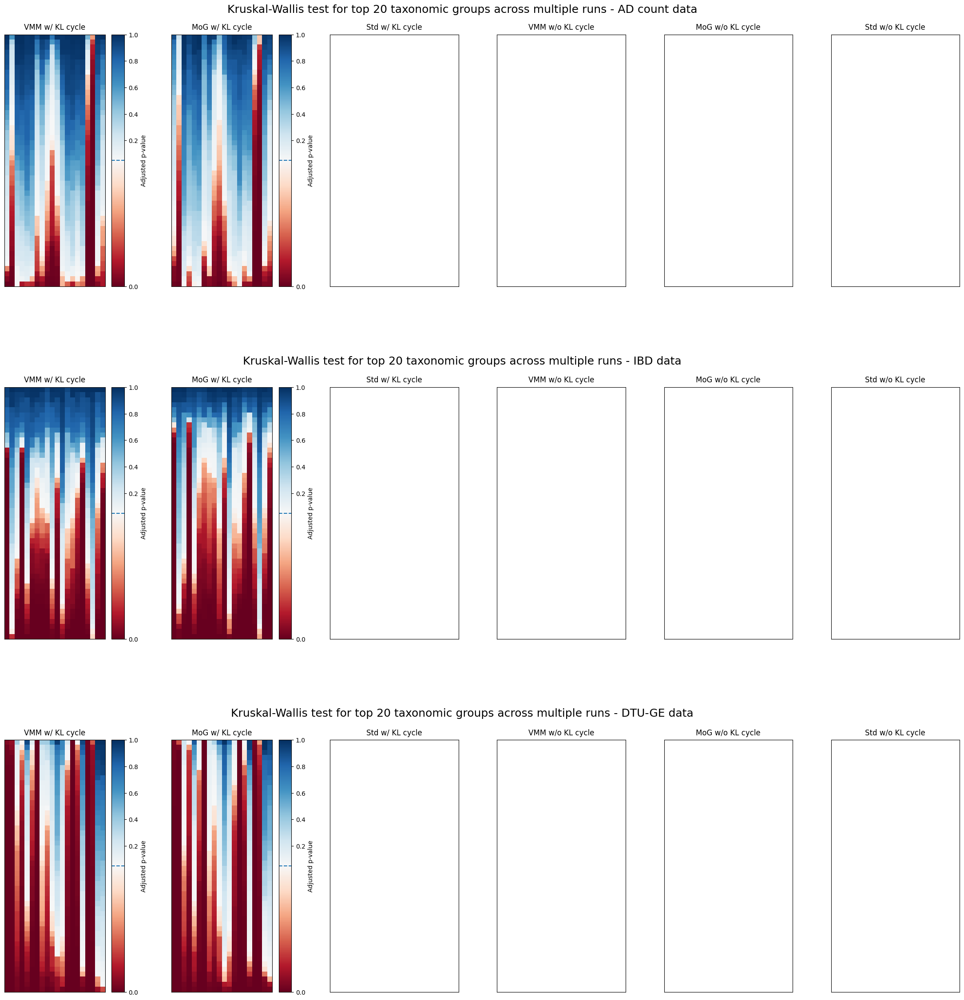

In [42]:
# Define top taxonomic groups on each dataset
ad_top_taxa = ad_count_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]
ibd_top_taxa = ibd_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]
dtu_top_taxa = dtu_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]

# Original
ad_top_taxa_cols = ad_count_data_clr.select_dtypes(include = "number").columns.intersection(ad_top_taxa)
ad_non_num_cols = ad_count_data_clr.select_dtypes(exclude = "number").columns

ibd_top_taxa_cols = ibd_data_clr.select_dtypes(include = "number").columns.intersection(ibd_top_taxa)
ibd_non_num_cols = ibd_data_clr.select_dtypes(exclude = "number").columns

dtu_top_taxa_cols = dtu_data_clr.select_dtypes(include = "number").columns.intersection(dtu_top_taxa)
dtu_non_num_cols = dtu_data_clr.select_dtypes(exclude = "number").columns

top_taxa_cols = [ad_top_taxa_cols, ibd_top_taxa_cols, dtu_top_taxa_cols]
non_num_cols = [ad_non_num_cols, ibd_non_num_cols, dtu_non_num_cols]

fig, axes = plt.subplots(3, 6, figsize=(28, 28), sharey=True)

for i, dataset in enumerate(datasets):
    kbet_results = []
    ilisi_results = []
    asw_results = []
    ari_results = []

    for j, prior in enumerate(priors):

        abaco_runs = multi_runs[(multi_runs["dataset"] == dataset) & (multi_runs["prior"] == prior)]
        
        kw_results_abaco = pd.DataFrame()

        for k, abaco_run in enumerate(abaco_runs["run"]):

            recon_data = DataTransform(abaco_run, factors = [sample_label[i], batch_label[i], bio_label[i]], count = True)

            top_taxa_abaco_data = recon_data[list(non_num_cols[i]) + list(top_taxa_cols[i])]
            kw_results_abaco = pd.concat([kw_results_abaco, kruskal_wallis_taxa(top_taxa_abaco_data, sample_label[i], batch_label[i], bio_label[i], k)], axis = 0)
        
        heat_df = kw_results_abaco.pivot(index="method", columns="taxa", values="p_adj").reindex(index = kw_results_abaco["method"].drop_duplicates().tolist()) 

        heat_sorted = heat_df.copy()

        heat_sorted.iloc[:,:] = np.sort(heat_df.values, axis=0)

        heat_df = heat_sorted

        vmin = 0.00
        vmax = 1.00
        mid = 0.05

        norm = TwoSlopeNorm(vmin = vmin, vcenter = mid, vmax = vmax)
        cmap = plt.get_cmap("RdBu")

        n_rows, n_cols = heat_df.shape

        x = np.arange(n_cols + 1)
        y = np.arange(n_rows + 1)

        cell_size = 0.3
        fig_width  = n_cols * cell_size
        fig_height = n_rows * cell_size

        ax = axes[i][j]

        im = ax.pcolormesh(
            x, y, heat_df.values, 
            norm=norm,
            cmap=cmap,
            shading="flat")

        n_cols = heat_df.shape[1]
        generic_labels = [f"Taxa {i+1}" for i in range(n_cols)]
        ax.set_xticks(np.arange(n_cols) + 0.5)
        ax.set_xticklabels(generic_labels, rotation=90, va='center', fontsize=8)

        ax.set_yticks(np.arange(n_rows) + 0.5)
        ax.set_yticklabels(heat_df.index, fontsize=8)
        ax.set_aspect('equal')
        ax.tick_params(axis='x', which='major', pad=24)

        cbar = fig.colorbar(im, ax=ax, fraction=0.1)
        cbar.set_label('Adjusted p-value')
        cbar.ax.hlines(mid, *cbar.ax.get_xlim(), linestyles='--')

for i, ax_row in enumerate(axes):
    row_title = f"Kruskal-Wallis test for top 20 taxonomic groups across multiple runs - {dataset_labels[i]} data"

    fig.text(
        0.5,
        0.90 - i*0.283,
        row_title,
        ha="center",
        va = "center",
        fontsize=18,
    )

    for j, ax in enumerate(ax_row):
        ax.set_title(prior_labels[j],
                     pad=8,
                     fontsize=12)
        
        ax.tick_params(
            left=False,
            bottom=False,
            labelleft=False,
            labelbottom=False
        )

fig.subplots_adjust(
    top=0.88,
    wspace=0.3,
    hspace=0.4
)


### SECOND PLOT: Kruskal-wallis on VMM prior configs

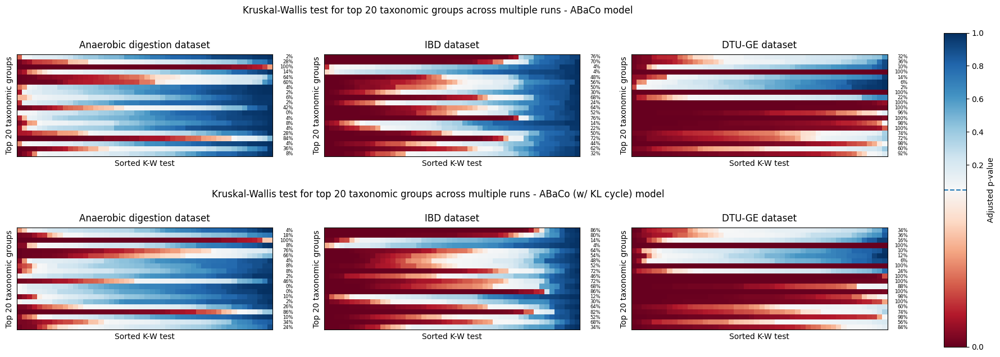

In [43]:
priors = ["vmm_no", "vmm_kl"]
prior_labels = ["ABaCo", "ABaCo (w/ KL cycle)"]
dataset_labels = ["Anaerobic digestion dataset", "IBD dataset","DTU-GE dataset"]

# Define top taxonomic groups on each dataset
ad_top_taxa = ad_count_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]
ibd_top_taxa = ibd_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]
dtu_top_taxa = dtu_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]

# Original
ad_top_taxa_cols = ad_count_data_clr.select_dtypes(include = "number").columns.intersection(ad_top_taxa)
ad_non_num_cols = ad_count_data_clr.select_dtypes(exclude = "number").columns

ibd_top_taxa_cols = ibd_data_clr.select_dtypes(include = "number").columns.intersection(ibd_top_taxa)
ibd_non_num_cols = ibd_data_clr.select_dtypes(exclude = "number").columns

dtu_top_taxa_cols = dtu_data_clr.select_dtypes(include = "number").columns.intersection(dtu_top_taxa)
dtu_non_num_cols = dtu_data_clr.select_dtypes(exclude = "number").columns

top_taxa_cols = [ad_top_taxa_cols, ibd_top_taxa_cols, dtu_top_taxa_cols]
non_num_cols = [ad_non_num_cols, ibd_non_num_cols, dtu_non_num_cols]
top_taxa_lists = [ad_top_taxa, ibd_top_taxa, dtu_top_taxa]


fig, axes = plt.subplots(2, 3, figsize=(20, 8), sharex=True, sharey=True)

for j, prior in enumerate(priors):

    for i, dataset in enumerate(datasets):

        abaco_runs = multi_runs[(multi_runs["dataset"] == dataset) & (multi_runs["prior"] == prior)]
        
        kw_results_abaco = pd.DataFrame()

        for k, abaco_run in enumerate(abaco_runs["run"]):

            recon_data = DataTransform(abaco_run, factors = [sample_label[i], batch_label[i], bio_label[i]], count = True)

            top_taxa_abaco_data = recon_data[list(non_num_cols[i]) + list(top_taxa_cols[i])]
            kw_results_abaco = pd.concat([kw_results_abaco, kruskal_wallis_taxa(top_taxa_abaco_data, sample_label[i], batch_label[i], bio_label[i], k)], axis = 0)
        
        heat_df = kw_results_abaco.pivot(index="method", columns="taxa", values="p_adj").reindex(index = kw_results_abaco["method"].drop_duplicates().tolist()) 

        heat_sorted = heat_df.copy()

        heat_sorted.iloc[:,:] = np.sort(heat_df.values, axis=0)

        heat_df = heat_sorted

        heat_df = heat_df.T

        heat_df = heat_df.reindex(index=top_taxa_lists[i])

        pct = (
            kw_results_abaco
              .groupby("taxa")["p_adj"]
              .apply(lambda x: (x < 0.05).mean() * 100)
        )
        # reindex into the exact row‐order of your heatmap
        pct = pct.reindex(top_taxa_lists[i]).fillna(0)

        vmin = 0.00
        vmax = 1.00
        mid = 0.05

        norm = TwoSlopeNorm(vmin = vmin, vcenter = mid, vmax = vmax)
        cmap = plt.get_cmap("RdBu")

        n_rows, n_cols = heat_df.shape

        x = np.arange(n_cols + 1)
        y = np.arange(n_rows + 1)

        cell_size = 0.3
        fig_width  = n_cols * cell_size
        fig_height = n_rows * cell_size

        ax = axes[j][i]

        im = ax.pcolormesh(
            x, y, heat_df.values, 
            norm=norm,
            cmap=cmap,
            shading="flat")

        for row_idx, taxon in enumerate(pct.index):
            ax.text(
                x= n_cols + 0.08*n_cols,        # a little to the right of the last cell
                y=row_idx + 0.5,         # centered in each cell 
                s=f"{pct[taxon]:.0f}%",  # integer percent
                va="center", 
                ha="right",
                fontsize=6,
                transform=ax.transData  # data‐coordinates
            )

        n_cols = heat_df.shape[1]
        generic_labels = [f"Taxa {i+1}" for i in range(n_cols)]
        # ax.set_xticks(np.arange(n_cols) + 0.5)
        # ax.set_xticklabels(generic_labels, rotation=90, va='center', fontsize=8)

        # ax.set_yticks(np.arange(n_rows) + 0.5)
        # ax.set_yticklabels(heat_df.index, fontsize=8)
        ax.set_aspect('equal')
        ax.tick_params(axis='x', which='major', pad=24)

        # cbar = fig.colorbar(im, ax=ax, fraction=0.1)
        # cbar.set_label('Adjusted p-value')
        # cbar.ax.hlines(mid, *cbar.ax.get_xlim(), linestyles='--')

        ax.set_ylabel("Top 20 taxonomic groups")
        ax.set_xlabel("Sorted K-W test")



for i, ax_row in enumerate(axes):
    row_title = f"Kruskal-Wallis test for top 20 taxonomic groups across multiple runs - {prior_labels[i]} model"

    fig.text(
        0.5,
        0.90 - i*0.41,
        row_title,
        ha="center",
        va = "center",
        fontsize=12,
    )

    for j, ax in enumerate(ax_row):
        ax.set_title(dataset_labels[j],
                     pad=8,
                     fontsize=12)
        
        ax.tick_params(
            left=False,
            bottom=False,
            labelleft=False,
            labelbottom=False
        )

fig.subplots_adjust(
    top=0.88,
    wspace=0.2,
    hspace=0.01
)

cax = fig.add_axes([0.95, 0.15, 0.02, 0.7])

cbar = fig.colorbar(im, cax=cax, fraction=0.1)
cbar.set_label('Adjusted p-value')
cbar.ax.hlines(mid, *cbar.ax.get_xlim(), linestyles='--')

plt.show()

### PERMANOVA results across runs

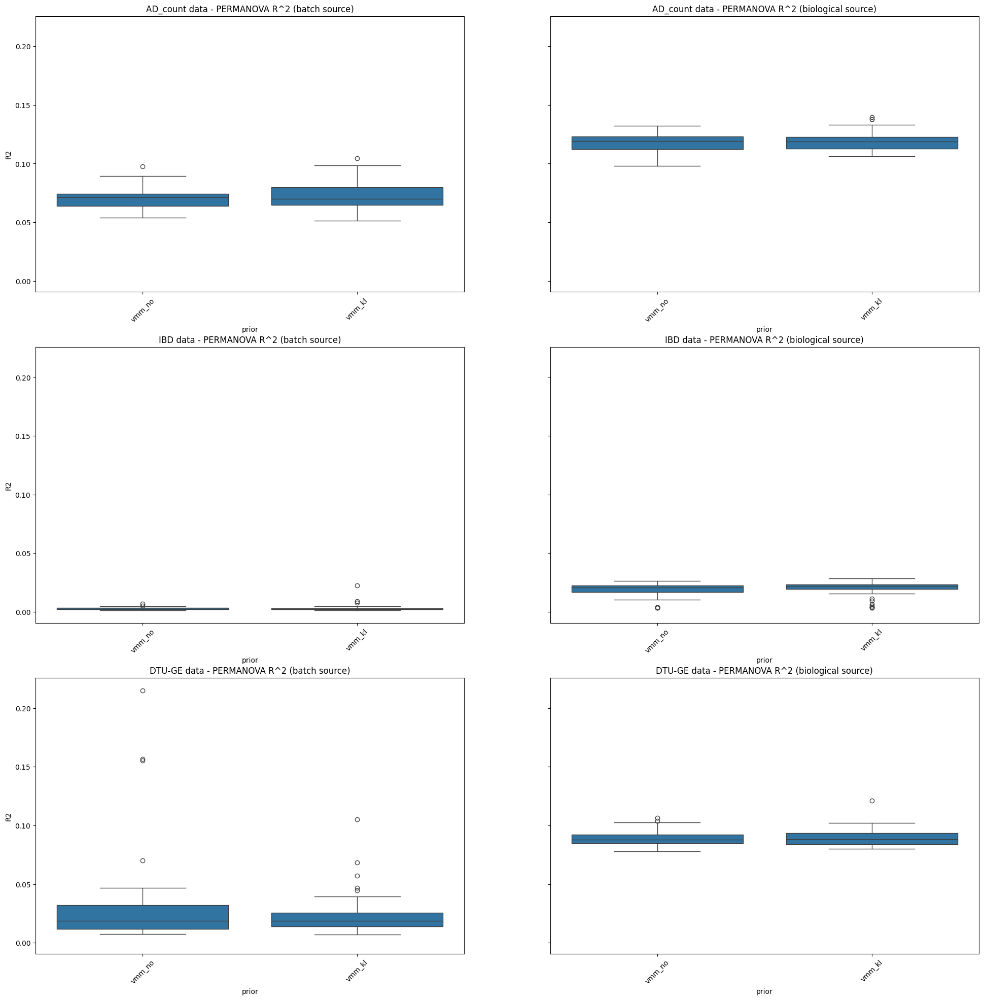

In [44]:
fig, axes = plt.subplots(3, 2, figsize=(24, 24), sharey=True)

for i, dataset in enumerate(datasets):
    batch_permas = []
    bio_permas = []

    for j, prior in enumerate(priors):

        abaco_runs = multi_runs[(multi_runs["dataset"] == dataset) & (multi_runs["prior"] == prior)]
        
        kw_results_abaco = pd.DataFrame()

        for k, abaco_run in enumerate(abaco_runs["run"]):

            recon_data = DataTransform(abaco_run, factors = [sample_label[i], batch_label[i], bio_label[i]], count = True)

            batch_perma = permanova_ait(recon_data, sample_label[i], batch_label[i])["R2"]
            bio_perma = permanova_ait(recon_data, sample_label[i], bio_label[i])["R2"]

            batch_permas.append({"iter":k, "prior": prior, "R2": batch_perma})
            bio_permas.append({"iter":k, "prior": prior, "R2": bio_perma})
    
    sns.boxplot(
    data=pd.DataFrame(batch_permas),
    x='prior',
    y='R2',
    ax=axes[i][0]
    )
    axes[i][0].set_title(f'{dataset} data - PERMANOVA R^2 (batch source)')
    axes[i][0].tick_params(axis='x', rotation=45)

    sns.boxplot(
    data=pd.DataFrame(bio_permas),
    x='prior',
    y='R2',
    ax=axes[i][1]
    )
    axes[i][1].set_title(f'{dataset} data - PERMANOVA R^2 (biological source)')
    axes[i][1].tick_params(axis='x', rotation=45)
            

### SECOND PLOT V2: Kruskal-wallis with median value for ABaCo

In [45]:
priors = ["vmm_no","vmm_kl"]
datasets = ["AD_count", "IBD", "DTU-GE"]

prior_labels = ["ABaCo", "ABaCo (w/ KL cycle)"]
dataset_labels = ["Anaerobic digestion dataset", "IBD dataset","DTU-GE dataset"]

# Define top taxonomic groups on each dataset
ad_top_taxa = ad_count_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]
ibd_top_taxa = ibd_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]
dtu_top_taxa = dtu_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]

# Original
ad_top_taxa_cols = ad_count_data_clr.select_dtypes(include = "number").columns.intersection(ad_top_taxa)
ad_non_num_cols = ad_count_data_clr.select_dtypes(exclude = "number").columns

ibd_top_taxa_cols = ibd_data_clr.select_dtypes(include = "number").columns.intersection(ibd_top_taxa)
ibd_non_num_cols = ibd_data_clr.select_dtypes(exclude = "number").columns

dtu_top_taxa_cols = dtu_data_clr.select_dtypes(include = "number").columns.intersection(dtu_top_taxa)
dtu_non_num_cols = dtu_data_clr.select_dtypes(exclude = "number").columns

top_taxa_cols = [ad_top_taxa_cols, ibd_top_taxa_cols, dtu_top_taxa_cols]
non_num_cols = [ad_non_num_cols, ibd_non_num_cols, dtu_non_num_cols]
top_taxa_lists = [ad_top_taxa, ibd_top_taxa, dtu_top_taxa]

# AD Count

# Creating dataframe to save results
ad_kw_results = pd.DataFrame()

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "Original")], axis = 0)

# BMC
ad_top_taxa_bmc_data = ad_recon_bmc[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_bmc_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "BMC")], axis = 0)

# ComBat
ad_top_taxa_combat_data = ad_recon_combat[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_combat_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "ComBat")], axis = 0)

# limma
ad_top_taxa_limma_data = ad_recon_limma[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_limma_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "limma")], axis = 0)

# PLSDA-batch
ad_top_taxa_plsda_data = ad_recon_plsda[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_plsda_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "PLSDA-batch")], axis = 0)

# ComBat-seq
ad_top_taxa_combatseq_data = ad_recon_combatseq_clr[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_combatseq_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "ComBat-seq")], axis = 0)

# ConQuR
ad_top_taxa_conqur_data = ad_recon_conqur_clr[list(ad_non_num_cols) + list(ad_top_taxa_cols)]

ad_kw_results = pd.concat([ad_kw_results, kruskal_wallis_taxa(ad_top_taxa_conqur_data, ad_count_sample_label, ad_count_batch_label, ad_count_bio_label, "ConQuR")], axis = 0)


# IBD

# Creating dataframe to save results
ibd_kw_results = pd.DataFrame()

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "Original")], axis = 0)

# BMC
ibd_top_taxa_bmc_data = ibd_recon_bmc[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_bmc_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "BMC")], axis = 0)

# ComBat
ibd_top_taxa_combat_data = ibd_recon_combat[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_combat_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "ComBat")], axis = 0)

# limma
ibd_top_taxa_limma_data = ibd_recon_limma[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_limma_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "limma")], axis = 0)

# PLSDA-batch
ibd_top_taxa_plsda_data = ibd_recon_plsda[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_plsda_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "PLSDA-batch")], axis = 0)

# ComBat-seq
ibd_top_taxa_combatseq_data = ibd_recon_combatseq_clr[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_combatseq_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "ComBat-seq")], axis = 0)

# ConQuR
ibd_top_taxa_conqur_data = ibd_recon_conqur_clr[list(ibd_non_num_cols) + list(ibd_top_taxa_cols)]

ibd_kw_results = pd.concat([ibd_kw_results, kruskal_wallis_taxa(ibd_top_taxa_conqur_data, ibd_sample_label, ibd_batch_label, ibd_bio_label, "ConQuR")], axis = 0)


# DTU-GE

# Creating dataframe to save results
dtu_kw_results = pd.DataFrame()

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "Original")], axis = 0)

# BMC
dtu_top_taxa_bmc_data = dtu_recon_bmc[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_bmc_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "BMC")], axis = 0)

# ComBat
dtu_top_taxa_combat_data = dtu_recon_combat[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_combat_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "ComBat")], axis = 0)

# limma
dtu_top_taxa_limma_data = dtu_recon_limma[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_limma_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "limma")], axis = 0)

# PLSDA-batch
dtu_top_taxa_plsda_data = dtu_recon_plsda[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_plsda_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "PLSDA-batch")], axis = 0)

# ComBat-seq
dtu_top_taxa_combatseq_data = dtu_recon_combatseq_clr[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_combatseq_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "ComBat-seq")], axis = 0)

# ConQuR
dtu_top_taxa_conqur_data = dtu_recon_conqur_clr[list(dtu_non_num_cols) + list(dtu_top_taxa_cols)]

dtu_kw_results = pd.concat([dtu_kw_results, kruskal_wallis_taxa(dtu_top_taxa_conqur_data, dtu_sample_label, dtu_batch_label, dtu_bio_label, "ConQuR")], axis = 0)

# ABaCo
abaco_results = pd.DataFrame()
for j, prior in enumerate(priors):

    for i, dataset in enumerate(datasets):

        abaco_runs = multi_runs[(multi_runs["dataset"] == dataset) & (multi_runs["prior"] == prior)]
        
        kw_results_abaco = pd.DataFrame()

        for k, abaco_run in enumerate(abaco_runs["run"]):

            recon_data = DataTransform(abaco_run, factors = [sample_label[i], batch_label[i], bio_label[i]], count = True)

            top_taxa_abaco_data = recon_data[list(non_num_cols[i]) + list(top_taxa_cols[i])]
            kw_results_abaco = pd.concat([kw_results_abaco, kruskal_wallis_taxa(top_taxa_abaco_data, sample_label[i], batch_label[i], bio_label[i], k)], axis = 0)
        
        heat_df = kw_results_abaco.pivot(index="method", columns="taxa", values="p_adj").reindex(index = kw_results_abaco["method"].drop_duplicates().tolist()) 
        abaco_res = pd.concat([heat_df.median(), heat_df.std()], axis = 1, keys=["p_adj", "error"]).reset_index(drop=False)
        abaco_res["method"] = prior_labels[j]
        abaco_res["dataset"] = dataset
        abaco_results = pd.concat([abaco_results, abaco_res], axis = 0)

# Modifying data for compatibility
ad_kw_results = ad_kw_results[["taxa", "p_adj", "method"]]
ad_kw_results["error"] = 0

ibd_kw_results = ibd_kw_results[["taxa", "p_adj", "method"]]
ibd_kw_results["error"] = 0

dtu_kw_results = dtu_kw_results[["taxa", "p_adj", "method"]]
dtu_kw_results["error"] = 0

# Introducing ABaCo results
ad_kw_results = pd.concat([ad_kw_results, abaco_results[abaco_results["dataset"] == "AD_count"].drop(columns = ["dataset"])])
ibd_kw_results = pd.concat([ibd_kw_results, abaco_results[abaco_results["dataset"] == "IBD"].drop(columns = ["dataset"])])
dtu_kw_results = pd.concat([dtu_kw_results, abaco_results[abaco_results["dataset"] == "DTU-GE"].drop(columns = ["dataset"])])

kw_results = [ad_kw_results, ibd_kw_results, dtu_kw_results]

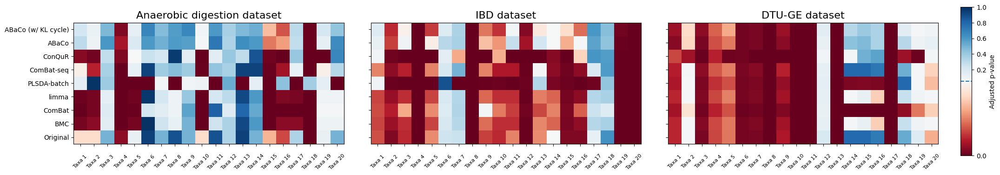

In [46]:
fig, axes = plt.subplots(1, 3, figsize=(24, 8), sharex=False, sharey=True)

for i, kw in enumerate(kw_results):

    heat_df = kw.pivot(index="method", columns="taxa", values="p_adj").reindex(index = kw["method"].drop_duplicates().tolist())
    heat_df = heat_df.reindex(columns=top_taxa_lists[i])

    vmin = 0.00
    vmax = 1.00
    mid = 0.05

    norm = TwoSlopeNorm(vmin = vmin, vcenter = mid, vmax = vmax)
    cmap = plt.get_cmap("RdBu")

    n_cols, n_rows = heat_df.shape

    y = np.arange(n_cols + 1)
    x = np.arange(n_rows + 1)

    cell_size = 0.3
    fig_width  = n_cols * cell_size
    fig_height = n_rows * cell_size

    ax = axes[i]

    im = ax.pcolormesh(
        x, y, heat_df.values, 
        norm=norm,
        cmap=cmap,
        shading="flat")

    generic_labels = [f"Taxa {j+1}" for j in range(n_rows)]
    # generic_labels = top_taxa_lists[i]
    ax.set_xticks(np.arange(n_rows) + 0.5)
    ax.set_xticklabels(generic_labels, rotation=45, va='center', fontsize=8)
    ax.set_aspect('equal')
    ax.tick_params(axis='x', which='major', pad=24)

    ax.set_title(f"{dataset_labels[i]}", fontsize=16)

    ax.set_yticks(np.arange(n_cols) + 0.5)
    ax.set_yticklabels(heat_df.index)

    # cbar = fig.colorbar(im, ax=ax, fraction=0.1)
    # cbar.set_label('Adjusted p-value')
    # cbar.ax.hlines(mid, *cbar.ax.get_xlim(), linestyles='--')

fig.subplots_adjust(
    top=0.88,
    wspace=0.1,
    hspace=0.01
)

cax = fig.add_axes([0.92, 0.3, 0.01, 0.4])

cbar = fig.colorbar(im, cax=cax, fraction=0.1)
cbar.set_label('Adjusted p-value')
cbar.ax.hlines(mid, *cbar.ax.get_xlim(), linestyles='--')

plt.show()

### SECOND PLOT V3: Pairwise difference among different runs

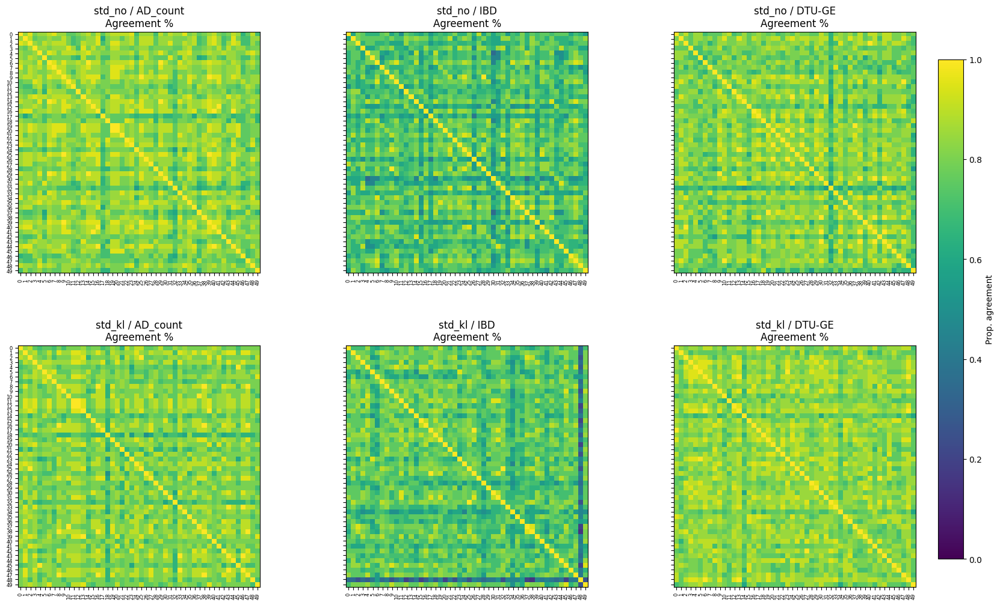

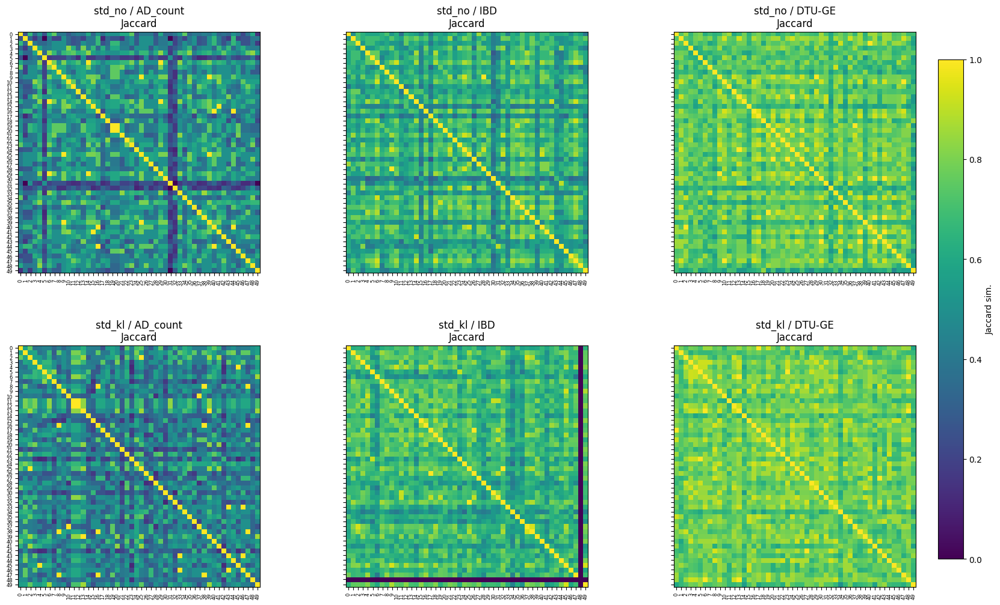

In [48]:
import itertools

priors = ["std_no", "std_kl"]
prior_labels = ["ABaCo", "ABaCo (w/ KL cycle)"]
dataset_labels = ["Anaerobic digestion dataset", "IBD dataset","DTU-GE dataset"]

# Define top taxonomic groups on each dataset
ad_top_taxa = ad_count_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]
ibd_top_taxa = ibd_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]
dtu_top_taxa = dtu_data_clr.select_dtypes(include = "number").mean(axis=0).sort_values(ascending=False).index[:20]

# Original
ad_top_taxa_cols = ad_count_data_clr.select_dtypes(include = "number").columns.intersection(ad_top_taxa)
ad_non_num_cols = ad_count_data_clr.select_dtypes(exclude = "number").columns

ibd_top_taxa_cols = ibd_data_clr.select_dtypes(include = "number").columns.intersection(ibd_top_taxa)
ibd_non_num_cols = ibd_data_clr.select_dtypes(exclude = "number").columns

dtu_top_taxa_cols = dtu_data_clr.select_dtypes(include = "number").columns.intersection(dtu_top_taxa)
dtu_non_num_cols = dtu_data_clr.select_dtypes(exclude = "number").columns

top_taxa_cols = [ad_top_taxa_cols, ibd_top_taxa_cols, dtu_top_taxa_cols]
non_num_cols = [ad_non_num_cols, ibd_non_num_cols, dtu_non_num_cols]
top_taxa_lists = [ad_top_taxa, ibd_top_taxa, dtu_top_taxa]

fig_agree, axes_ag = plt.subplots(
    nrows=len(priors), ncols=len(datasets), figsize=(24, 12),
    sharex=False, sharey=True,
    gridspec_kw={'wspace': 0.2, 'hspace': 0.3}      # tighten horizontal & vertical gaps
)
fig_jacc, axes_jc = plt.subplots(
    nrows=len(priors), ncols=len(datasets), figsize=(24, 12),
    sharex=False, sharey=True,
    gridspec_kw={'wspace': 0.2, 'hspace': 0.3}
)

abaco_results = pd.DataFrame()
for j, prior in enumerate(priors):

    for i, dataset in enumerate(datasets):

        abaco_runs = multi_runs[(multi_runs["dataset"] == dataset) & (multi_runs["prior"] == prior)]
        
        kw_results_abaco = pd.DataFrame()

        for k, abaco_run in enumerate(abaco_runs["run"]):

            min_prevalence = 0.01

            # prev_mask = (abaco_run[top_taxa_cols[i]] > 0).sum() / len(recon_data) > min_prevalence
            # keep_taxa = prev_mask.index[prev_mask]
            # filtered_taxa_data = abaco_run[list(non_num_cols[i]) + list(keep_taxa)]

            recon_data = DataTransform(abaco_run, factors = [sample_label[i], batch_label[i], bio_label[i]], count = True)

            top_taxa_abaco_data = recon_data[list(non_num_cols[i]) + list(top_taxa_cols[i])]
            kw_results_abaco = pd.concat([kw_results_abaco, kruskal_wallis_taxa(top_taxa_abaco_data, sample_label[i], batch_label[i], bio_label[i], k)], axis = 0)
        
        heat_df = kw_results_abaco.pivot(index="method", columns="taxa", values="p_adj").reindex(index = kw_results_abaco["method"].drop_duplicates().tolist()) 

        heat_df = heat_df.reindex(columns=top_taxa_lists[i])
        sig = heat_df.reset_index(drop=True) < 0.05

        runs = sig.index.tolist()
        taxa = sig.columns.size

        jaccard_runs = pd.DataFrame(index = runs, columns = runs, dtype=float)
        pairwise_counts = pd.DataFrame(index=runs, columns = runs, dtype=int)
        pairwise_prob = pd.DataFrame(index=runs, columns=runs, dtype=float)

        for r1, r2 in itertools.product(runs, runs):
            # Pairwise agreement
            pairwise_counts.loc[r1,r2] = (sig.loc[r1] == sig.loc[r2]).sum()
            pairwise_prob.loc[r1,r2] = (sig.loc[r1] == sig.loc[r2]).sum() / taxa
            # Jaccard similarity on significant taxa 
            A = sig.loc[r1]
            B = sig.loc[r2]

            intersect = (A & B).sum()
            union = (A | B).sum()

            jaccard_runs.loc[r1,r2] = intersect / union if union > 0 else 0.0

        # Agreement heatmap
        ax_ag = axes_ag[j, i]
        im_ag = ax_ag.imshow(pairwise_prob.values, aspect='equal', vmin=0, vmax=1)
        ax_ag.set_xticks(range(len(runs)))
        ax_ag.set_xticklabels(runs, rotation=90, fontsize=6)
        ax_ag.set_yticks(range(len(runs)))
        ax_ag.set_yticklabels(runs, fontsize=6)
        ax_ag.set_title(f"{prior} / {dataset}\nAgreement %")

        # Jaccard heatmap
        ax_jc = axes_jc[j, i]
        im_jc = ax_jc.imshow(jaccard_runs.values, aspect='equal', vmin=0, vmax=1)
        ax_jc.set_xticks(range(len(runs)))
        ax_jc.set_xticklabels(runs, rotation=90, fontsize=6)
        ax_jc.set_yticks(range(len(runs)))
        ax_jc.set_yticklabels(runs, fontsize=6)
        ax_jc.set_title(f"{prior} / {dataset}\nJaccard")

fig_agree.colorbar(
    im_ag, ax=axes_ag, location='right',
    pad=0.02, shrink=0.9, label="Prop. agreement"
)
fig_jacc.colorbar(
    im_jc, ax=axes_jc, location='right',
    pad=0.02, shrink=0.9, label="Jaccard sim."
)

fig_agree.tight_layout()
fig_jacc.tight_layout()
plt.show()